***
<p style="text-align: center;"><font size=6><b>Forecasting Solar Energy Adoption, New York State</b></font></p>

***

<font size=4><b>Aim</b><br>
This project aims to forecast solar energy adoption in New York State using time series models</font>

The project leverages data from the New York State Energy Research and Development Authority (NYSERDA) to develop a predictive model for "Expected KWh Annual Production." Given the growing importance of renewable energy, accurate forecasting of solar energy production is crucial for planning and policy-making.
The dataset spans several years, detailing various project attributes and their respective energy production capacities. The data was subjected to rigorous preprocessing and feature engineering to address issues such as missing values, non-uniform data intervals, and significant variations in project scales. Key transformations included creating cumulative monthly, yearly, and total expected KWh production columns to capture trends more effectively

- Forecast the 2024 "Expected kWh Annual Production" using rigorous time series modelling techniques.
- Determine the most effective time series model.

<font size=4><b>Data and Metadata</b></font><br>

<font size=3><b>Solar Electric Programs Reported by NYSERDA: Beginning 2000</b></font><br>
https://data.ny.gov/Energy-Environment/Solar-Electric-Programs-Reported-by-NYSERDA-Beginn/3x8r-34rs/about_data

<font size=2><b>Metadata</b><br>
https://data.ny.gov/api/views/3x8r-34rs/files/ea8ca61b-c426-46f5-94f5-69f185231d18?download=true&filename=NYSERDA_SolarElectric_DataDictionary.pdf





# Importing Libraries

In [1]:
import pyforest
import scipy.stats as st
from statsmodels.stats.proportion import proportion_confint,proportions_ztest
import warnings
warnings.filterwarnings('ignore')

import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as pe
import re

import math

import warnings

# Or ignore all warnings
warnings.filterwarnings("ignore")
# pd.options.display.max_columns=None
# pd.options.display.max_rows= None

pd.options.display.float_format= '{:.6f}'.format

from statsmodels.tsa.stattools import adfuller

from statsmodels.graphics.tsaplots import plot_acf, plot_pacf, month_plot, quarter_plot

from sklearn.metrics import mean_squared_error

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dropout, Dense, LSTM, GRU #can train using either GRU or LSTM

from sklearn.preprocessing import StandardScaler

import folium
from folium.plugins import heat_map
from statsmodels.tsa.seasonal import seasonal_decompose

import matplotlib.pyplot as plt
import matplotlib.dates as mdates

import numpy as np
import pandas as pd
from scipy.stats import shapiro, pearsonr, spearmanr

from sklearn.metrics import mean_squared_error, mean_absolute_percentage_error
import matplotlib.pyplot as plt
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.holtwinters import SimpleExpSmoothing, Holt, ExponentialSmoothing
from statsmodels.tsa.statespace.sarimax import SARIMAX

# Loading Data

In [2]:
with open("Solar_Electric_Programs_Reported_by_NYSERDA__Beginning_2000_20240715.csv",'rb')as file:
    df=pd.read_csv(file)
    file.close()

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 168526 entries, 0 to 168525
Data columns (total 47 columns):
 #   Column                                              Non-Null Count   Dtype  
---  ------                                              --------------   -----  
 0   Reporting Period                                    168526 non-null  object 
 1   Project Number                                      168526 non-null  object 
 2   Legacy Project Number                               55290 non-null   object 
 3   Street Address                                      10214 non-null   object 
 4   City                                                168526 non-null  object 
 5   County                                              168525 non-null  object 
 6   State                                               168526 non-null  object 
 7   ZIP Code                                            168526 non-null  object 
 8   Incorporated Municipality                           167874 non-n

# Columns


In [4]:
vpr_cols=df.iloc[:,-9:]

## Prevailing Wage Adder

In [5]:
vpr_cols['Prevailing Wage Adder'].describe()

count    168526.000000
mean        568.439532
std       21258.502618
min           0.000000
25%           0.000000
50%           0.000000
75%           0.000000
max     1358000.000000
Name: Prevailing Wage Adder, dtype: float64

In [6]:
vpr_cols['Prevailing Wage Adder']=vpr_cols['Prevailing Wage Adder'].astype(str)
k=vpr_cols['Prevailing Wage Adder'].astype(str)
sp=[]
for row in k:
    sp.extend(re.findall(r"[^\d\s]",row))
print(set(sp))

{'.'}


In [7]:
as_numbers=vpr_cols['Prevailing Wage Adder'].str.replace(',','')
as_numbers=np.where(as_numbers.isnull(),np.nan,as_numbers.astype(float))
as_numbers

array([0., 0., 0., ..., 0., 0., 0.])

In [8]:
len(as_numbers)

168526

In [9]:
vpr_cols['Prevailing Wage Adder']=as_numbers
vpr_cols.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 168526 entries, 0 to 168525
Data columns (total 9 columns):
 #   Column                                 Non-Null Count   Dtype  
---  ------                                 --------------   -----  
 0   Prevailing Wage Adder                  168526 non-null  float64
 1   Total Nameplate kW DC                  168526 non-null  float64
 2   Expected KWh Annual Production         168461 non-null  float64
 3   Remote Net Metering                    44964 non-null   object 
 4   Community Distributed Generation       168526 non-null  object 
 5   Green Jobs Green New York Participant  168526 non-null  object 
 6   Latitude                               167864 non-null  float64
 7   Longitude                              167864 non-null  float64
 8   Georeference                           167864 non-null  object 
dtypes: float64(5), object(4)
memory usage: 11.6+ MB


## Total Nameplate kW DC

In [10]:
vpr_cols['Total Nameplate kW DC'].describe()

count   168526.000000
mean        46.897797
std        446.539039
min          0.000000
25%          5.100000
50%          7.220000
75%         10.200000
max       9111.960000
Name: Total Nameplate kW DC, dtype: float64

In [11]:
k=vpr_cols['Total Nameplate kW DC'].astype(str)

In [12]:
sp=[]
for row in k:
    sp.extend(re.findall(r"[^\d\s]",row))
print(set(sp))

{'.'}


In [13]:
as_numbers=k.str.replace(',','')
as_numbers=np.where(as_numbers.isnull(),np.nan,as_numbers.astype(float))
as_numbers

array([ 2.46,  4.4 , 13.2 , ..., 11.52,  9.6 ,  9.66])

In [14]:
vpr_cols['Total Nameplate kW DC']=as_numbers

In [15]:
vpr_cols.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 168526 entries, 0 to 168525
Data columns (total 9 columns):
 #   Column                                 Non-Null Count   Dtype  
---  ------                                 --------------   -----  
 0   Prevailing Wage Adder                  168526 non-null  float64
 1   Total Nameplate kW DC                  168526 non-null  float64
 2   Expected KWh Annual Production         168461 non-null  float64
 3   Remote Net Metering                    44964 non-null   object 
 4   Community Distributed Generation       168526 non-null  object 
 5   Green Jobs Green New York Participant  168526 non-null  object 
 6   Latitude                               167864 non-null  float64
 7   Longitude                              167864 non-null  float64
 8   Georeference                           167864 non-null  object 
dtypes: float64(5), object(4)
memory usage: 11.6+ MB


## Expected kWh Annual Production

In [16]:
vpr_cols['Expected KWh Annual Production'].describe()

count     168461.000000
mean       57847.717846
std       581135.184478
min            0.000000
25%         5500.000000
50%         7778.000000
75%        11003.000000
max     11648642.000000
Name: Expected KWh Annual Production, dtype: float64

In [17]:
vpr_cols['Expected KWh Annual Production'].head()

0    2735.000000
1    4807.000000
2   13961.000000
3       0.000000
4       0.000000
Name: Expected KWh Annual Production, dtype: float64

In [18]:
k=vpr_cols['Expected KWh Annual Production'].astype(str)

In [19]:
sp=[]
for row in k:
    sp.extend(re.findall(r"[^\d\s]",row))
print(set(sp))

{'.', 'a', 'n'}


In [20]:
vpr_cols['Expected KWh Annual Production']
for row in k:
    if re.search(r"[na]", row):
        print(row)

nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan
nan


In [21]:
as_numbers=k.str.replace(r'[na,]','')

In [22]:
as_numbers=np.where(as_numbers.isnull(),np.nan,as_numbers.astype(float))
as_numbers

array([ 2735.,  4807., 13961., ..., 10329., 12498.,  9447.])

In [23]:
vpr_cols['Expected KWh Annual Production']=as_numbers

In [24]:
vpr_cols.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 168526 entries, 0 to 168525
Data columns (total 9 columns):
 #   Column                                 Non-Null Count   Dtype  
---  ------                                 --------------   -----  
 0   Prevailing Wage Adder                  168526 non-null  float64
 1   Total Nameplate kW DC                  168526 non-null  float64
 2   Expected KWh Annual Production         168461 non-null  float64
 3   Remote Net Metering                    44964 non-null   object 
 4   Community Distributed Generation       168526 non-null  object 
 5   Green Jobs Green New York Participant  168526 non-null  object 
 6   Latitude                               167864 non-null  float64
 7   Longitude                              167864 non-null  float64
 8   Georeference                           167864 non-null  object 
dtypes: float64(5), object(4)
memory usage: 11.6+ MB


## Remote Net Metering

In [25]:
vpr_cols['Remote Net Metering'].value_counts()

Remote Net Metering
No     44526
Yes      438
Name: count, dtype: int64

In [26]:
k=vpr_cols['Remote Net Metering']
k.dtype

dtype('O')

In [27]:
type(k[350])
type(k[0])

float

In [28]:
import numpy as np

vpr_cols['Remote Net Metering'] = np.where(
    (vpr_cols['Remote Net Metering'] == 'Yes') | (vpr_cols['Remote Net Metering'] == 'No'),
    np.where(vpr_cols['Remote Net Metering'] == 'Yes', 1, 0),
    np.nan
)


In [29]:
vpr_cols['Remote Net Metering'].value_counts()

Remote Net Metering
0.000000    44526
1.000000      438
Name: count, dtype: int64

## Community Distributed Generation

In [30]:
vpr_cols['Community Distributed Generation'].describe()

count     168526
unique         2
top           No
freq      166624
Name: Community Distributed Generation, dtype: object

In [31]:
vpr_cols['Community Distributed Generation'].value_counts()

Community Distributed Generation
No     166624
Yes      1902
Name: count, dtype: int64

In [32]:
k=pd.get_dummies(vpr_cols['Community Distributed Generation'],drop_first=True,dtype=int)
k.value_counts()
vpr_cols['Community Distributed Generation']=k

In [33]:
vpr_cols.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 168526 entries, 0 to 168525
Data columns (total 9 columns):
 #   Column                                 Non-Null Count   Dtype  
---  ------                                 --------------   -----  
 0   Prevailing Wage Adder                  168526 non-null  float64
 1   Total Nameplate kW DC                  168526 non-null  float64
 2   Expected KWh Annual Production         168461 non-null  float64
 3   Remote Net Metering                    44964 non-null   float64
 4   Community Distributed Generation       168526 non-null  int32  
 5   Green Jobs Green New York Participant  168526 non-null  object 
 6   Latitude                               167864 non-null  float64
 7   Longitude                              167864 non-null  float64
 8   Georeference                           167864 non-null  object 
dtypes: float64(6), int32(1), object(2)
memory usage: 10.9+ MB


## Green Jobs Green New York Participant

In [34]:
vpr_cols['Green Jobs Green New York Participant'].describe()

count     168526
unique         2
top           No
freq      151499
Name: Green Jobs Green New York Participant, dtype: object

In [35]:
vpr_cols['Green Jobs Green New York Participant'].value_counts()

Green Jobs Green New York Participant
No     151499
Yes     17027
Name: count, dtype: int64

In [36]:
k=pd.get_dummies(vpr_cols['Green Jobs Green New York Participant'],drop_first=True,dtype=int)
k.value_counts()
vpr_cols['Green Jobs Green New York Participant']=k

In [37]:
vpr_cols.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 168526 entries, 0 to 168525
Data columns (total 9 columns):
 #   Column                                 Non-Null Count   Dtype  
---  ------                                 --------------   -----  
 0   Prevailing Wage Adder                  168526 non-null  float64
 1   Total Nameplate kW DC                  168526 non-null  float64
 2   Expected KWh Annual Production         168461 non-null  float64
 3   Remote Net Metering                    44964 non-null   float64
 4   Community Distributed Generation       168526 non-null  int32  
 5   Green Jobs Green New York Participant  168526 non-null  int32  
 6   Latitude                               167864 non-null  float64
 7   Longitude                              167864 non-null  float64
 8   Georeference                           167864 non-null  object 
dtypes: float64(6), int32(2), object(1)
memory usage: 10.3+ MB


## Latitude and Longitude

In [38]:
print(df.Latitude.describe())
print(df.Longitude.describe())

count   167864.000000
mean        41.389090
std          0.915501
min         40.499471
25%         40.696671
50%         40.919680
75%         41.898795
max         44.988667
Name: Latitude, dtype: float64
count   167864.000000
mean       -74.188382
std          1.233959
min        -79.727435
25%        -74.132537
50%        -73.868876
75%        -73.717842
max        -71.908679
Name: Longitude, dtype: float64


In [39]:
latitude=list((df.Latitude.dropna()))
longitude=list(df.Longitude.dropna())

In [40]:
print(latitude[0])
print(longitude[0])

40.5808755
-73.9493716


In [41]:
import folium  

# Sample latitude and longitude data (replace with your actual data)

# Create a folium map centered around the first data point (adjust zoom level if needed)
m = folium.Map(location=[latitude[0], longitude[0]], zoom_start=5)

# Add markers for each data point
for i in range(6):
  folium.Marker([latitude[i], longitude[i]]).add_to(m)

# Display the map
display(m)


In [42]:
import folium
from folium.plugins import heat_map

# # Sample latitude and longitude data (replace with actual data)
# latitude = [lat for lat in latitude]  # Assuming your data is in a list
# longitude = [lon for lon in longitude]  # Assuming your data is in a list

# Create a base folium map (consider adjusting zoom level)
m = folium.Map(location=[latitude[0], longitude[0]], zoom_start=2)

# Create a Heatmap layer for efficient rendering of many points
heatmap = heat_map.HeatMap(data=list(zip(latitude, longitude)), radius=3, max_zoom=7)
m.add_children(heatmap)

# Display the map
display(m)


In [43]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 168526 entries, 0 to 168525
Data columns (total 47 columns):
 #   Column                                              Non-Null Count   Dtype  
---  ------                                              --------------   -----  
 0   Reporting Period                                    168526 non-null  object 
 1   Project Number                                      168526 non-null  object 
 2   Legacy Project Number                               55290 non-null   object 
 3   Street Address                                      10214 non-null   object 
 4   City                                                168526 non-null  object 
 5   County                                              168525 non-null  object 
 6   State                                               168526 non-null  object 
 7   ZIP Code                                            168526 non-null  object 
 8   Incorporated Municipality                           167874 non-n

## Reporting Period

In [44]:
df_c=df.copy()

In [45]:
df_c.drop(['Prevailing Wage Adder',                
   'Total Nameplate kW DC',                
   'Expected KWh Annual Production' ,      
   'Remote Net Metering',                  
   'Community Distributed Generation' ,    
   'Green Jobs Green New York Participant',
   'Latitude',                             
   'Longitude',                            
   'Georeference'],axis=1,inplace=True)

In [46]:
df_c.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 168526 entries, 0 to 168525
Data columns (total 38 columns):
 #   Column                                              Non-Null Count   Dtype  
---  ------                                              --------------   -----  
 0   Reporting Period                                    168526 non-null  object 
 1   Project Number                                      168526 non-null  object 
 2   Legacy Project Number                               55290 non-null   object 
 3   Street Address                                      10214 non-null   object 
 4   City                                                168526 non-null  object 
 5   County                                              168525 non-null  object 
 6   State                                               168526 non-null  object 
 7   ZIP Code                                            168526 non-null  object 
 8   Incorporated Municipality                           167874 non-n

In [47]:
df_c=pd.concat([df_c,vpr_cols],axis=1)
df_c.shape

(168526, 47)

In [48]:
df_c.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 168526 entries, 0 to 168525
Data columns (total 47 columns):
 #   Column                                              Non-Null Count   Dtype  
---  ------                                              --------------   -----  
 0   Reporting Period                                    168526 non-null  object 
 1   Project Number                                      168526 non-null  object 
 2   Legacy Project Number                               55290 non-null   object 
 3   Street Address                                      10214 non-null   object 
 4   City                                                168526 non-null  object 
 5   County                                              168525 non-null  object 
 6   State                                               168526 non-null  object 
 7   ZIP Code                                            168526 non-null  object 
 8   Incorporated Municipality                           167874 non-n

## Project Number

In [49]:
df_c['Project Number'].nunique()

168526

**Values are unique; Dropping column.**

In [50]:
df_c.drop('Project Number',axis=1,inplace=True)

## Legacy Project Number

In [51]:
len(df_c)-df_c['Legacy Project Number'].isnull().sum()

55290

In [52]:
df_c['Legacy Project Number'].nunique()

55013

In [53]:
((df_c['Legacy Project Number'].isnull().sum())/len(df_c))

0.6719200598127292

**66.6% missing; Dropping column**

In [54]:
df_c.drop('Legacy Project Number',axis=1,inplace=True)

## Street Address

In [55]:
df_c['Street Address'].nunique()

9017

In [56]:
df_c['Street Address'].value_counts()

Street Address
1805 Mecklenburg Rd    63
212 Carter Rd          33
291 N Thompson St      31
150 Moeller St         16
5607 Bear Rd           13
                       ..
1335 Jay St             1
249 Hill St             1
1050 Lake Rd            1
1406 Hicks St           1
1340 Mecklenburg Rd     1
Name: count, Length: 9017, dtype: int64

**Maybe use for clustering to identify the locality of the project if other features like zip code or latitude and longitude are missing**

## City

In [57]:
df_c['City'].nunique()

1443

In [58]:
df_c['City'].value_counts()

City
Staten Island       13134
Brooklyn            11388
Bronx                5710
Jamaica              4082
Yonkers              2234
                    ...  
Fishers Landing         1
Owls Head               1
Alexandria              1
Salisbury Center        1
new york city           1
Name: count, Length: 1443, dtype: int64

In [59]:
df_c.City.isnull().sum()

0

**Can use for clustering by neighbourhood**

## County

In [60]:
df_c.County.isnull().sum()

1

In [61]:
df_c.County.nunique()

62

In [62]:
df_c.County.value_counts()

County
Queens         22467
Suffolk        20822
Westchester    13166
Richmond       13136
Nassau         12715
               ...  
Yates            181
Chenango         180
Allegany         162
Lewis             88
Hamilton          53
Name: count, Length: 62, dtype: int64

**Can be used for clustering**

## State

In [63]:
df_c.State.nunique()

2

In [64]:
df_c.State.isnull().sum()

0

In [65]:
df_c.State.value_counts()

State
NY         168525
Ontario         1
Name: count, dtype: int64

**Removing because Ontario is in canada and not applicable for New York Adoption Rate**

In [66]:
df_c.drop('State',axis=1,inplace=True)

## ZIP Code

In [67]:
df_c['ZIP Code'].isnull().sum()

0

## Incorporated Municipality

In [68]:
df_c['Incorporated Municipality'].isnull().sum()

652

In [69]:
df_c['Incorporated Municipality'].nunique()

941

## Municipality Type

In [70]:
df_c['Municipality Type'].isnull().sum()

652

In [71]:
df_c['Municipality Type'].nunique()

2

In [72]:
df_c['Municipality Type'].value_counts()

Municipality Type
Town    102985
City     64889
Name: count, dtype: int64

In [73]:
df_c.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 168526 entries, 0 to 168525
Data columns (total 44 columns):
 #   Column                                              Non-Null Count   Dtype  
---  ------                                              --------------   -----  
 0   Reporting Period                                    168526 non-null  object 
 1   Street Address                                      10214 non-null   object 
 2   City                                                168526 non-null  object 
 3   County                                              168525 non-null  object 
 4   ZIP Code                                            168526 non-null  object 
 5   Incorporated Municipality                           167874 non-null  object 
 6   Municipality Type                                   167874 non-null  object 
 7   Census Tract                                        163277 non-null  float64
 8   NYS Disadvantaged Community Status                  163277 non-n

## Census Tract

In [74]:
df_c['Census Tract'].isnull().sum()

5249

In [75]:
df_c['Census Tract'].nunique()

4496

In [76]:
df_c['Census Tract'].value_counts()

Census Tract
36071015200.000000    460
36081089200.000000    364
36085017008.000000    340
36071014302.000000    338
36081066400.000000    333
                     ... 
36081008700.000000      1
36081006201.000000      1
36081026901.000000      1
36067001701.000000      1
36059414202.000000      1
Name: count, Length: 4496, dtype: int64

**Can be used to fill in missing values in Municipality and municipality type**

## NYS Disadvantaged community Status

In [77]:
df_c['NYS Disadvantaged Community Status'].isnull().sum()

5249

In [78]:
df_c['NYS Disadvantaged Community Status'].nunique()

2

**Can use the values for location based columns**

## Climate and Economic Justice Screening Tool Status

In [79]:
df_c['Climate and Economic Justice Screening Tool Status'].isnull().sum()

5249

In [80]:
df_c['Climate and Economic Justice Screening Tool Status'].nunique()

2

## Sector

In [81]:
df_c.Sector.isnull().sum()

0

In [82]:
df_c.Sector.nunique()

2

## Program Type

In [83]:
df_c['Program Type'].isnull().sum()

0

In [84]:
df_c['Program Type'].nunique()

3

## Solicitation

In [85]:
df_c['Solicitation'].isnull().sum()

0

In [86]:
df_c['Solicitation'].nunique()

47

## Electric Utility

In [87]:
df_c['Electric Utility'].isnull().sum()

44

In [88]:
df_c['Electric Utility'].nunique()

8

## Purchase Type

In [89]:
df_c['Purchase Type'].isnull().sum()

5489

In [90]:
df_c['Purchase Type'].nunique()

3

## Date Application Received

In [91]:
df_c['Date Application Received'].isnull().sum()

0

In [92]:
df_c['Date Application Received'].nunique()

5217

In [93]:
df_c['Date Application Received']=df_c['Date Application Received'].str.replace(r'[-]','/')
df_c['Date Application Received'].head(20)

0     06/08/2024
1     06/26/2024
2     04/06/2024
3     04/10/2021
4     07/22/2022
5     05/09/2024
6     04/08/2021
7     03/08/2022
8     07/27/2022
9     12/13/2022
10    10/05/2021
11    06/30/2014
12    04/04/2014
13    04/30/2013
14    07/29/2014
15    03/24/2021
16    05/09/2024
17    05/03/2024
18    03/02/2024
19    02/16/2011
Name: Date Application Received, dtype: object

In [94]:
df_c['Date Application Received']=pd.to_datetime(df_c['Date Application Received'],format='%m/%d/%Y')
df_c['Date Application Received'].describe()

count                           168526
mean     2018-04-15 02:09:27.622800128
min                2000-12-21 00:00:00
25%                2015-05-20 00:00:00
50%                2018-03-30 00:00:00
75%                2022-02-17 00:00:00
max                2024-06-29 00:00:00
Name: Date Application Received, dtype: object

In [95]:
df_c.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 168526 entries, 0 to 168525
Data columns (total 44 columns):
 #   Column                                              Non-Null Count   Dtype         
---  ------                                              --------------   -----         
 0   Reporting Period                                    168526 non-null  object        
 1   Street Address                                      10214 non-null   object        
 2   City                                                168526 non-null  object        
 3   County                                              168525 non-null  object        
 4   ZIP Code                                            168526 non-null  object        
 5   Incorporated Municipality                           167874 non-null  object        
 6   Municipality Type                                   167874 non-null  object        
 7   Census Tract                                        163277 non-null  float64       

## Date Completed

In [96]:
df_c['Date Completed'].isnull().sum()

7375

In [97]:
df_c['Date Completed'].nunique()

4523

In [98]:
df_c['Date Completed']=df_c['Date Completed'].str.replace(r'[-]','/')
df_c['Date Completed'].head(20)

0            NaN
1            NaN
2            NaN
3            NaN
4     10/17/2022
5            NaN
6     05/10/2022
7     04/18/2023
8     12/07/2022
9            NaN
10    03/21/2022
11    03/12/2015
12    10/15/2014
13    10/16/2013
14    01/13/2015
15    09/23/2021
16    06/18/2024
17    06/20/2024
18    06/11/2024
19    01/28/2011
Name: Date Completed, dtype: object

In [99]:
df_c['Date Completed']=pd.to_datetime(df_c['Date Completed'],format='%m/%d/%Y')
df_c['Date Completed'].describe()

count                           161151
mean     2018-06-03 12:40:59.020421888
min                2000-12-21 00:00:00
25%                2015-10-12 00:00:00
50%                2018-03-05 00:00:00
75%                2021-12-30 00:00:00
max                2024-06-28 00:00:00
Name: Date Completed, dtype: object

## Project Status

In [100]:
df_c['Project Status'].isnull().sum()

0

In [101]:
df_c['Project Status'].nunique()

2

In [102]:
df_c['Project Status'].value_counts()

Project Status
Complete    161151
Pipeline      7375
Name: count, dtype: int64

## Contractor

In [103]:
df_c['Contractor'].isnull().sum()

10317

In [104]:
df_c['Contractor'].isnull().sum()/len(df_c)

0.06121904038545981

In [105]:
df_c['Contractor'].nunique()

1065

In [106]:
df_c['Contractor'].value_counts()

Contractor
SunRun Inc.                        20630
Tesla Energy Operations Inc.       17194
SunPower Capital LLC               10802
IGS Solar, LLC                      5142
NRG Residential Solar Solutions     4216
                                   ...  
ATLAS EXTERIORS                        1
ADVANCED ELECTRIC DESIGN CONSL         1
Halco Plumbing and Heating             1
EMI INC                                1
Freedom Forever New York, LLC          1
Name: count, Length: 1065, dtype: int64

## Minority or Women owned business Enterprise

In [107]:
df_c['Minority or Women Owned Business Enterprise (MWBE)'].isnull().sum()

0

In [108]:
df_c['Minority or Women Owned Business Enterprise (MWBE)'].nunique()

2

In [109]:
k=df_c['Minority or Women Owned Business Enterprise (MWBE)']
df_c['Minority or Women Owned Business Enterprise (MWBE)']=np.where(k=='Yes',1,0)
df_c['Minority or Women Owned Business Enterprise (MWBE)'].value_counts()

Minority or Women Owned Business Enterprise (MWBE)
0    166993
1      1533
Name: count, dtype: int64

## Primary Inverter Manufacturer

In [110]:
df_c['Primary Inverter Manufacturer'].isnull().sum()

4224

In [111]:
df_c['Primary Inverter Manufacturer'].nunique()

242

## Primary Inverter Model Number

In [112]:
df_c['Primary Inverter Model Number'].isnull().sum()

13068

In [113]:
df_c['Primary Inverter Model Number'].nunique()

1754

## Total Inverter Quantity

In [114]:
df_c['Total Inverter Quantity'].isnull().sum()

116

In [115]:
df_c['Total Inverter Quantity'].nunique()

222

In [116]:
df_c['Total Inverter Quantity'].head()

0    6.000000
1    1.000000
2   30.000000
3    0.000000
4    0.000000
Name: Total Inverter Quantity, dtype: float64

In [117]:
k=df_c['Total Inverter Quantity'].astype(str)
k[:5]

0     6.0
1     1.0
2    30.0
3     0.0
4     0.0
Name: Total Inverter Quantity, dtype: object

In [118]:
sp=[]
for row in k:
    sp.extend(re.findall(r"[^\d\s]",row))
print(set(sp))

{'.', 'a', 'n'}


In [119]:
as_numbers=k.str.replace(r'[na,]','',regex=True)

as_numbers

0          6.0
1          1.0
2         30.0
3          0.0
4          0.0
          ... 
168521     1.0
168522    24.0
168523     1.0
168524    24.0
168525    21.0
Name: Total Inverter Quantity, Length: 168526, dtype: object

In [120]:
df_c['Total Inverter Quantity']=as_numbers

In [121]:
df_c['Total Inverter Quantity']=pd.to_numeric(df_c['Total Inverter Quantity'])

In [122]:
df_c['Total Inverter Quantity'].head()

0    6.000000
1    1.000000
2   30.000000
3    0.000000
4    0.000000
Name: Total Inverter Quantity, dtype: float64

In [123]:
df_c['Total Inverter Quantity'].describe()

count   168410.000000
mean        10.699192
std         21.743925
min          0.000000
25%          1.000000
50%          2.000000
75%         18.000000
max       6067.000000
Name: Total Inverter Quantity, dtype: float64

In [124]:
out=df_c['Total Inverter Quantity'].quantile(0.9999)
df_c[df_c['Total Inverter Quantity']>out]['Total Inverter Quantity']

107797    400.000000
146247    470.000000
147281    793.000000
156267    800.000000
158277    666.000000
159065    430.000000
159163    615.000000
159305    456.000000
159328    745.000000
160570   1526.000000
162868    432.000000
163436    528.000000
163813    499.000000
163815    430.000000
165460   6067.000000
165492    378.000000
165861    628.000000
Name: Total Inverter Quantity, dtype: float64

## Primary PV Module Manufacturer

In [125]:
df_c['Primary PV Module Manufacturer'].isnull().sum()

4176

In [126]:
df_c['Primary PV Module Manufacturer'].nunique()

461

## Total PV Module Quantity

In [127]:
df_c['Total PV Module Quantity'].isnull().sum()

123

In [128]:
df_c['Total PV Module Quantity'].nunique()

1796

In [129]:
k=df_c['Total PV Module Quantity'].astype(str)
k[:5]

0     6.0
1    11.0
2    30.0
3     0.0
4     0.0
Name: Total PV Module Quantity, dtype: object

In [130]:
sp=[]
for row in k:
    sp.extend(re.findall(r"[^\d\s]",row))
print(set(sp))

{'.', 'a', 'n'}


In [131]:
as_numbers=k.str.replace(r'[na,]','',regex=True)

as_numbers

0          6.0
1         11.0
2         30.0
3          0.0
4          0.0
          ... 
168521    23.0
168522    24.0
168523    24.0
168524    24.0
168525    21.0
Name: Total PV Module Quantity, Length: 168526, dtype: object

In [132]:
df_c['Total PV Module Quantity']=as_numbers

In [133]:
df_c['Total PV Module Quantity']=pd.to_numeric(df_c['Total PV Module Quantity'])

In [134]:
df_c['Total PV Module Quantity'].head()

0    6.000000
1   11.000000
2   30.000000
3    0.000000
4    0.000000
Name: Total PV Module Quantity, dtype: float64

In [135]:
df_c['Total PV Module Quantity'].describe()

count   168403.000000
mean       111.826939
std        998.676212
min          0.000000
25%         16.000000
50%         23.000000
75%         33.000000
max      29160.000000
Name: Total PV Module Quantity, dtype: float64

## Project Cost

In [136]:
df_c['Project Cost'].isnull().sum()

0

In [137]:
k=df_c['Project Cost'].astype(str)
k[:5]

0     9198.0
1    12349.0
2    58588.0
3        0.0
4        0.0
Name: Project Cost, dtype: object

In [138]:
sp=[]
for row in k:
    sp.extend(re.findall(r"[^\d\s]",row))
print(set(sp))

{'.'}


In [139]:
as_numbers=k.str.replace(r'[na,]','',regex=True)

as_numbers

0           9198.0
1          12349.0
2          58588.0
3              0.0
4              0.0
            ...   
168521     22425.0
168522     39213.0
168523     47580.0
168524    53846.51
168525     48257.0
Name: Project Cost, Length: 168526, dtype: object

In [140]:
df_c['Project Cost']=as_numbers

In [141]:
df_c['Project Cost']=pd.to_numeric(df_c['Project Cost'])

In [142]:
df_c['Project Cost'].head()

0    9198.000000
1   12349.000000
2   58588.000000
3       0.000000
4       0.000000
Name: Project Cost, dtype: float64

In [143]:
df_c['Project Cost'].describe()

count     168526.000000
mean       93991.735491
std       624330.429684
min            0.000000
25%        21660.000000
50%        31238.000000
75%        44520.000000
max     26462776.670000
Name: Project Cost, dtype: float64

In [144]:
df_c.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 168526 entries, 0 to 168525
Data columns (total 44 columns):
 #   Column                                              Non-Null Count   Dtype         
---  ------                                              --------------   -----         
 0   Reporting Period                                    168526 non-null  object        
 1   Street Address                                      10214 non-null   object        
 2   City                                                168526 non-null  object        
 3   County                                              168525 non-null  object        
 4   ZIP Code                                            168526 non-null  object        
 5   Incorporated Municipality                           167874 non-null  object        
 6   Municipality Type                                   167874 non-null  object        
 7   Census Tract                                        163277 non-null  float64       

## Total NYSERDA Incentive

In [145]:
df_c['Total NYSERDA Incentive'].isnull().sum()

69

In [146]:
k=df_c['Total NYSERDA Incentive'].astype(str)
k[:5]

0     492.0
1     880.0
2    2640.0
3    3375.0
4    6250.0
Name: Total NYSERDA Incentive, dtype: object

In [147]:
sp=[]
for row in k:
    sp.extend(re.findall(r"[^\d\s]",row))
print(set(sp))

{'.', 'a', 'n'}


In [148]:
as_numbers=k.str.replace(r'[na,]','',regex=True)

as_numbers

0          492.0
1          880.0
2         2640.0
3         3375.0
4         6250.0
           ...  
168521    5115.0
168522    3936.0
168523    9216.0
168524    7680.0
168525    3864.0
Name: Total NYSERDA Incentive, Length: 168526, dtype: object

In [149]:
df_c['Total NYSERDA Incentive']=as_numbers

In [150]:
df_c['Total NYSERDA Incentive']=pd.to_numeric(df_c['Total NYSERDA Incentive'])

In [151]:
df_c['Total NYSERDA Incentive'].head()

0    492.000000
1    880.000000
2   2640.000000
3   3375.000000
4   6250.000000
Name: Total NYSERDA Incentive, dtype: float64

In [152]:
df_c['Total NYSERDA Incentive'].describe()

count    168457.000000
mean      16398.144401
std      130361.447145
min           0.000000
25%        1314.000000
50%        2490.750000
75%        5130.000000
max     6125000.000000
Name: Total NYSERDA Incentive, dtype: float64

In [153]:
df_c.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 168526 entries, 0 to 168525
Data columns (total 44 columns):
 #   Column                                              Non-Null Count   Dtype         
---  ------                                              --------------   -----         
 0   Reporting Period                                    168526 non-null  object        
 1   Street Address                                      10214 non-null   object        
 2   City                                                168526 non-null  object        
 3   County                                              168525 non-null  object        
 4   ZIP Code                                            168526 non-null  object        
 5   Incorporated Municipality                           167874 non-null  object        
 6   Municipality Type                                   167874 non-null  object        
 7   Census Tract                                        163277 non-null  float64       

## Affordable Solar Residential Adder

In [154]:
df_c['Affordable Solar Residential Adder'].isnull().sum()

0

In [155]:
k=df_c['Affordable Solar Residential Adder'].astype(str)
k[:5]

0    0.0
1    0.0
2    0.0
3    0.0
4    0.0
Name: Affordable Solar Residential Adder, dtype: object

In [156]:
sp=[]
for row in k:
    sp.extend(re.findall(r"[^\d\s]",row))
print(set(sp))

{'.'}


In [157]:
as_numbers=k.str.replace(r'[na,]','',regex=True)

as_numbers

0            0.0
1            0.0
2            0.0
3            0.0
4            0.0
           ...  
168521    2700.0
168522    3936.0
168523    4608.0
168524    5760.0
168525    3864.0
Name: Affordable Solar Residential Adder, Length: 168526, dtype: object

In [158]:
df_c['Affordable Solar Residential Adder']=as_numbers

In [159]:
df_c['Affordable Solar Residential Adder']=pd.to_numeric(df_c['Affordable Solar Residential Adder'])

In [160]:
df_c['Affordable Solar Residential Adder'].head()

0   0.000000
1   0.000000
2   0.000000
3   0.000000
4   0.000000
Name: Affordable Solar Residential Adder, dtype: float64

In [161]:
df_c['Affordable Solar Residential Adder'].describe()

count   168526.000000
mean        78.961261
std        622.008787
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max      15000.000000
Name: Affordable Solar Residential Adder, dtype: float64

In [162]:
df_c.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 168526 entries, 0 to 168525
Data columns (total 44 columns):
 #   Column                                              Non-Null Count   Dtype         
---  ------                                              --------------   -----         
 0   Reporting Period                                    168526 non-null  object        
 1   Street Address                                      10214 non-null   object        
 2   City                                                168526 non-null  object        
 3   County                                              168525 non-null  object        
 4   ZIP Code                                            168526 non-null  object        
 5   Incorporated Municipality                           167874 non-null  object        
 6   Municipality Type                                   167874 non-null  object        
 7   Census Tract                                        163277 non-null  float64       

## Affordable Multifamily Housing Incentive

In [163]:
df_c['Affordable Multifamily Housing Incentive'].isnull().sum()

0

In [164]:
k=df_c['Affordable Multifamily Housing Incentive'].astype(str)
k[:5]

0    0.0
1    0.0
2    0.0
3    0.0
4    0.0
Name: Affordable Multifamily Housing Incentive, dtype: object

In [165]:
sp=[]
for row in k:
    sp.extend(re.findall(r"[^\d\s]",row))
print(set(sp))

{'.'}


In [166]:
as_numbers=k.str.replace(r'[na,]','',regex=True)

as_numbers

0         0.0
1         0.0
2         0.0
3         0.0
4         0.0
         ... 
168521    0.0
168522    0.0
168523    0.0
168524    0.0
168525    0.0
Name: Affordable Multifamily Housing Incentive, Length: 168526, dtype: object

In [167]:
df_c['Affordable Multifamily Housing Incentive']=as_numbers

In [168]:
df_c['Affordable Multifamily Housing Incentive']=pd.to_numeric(df_c['Affordable Multifamily Housing Incentive'])

In [169]:
df_c['Affordable Multifamily Housing Incentive'].head()

0   0.000000
1   0.000000
2   0.000000
3   0.000000
4   0.000000
Name: Affordable Multifamily Housing Incentive, dtype: float64

In [170]:
df_c['Affordable Multifamily Housing Incentive'].describe()

count   168526.000000
mean       128.647686
std       3298.039932
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max     325080.000000
Name: Affordable Multifamily Housing Incentive, dtype: float64

In [171]:
df_c.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 168526 entries, 0 to 168525
Data columns (total 44 columns):
 #   Column                                              Non-Null Count   Dtype         
---  ------                                              --------------   -----         
 0   Reporting Period                                    168526 non-null  object        
 1   Street Address                                      10214 non-null   object        
 2   City                                                168526 non-null  object        
 3   County                                              168525 non-null  object        
 4   ZIP Code                                            168526 non-null  object        
 5   Incorporated Municipality                           167874 non-null  object        
 6   Municipality Type                                   167874 non-null  object        
 7   Census Tract                                        163277 non-null  float64       

## Community Adder

In [172]:
df_c['Community Adder'].isnull().sum()

0

In [173]:
k=df_c['Community Adder'].astype(str)
k[:5]

0    0.0
1    0.0
2    0.0
3    0.0
4    0.0
Name: Community Adder, dtype: object

In [174]:
sp=[]
for row in k:
    sp.extend(re.findall(r"[^\d\s]",row))
print(set(sp))

{'.'}


In [175]:
as_numbers=k.str.replace(r'[na,]','',regex=True)

as_numbers

0         0.0
1         0.0
2         0.0
3         0.0
4         0.0
         ... 
168521    0.0
168522    0.0
168523    0.0
168524    0.0
168525    0.0
Name: Community Adder, Length: 168526, dtype: object

In [176]:
df_c['Community Adder']=as_numbers

In [177]:
df_c['Community Adder']=pd.to_numeric(df_c['Community Adder'])

In [178]:
df_c['Community Adder'].head()

0   0.000000
1   0.000000
2   0.000000
3   0.000000
4   0.000000
Name: Community Adder, dtype: float64

In [179]:
df_c['Community Adder'].describe()

count    168526.000000
mean       1930.320120
std       40981.543546
min           0.000000
25%           0.000000
50%           0.000000
75%           0.000000
max     2820480.000000
Name: Community Adder, dtype: float64

In [180]:
df_c.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 168526 entries, 0 to 168525
Data columns (total 44 columns):
 #   Column                                              Non-Null Count   Dtype         
---  ------                                              --------------   -----         
 0   Reporting Period                                    168526 non-null  object        
 1   Street Address                                      10214 non-null   object        
 2   City                                                168526 non-null  object        
 3   County                                              168525 non-null  object        
 4   ZIP Code                                            168526 non-null  object        
 5   Incorporated Municipality                           167874 non-null  object        
 6   Municipality Type                                   167874 non-null  object        
 7   Census Tract                                        163277 non-null  float64       

## Inclusive Community Solar Adder

In [181]:
df_c['Inclusive Community Solar Adder'].isnull().sum()

0

In [182]:
k=df_c['Inclusive Community Solar Adder'].astype(str)
k[:5]

0    0.0
1    0.0
2    0.0
3    0.0
4    0.0
Name: Inclusive Community Solar Adder, dtype: object

In [183]:
sp=[]
for row in k:
    sp.extend(re.findall(r"[^\d\s]",row))
print(set(sp))

{'.'}


In [184]:
as_numbers=k.str.replace(r'[na,]','',regex=True)

as_numbers

0         0.0
1         0.0
2         0.0
3         0.0
4         0.0
         ... 
168521    0.0
168522    0.0
168523    0.0
168524    0.0
168525    0.0
Name: Inclusive Community Solar Adder, Length: 168526, dtype: object

In [185]:
df_c['Inclusive Community Solar Adder']=as_numbers

In [186]:
df_c['Inclusive Community Solar Adder']=pd.to_numeric(df_c['Inclusive Community Solar Adder'])

In [187]:
df_c['Inclusive Community Solar Adder'].head()

0   0.000000
1   0.000000
2   0.000000
3   0.000000
4   0.000000
Name: Inclusive Community Solar Adder, dtype: float64

In [188]:
df_c['Inclusive Community Solar Adder'].describe()

count   168526.000000
mean       122.460392
std       6687.738860
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max     750750.000000
Name: Inclusive Community Solar Adder, dtype: float64

In [189]:
df_c.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 168526 entries, 0 to 168525
Data columns (total 44 columns):
 #   Column                                              Non-Null Count   Dtype         
---  ------                                              --------------   -----         
 0   Reporting Period                                    168526 non-null  object        
 1   Street Address                                      10214 non-null   object        
 2   City                                                168526 non-null  object        
 3   County                                              168525 non-null  object        
 4   ZIP Code                                            168526 non-null  object        
 5   Incorporated Municipality                           167874 non-null  object        
 6   Municipality Type                                   167874 non-null  object        
 7   Census Tract                                        163277 non-null  float64       

## Expanded Solar For All Adder

In [190]:
df_c['Expanded Solar For All Adder'].isnull().sum()

0

In [191]:
k=df_c['Expanded Solar For All Adder'].astype(str)
k[:5]

0    0.0
1    0.0
2    0.0
3    0.0
4    0.0
Name: Expanded Solar For All Adder, dtype: object

In [192]:
sp=[]
for row in k:
    sp.extend(re.findall(r"[^\d\s]",row))
print(set(sp))

{'.'}


In [193]:
as_numbers=k.str.replace(r'[na,]','',regex=True)

as_numbers

0         0.0
1         0.0
2         0.0
3         0.0
4         0.0
         ... 
168521    0.0
168522    0.0
168523    0.0
168524    0.0
168525    0.0
Name: Expanded Solar For All Adder, Length: 168526, dtype: object

In [194]:
df_c['Expanded Solar For All Adder']=as_numbers

In [195]:
df_c['Expanded Solar For All Adder']=pd.to_numeric(df_c['Expanded Solar For All Adder'])

In [196]:
df_c['Expanded Solar For All Adder'].head()

0   0.000000
1   0.000000
2   0.000000
3   0.000000
4   0.000000
Name: Expanded Solar For All Adder, dtype: float64

In [197]:
df_c['Expanded Solar For All Adder'].describe()

count   168526.000000
mean        45.882677
std       5018.653536
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max     787223.000000
Name: Expanded Solar For All Adder, dtype: float64

In [198]:
df_c.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 168526 entries, 0 to 168525
Data columns (total 44 columns):
 #   Column                                              Non-Null Count   Dtype         
---  ------                                              --------------   -----         
 0   Reporting Period                                    168526 non-null  object        
 1   Street Address                                      10214 non-null   object        
 2   City                                                168526 non-null  object        
 3   County                                              168525 non-null  object        
 4   ZIP Code                                            168526 non-null  object        
 5   Incorporated Municipality                           167874 non-null  object        
 6   Municipality Type                                   167874 non-null  object        
 7   Census Tract                                        163277 non-null  float64       

## Brownfield/Landfill Adder

In [199]:
df_c['Brownfield/Landfill Adder'].isnull().sum()

0

In [200]:
k=df_c['Brownfield/Landfill Adder'].astype(str)
k[:5]

0    0.0
1    0.0
2    0.0
3    0.0
4    0.0
Name: Brownfield/Landfill Adder, dtype: object

In [201]:
sp=[]
for row in k:
    sp.extend(re.findall(r"[^\d\s]",row))
print(set(sp))

{'.'}


In [202]:
as_numbers=k.str.replace(r'[na,]','',regex=True)

as_numbers

0         0.0
1         0.0
2         0.0
3         0.0
4         0.0
         ... 
168521    0.0
168522    0.0
168523    0.0
168524    0.0
168525    0.0
Name: Brownfield/Landfill Adder, Length: 168526, dtype: object

In [203]:
df_c['Brownfield/Landfill Adder']=as_numbers

In [204]:
df_c['Brownfield/Landfill Adder']=pd.to_numeric(df_c['Brownfield/Landfill Adder'])

In [205]:
df_c['Brownfield/Landfill Adder'].head()

0   0.000000
1   0.000000
2   0.000000
3   0.000000
4   0.000000
Name: Brownfield/Landfill Adder, dtype: float64

In [206]:
df_c['Brownfield/Landfill Adder'].describe()

count    168526.000000
mean        237.007898
std       13981.634321
min           0.000000
25%           0.000000
50%           0.000000
75%           0.000000
max     1125000.000000
Name: Brownfield/Landfill Adder, dtype: float64

In [207]:
df_c.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 168526 entries, 0 to 168525
Data columns (total 44 columns):
 #   Column                                              Non-Null Count   Dtype         
---  ------                                              --------------   -----         
 0   Reporting Period                                    168526 non-null  object        
 1   Street Address                                      10214 non-null   object        
 2   City                                                168526 non-null  object        
 3   County                                              168525 non-null  object        
 4   ZIP Code                                            168526 non-null  object        
 5   Incorporated Municipality                           167874 non-null  object        
 6   Municipality Type                                   167874 non-null  object        
 7   Census Tract                                        163277 non-null  float64       

## Canopy Adder

In [208]:
df_c['Canopy Adder'].isnull().sum()

0

In [209]:
k=df_c['Canopy Adder'].astype(str)
k[:5]

0    0.0
1    0.0
2    0.0
3    0.0
4    0.0
Name: Canopy Adder, dtype: object

In [210]:
sp=[]
for row in k:
    sp.extend(re.findall(r"[^\d\s]",row))
print(set(sp))

{'.'}


In [211]:
as_numbers=k.str.replace(r'[na,]','',regex=True)

as_numbers

0         0.0
1         0.0
2         0.0
3         0.0
4         0.0
         ... 
168521    0.0
168522    0.0
168523    0.0
168524    0.0
168525    0.0
Name: Canopy Adder, Length: 168526, dtype: object

In [212]:
df_c['Canopy Adder']=as_numbers

In [213]:
df_c['Canopy Adder']=pd.to_numeric(df_c['Canopy Adder'])

In [214]:
df_c['Canopy Adder'].head()

0   0.000000
1   0.000000
2   0.000000
3   0.000000
4   0.000000
Name: Canopy Adder, dtype: float64

In [215]:
df_c['Canopy Adder'].describe()

count    168526.000000
mean         91.460879
std        8041.729852
min           0.000000
25%           0.000000
50%           0.000000
75%           0.000000
max     1641255.000000
Name: Canopy Adder, dtype: float64

In [216]:
df_c.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 168526 entries, 0 to 168525
Data columns (total 44 columns):
 #   Column                                              Non-Null Count   Dtype         
---  ------                                              --------------   -----         
 0   Reporting Period                                    168526 non-null  object        
 1   Street Address                                      10214 non-null   object        
 2   City                                                168526 non-null  object        
 3   County                                              168525 non-null  object        
 4   ZIP Code                                            168526 non-null  object        
 5   Incorporated Municipality                           167874 non-null  object        
 6   Municipality Type                                   167874 non-null  object        
 7   Census Tract                                        163277 non-null  float64       

## DataFrame after converting the column types to the necessary formats

In [217]:
df_correct_dtypes=df_c.copy()

In [218]:
df_correct_dtypes.isnull().sum()

Reporting Period                                           0
Street Address                                        158312
City                                                       0
County                                                     1
ZIP Code                                                   0
Incorporated Municipality                                652
Municipality Type                                        652
Census Tract                                            5249
NYS Disadvantaged Community Status                      5249
Climate and Economic Justice Screening Tool Status      5249
Sector                                                     0
Program Type                                               0
Solicitation                                               0
Electric Utility                                          44
Purchase Type                                           5489
Date Application Received                                  0
Date Completed          

# Null values 

In [219]:
details=pd.DataFrame()
details['Column']=df_c.columns
details['Missing_values_count']=list(df_c.isnull().sum().values)
details

,Column,Missing_values_count
0,Reporting Period,0
1,Street Address,158312
2,City,0
3,County,1
4,ZIP Code,0
5,Incorporated Municipality,652
6,Municipality Type,652
7,Census Tract,5249
8,NYS Disadvantaged Community Status,5249
9,Climate and Economic Justice Screening Tool St...,5249


In [220]:
k=(df_c.isnull().sum().values)
k=pd.DataFrame(k)
details['Percentage_Missing']=(round((k/len(df))*100,3)).astype(str)+"%"
details

,Column,Missing_values_count,Percentage_Missing
0,Reporting Period,0,0.0%
1,Street Address,158312,93.939%
2,City,0,0.0%
3,County,1,0.001%
4,ZIP Code,0,0.0%
5,Incorporated Municipality,652,0.387%
6,Municipality Type,652,0.387%
7,Census Tract,5249,3.115%
8,NYS Disadvantaged Community Status,5249,3.115%
9,Climate and Economic Justice Screening Tool St...,5249,3.115%


In [221]:
df_c['Remote Net Metering'].value_counts()

Remote Net Metering
0.000000    44526
1.000000      438
Name: count, dtype: int64

In [222]:
df_c.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 168526 entries, 0 to 168525
Data columns (total 44 columns):
 #   Column                                              Non-Null Count   Dtype         
---  ------                                              --------------   -----         
 0   Reporting Period                                    168526 non-null  object        
 1   Street Address                                      10214 non-null   object        
 2   City                                                168526 non-null  object        
 3   County                                              168525 non-null  object        
 4   ZIP Code                                            168526 non-null  object        
 5   Incorporated Municipality                           167874 non-null  object        
 6   Municipality Type                                   167874 non-null  object        
 7   Census Tract                                        163277 non-null  float64       

In [223]:
df_c['month year']=pd.to_datetime(df_c['Date Completed'], format='%m-%d-%Y').dt.strftime('%Y-%m')


In [224]:
pd.options.display.max_columns=None
#pd.options.display.max_rows= None

In [225]:
k = df_c.groupby(['month year','County'])[['City', 'County', 'ZIP Code', 
                                'Incorporated Municipality', 
                                'Municipality Type', 'Census Tract','month year','Expected KWh Annual Production']].agg(
                                 Expected_Output=('Expected KWh Annual Production', 'sum'))
k

Expected_Output
month year County                      
2000-12    Nassau           1409.000000
           Suffolk          1409.000000
2001-03    Nassau           2113.000000
           Suffolk          5165.000000
2001-07    Nassau           2582.000000
...                                 ...
2024-06    Ulster        1177000.000000
           Warren          40729.000000
           Washington      65526.000000
           Wayne           63282.000000
           Westchester   5752323.000000

[9906 rows x 1 columns]

In [226]:
k.shape

(9906, 1)

In [227]:
k['Cumilative']=k['Expected_Output'].transform(pd.Series.cumsum)
k

Expected_Output        Cumilative
month year County                                        
2000-12    Nassau           1409.000000       1409.000000
           Suffolk          1409.000000       2818.000000
2001-03    Nassau           2113.000000       4931.000000
           Suffolk          5165.000000      10096.000000
2001-07    Nassau           2582.000000      12678.000000
...                                 ...               ...
2024-06    Ulster        1177000.000000 5246017197.000000
           Warren          40729.000000 5246057926.000000
           Washington      65526.000000 5246123452.000000
           Wayne           63282.000000 5246186734.000000
           Westchester   5752323.000000 5251939057.000000

[9906 rows x 2 columns]

## DataFrames to store values produced by different models 

In [228]:
res = pd.DataFrame(columns=['Model','MAE','MSE','RMSE','MAPE'])

In [229]:
predicted= pd.DataFrame()
yearly_ensemble= pd.DataFrame()

In [230]:
def mean_predicted(predic):
    predic=pd.DataFrame(predic.values.reshape(1, -1), columns=predic.index)
    
    return predic

In [231]:
def evaluate_performance(model_name, actual, predicted):    
    mae = np.mean(np.abs(actual - predicted))
    mse = np.mean((actual - predicted) ** 2)
    rmse = np.sqrt(mse)
    mape = np.mean(np.abs((actual - predicted) / actual)) * 100
    new_row={
        'Model':[model_name],
        'MAE': [mae],
        'MSE': [mse],
        'RMSE': [rmse],
        'MAPE': [mape]
    }
  
    new_row=pd.DataFrame(new_row,index=None)    
    
    return new_row

In [232]:
df=df_correct_dtypes.copy()

In [233]:
df.head()

,Reporting Period,Street Address,City,County,ZIP Code,Incorporated Municipality,Municipality Type,Census Tract,NYS Disadvantaged Community Status,Climate and Economic Justice Screening Tool Status,Sector,Program Type,Solicitation,Electric Utility,Purchase Type,Date Application Received,Date Completed,Project Status,Contractor,Minority or Women Owned Business Enterprise (MWBE),Primary Inverter Manufacturer,Primary Inverter Model Number,Total Inverter Quantity,Primary PV Module Manufacturer,PV Module Model Number,Total PV Module Quantity,Project Cost,Total NYSERDA Incentive,Affordable Solar Residential Adder,Affordable Multifamily Housing Incentive,Community Adder,Inclusive Community Solar Adder,Expanded Solar For All Adder,Brownfield/Landfill Adder,Canopy Adder,Prevailing Wage Adder,Total Nameplate kW DC,Expected KWh Annual Production,Remote Net Metering,Community Distributed Generation,Green Jobs Green New York Participant,Latitude,Longitude,Georeference
0,06/30/2024,NaN,Queens,Queens,11422,NaN,NaN,NaN,NaN,NaN,Residential,Residential/Small Commercial,PON 2112,Consolidated Edison,Lease,2024-06-08,NaT,Pipeline,"IGS Solar, LLC",0,Enphase Energy Inc.,IQ7PLUS-72-2-US [208V],6.000000,Qcells North America,Q.PEAK DUO BLK ML-G10+ 410,6.000000,9198.000000,492.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.460000,2735.000000,NaN,0,0,NaN,NaN,NaN
1,06/30/2024,NaN,Staten Island,Richmond,10303,NaN,NaN,NaN,NaN,NaN,Residential,Residential/Small Commercial,PON 2112,Consolidated Edison,Lease,2024-06-26,NaT,Pipeline,NaN,0,SolarEdge Technologies Ltd.,SE3800H-US [240V],1.000000,Qcells North America,Q.PEAK DUO BLK ML-G10+/t 400,11.000000,12349.000000,880.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4.400000,4807.000000,NaN,0,0,NaN,NaN,NaN
2,06/30/2024,NaN,Brooklyn,Kings,11235,New York,City,36047061200.000000,Outside a NYS DAC,Outside a CEJST DAC,Residential,Residential/Small Commercial,PON 2112,Consolidated Edison,Purchase,2024-04-06,NaT,Pipeline,NaN,0,SunPower,SPR-M440-H-AC [240V],30.000000,SunPower,SPR-M440-H-AC,30.000000,58588.000000,2640.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,13.200000,13961.000000,NaN,0,0,40.580875,-73.949372,POINT (-73.9493716 40.5808755)
3,06/30/2024,NaN,Franklin Square,Nassau,11010,Hempstead,Town,36059405302.000000,Outside a NYS DAC,Outside a CEJST DAC,Residential,Residential/Small Commercial,PON 2112,Long Island Power Authority,Purchase,2021-04-10,NaT,Pipeline,NaN,0,NaN,NaN,0.000000,NaN,NaN,0.000000,0.000000,3375.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,NaN,0,0,40.712223,-73.670969,POINT (-73.6709686 40.7122234)
4,06/30/2024,NaN,Franklin Square,Nassau,11010,Hempstead,Town,36059405600.000000,Outside a NYS DAC,Outside a CEJST DAC,Residential,Residential/Small Commercial,PON 2112,Long Island Power Authority,Purchase,2022-07-22,2022-10-17,Complete,"SuNation Solar Systems, Inc.",0,NaN,NaN,0.000000,NaN,NaN,0.000000,0.000000,6250.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,NaN,0,0,40.695609,-73.673421,POINT (-73.6734206 40.6956088)


# Data Insights

In [234]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 168526 entries, 0 to 168525
Data columns (total 44 columns):
 #   Column                                              Non-Null Count   Dtype         
---  ------                                              --------------   -----         
 0   Reporting Period                                    168526 non-null  object        
 1   Street Address                                      10214 non-null   object        
 2   City                                                168526 non-null  object        
 3   County                                              168525 non-null  object        
 4   ZIP Code                                            168526 non-null  object        
 5   Incorporated Municipality                           167874 non-null  object        
 6   Municipality Type                                   167874 non-null  object        
 7   Census Tract                                        163277 non-null  float64       

In [235]:
df.isnull().sum()

Reporting Period                                           0
Street Address                                        158312
City                                                       0
County                                                     1
ZIP Code                                                   0
Incorporated Municipality                                652
Municipality Type                                        652
Census Tract                                            5249
NYS Disadvantaged Community Status                      5249
Climate and Economic Justice Screening Tool Status      5249
Sector                                                     0
Program Type                                               0
Solicitation                                               0
Electric Utility                                          44
Purchase Type                                           5489
Date Application Received                                  0
Date Completed          

In [236]:
df.columns

Index(['Reporting Period', 'Street Address', 'City', 'County', 'ZIP Code',
       'Incorporated Municipality', 'Municipality Type', 'Census Tract',
       'NYS Disadvantaged Community Status',
       'Climate and Economic Justice Screening Tool Status', 'Sector',
       'Program Type', 'Solicitation', 'Electric Utility', 'Purchase Type',
       'Date Application Received', 'Date Completed', 'Project Status',
       'Contractor', 'Minority or Women Owned Business Enterprise (MWBE)',
       'Primary Inverter Manufacturer', 'Primary Inverter Model Number',
       'Total Inverter Quantity', 'Primary PV Module Manufacturer',
       'PV Module Model Number', 'Total PV Module Quantity', 'Project Cost',
       'Total NYSERDA Incentive', 'Affordable Solar Residential Adder',
       'Affordable Multifamily Housing Incentive', 'Community Adder',
       'Inclusive Community Solar Adder', 'Expanded Solar For All Adder',
       'Brownfield/Landfill Adder', 'Canopy Adder', 'Prevailing Wage Adder',
  

In [237]:
df_mod = df.drop(['Reporting Period', 'Street Address' ,
                  'Remote Net Metering','Latitude', 'Longitude'],axis = 1)

In [238]:
df_mod.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 168526 entries, 0 to 168525
Data columns (total 39 columns):
 #   Column                                              Non-Null Count   Dtype         
---  ------                                              --------------   -----         
 0   City                                                168526 non-null  object        
 1   County                                              168525 non-null  object        
 2   ZIP Code                                            168526 non-null  object        
 3   Incorporated Municipality                           167874 non-null  object        
 4   Municipality Type                                   167874 non-null  object        
 5   Census Tract                                        163277 non-null  float64       
 6   NYS Disadvantaged Community Status                  163277 non-null  object        
 7   Climate and Economic Justice Screening Tool Status  163277 non-null  object        

## Separating Categorical

## Separating Numerical

In [239]:
num_df = df_mod.select_dtypes(exclude = 'O')

In [240]:
num_df.head()

,Census Tract,Date Application Received,Date Completed,Minority or Women Owned Business Enterprise (MWBE),Total Inverter Quantity,Total PV Module Quantity,Project Cost,Total NYSERDA Incentive,Affordable Solar Residential Adder,Affordable Multifamily Housing Incentive,Community Adder,Inclusive Community Solar Adder,Expanded Solar For All Adder,Brownfield/Landfill Adder,Canopy Adder,Prevailing Wage Adder,Total Nameplate kW DC,Expected KWh Annual Production,Community Distributed Generation,Green Jobs Green New York Participant
0,NaN,2024-06-08,NaT,0,6.000000,6.000000,9198.000000,492.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.460000,2735.000000,0,0
1,NaN,2024-06-26,NaT,0,1.000000,11.000000,12349.000000,880.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4.400000,4807.000000,0,0
2,36047061200.000000,2024-04-06,NaT,0,30.000000,30.000000,58588.000000,2640.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,13.200000,13961.000000,0,0
3,36059405302.000000,2021-04-10,NaT,0,0.000000,0.000000,0.000000,3375.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0,0
4,36059405600.000000,2022-07-22,2022-10-17,0,0.000000,0.000000,0.000000,6250.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0,0


In [241]:
num_df.describe().T

,count,mean,min,25%,50%,75%,max,std
Census Tract,163277.000000,36073236769.169182,36001000100.000000,36055011501.000000,36081052600.000000,36103111701.000000,36123150500.000000,31933273.589027
Date Application Received,168526,2018-04-15 02:09:27.622800128,2000-12-21 00:00:00,2015-05-20 00:00:00,2018-03-30 00:00:00,2022-02-17 00:00:00,2024-06-29 00:00:00,NaN
Date Completed,161151,2018-06-03 12:40:59.020421888,2000-12-21 00:00:00,2015-10-12 00:00:00,2018-03-05 00:00:00,2021-12-30 00:00:00,2024-06-28 00:00:00,NaN
Minority or Women Owned Business Enterprise (MWBE),168526.000000,0.009097,0.000000,0.000000,0.000000,0.000000,1.000000,0.094941
Total Inverter Quantity,168410.000000,10.699192,0.000000,1.000000,2.000000,18.000000,6067.000000,21.743925
Total PV Module Quantity,168403.000000,111.826939,0.000000,16.000000,23.000000,33.000000,29160.000000,998.676212
Project Cost,168526.000000,93991.735491,0.000000,21660.000000,31238.000000,44520.000000,26462776.670000,624330.429684
Total NYSERDA Incentive,168457.000000,16398.144401,0.000000,1314.000000,2490.750000,5130.000000,6125000.000000,130361.447145
Affordable Solar Residential Adder,168526.000000,78.961261,0.000000,0.000000,0.000000,0.000000,15000.000000,622.008787
Affordable Multifamily Housing Incentive,168526.000000,128.647686,0.000000,0.000000,0.000000,0.000000,325080.000000,3298.039932


In [242]:
num_df.columns

Index(['Census Tract', 'Date Application Received', 'Date Completed',
       'Minority or Women Owned Business Enterprise (MWBE)',
       'Total Inverter Quantity', 'Total PV Module Quantity', 'Project Cost',
       'Total NYSERDA Incentive', 'Affordable Solar Residential Adder',
       'Affordable Multifamily Housing Incentive', 'Community Adder',
       'Inclusive Community Solar Adder', 'Expanded Solar For All Adder',
       'Brownfield/Landfill Adder', 'Canopy Adder', 'Prevailing Wage Adder',
       'Total Nameplate kW DC', 'Expected KWh Annual Production',
       'Community Distributed Generation',
       'Green Jobs Green New York Participant'],
      dtype='object')

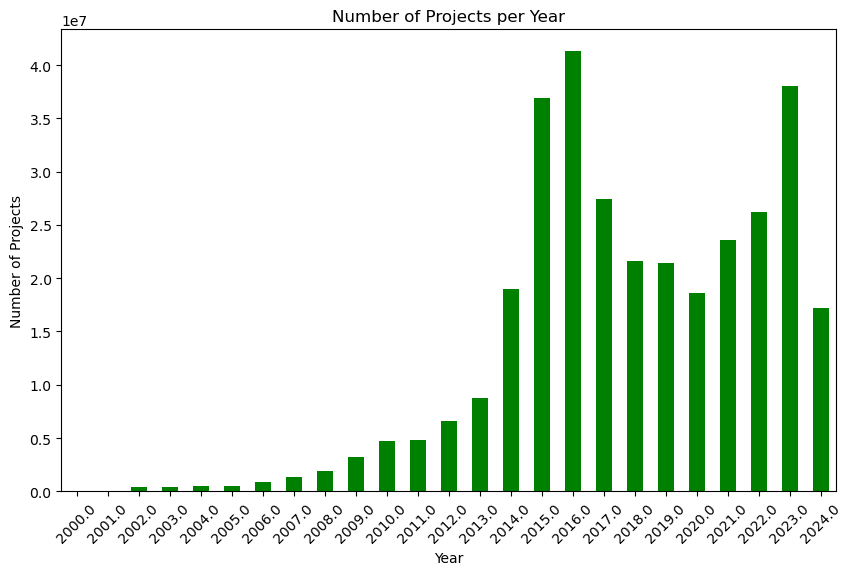

In [243]:
df['Date Completed'] = pd.to_datetime(num_df['Date Completed'])
df['Year'] = df['Date Completed'].dt.year

plt.figure(figsize=(10, 6))
df.groupby('Year')['Year'].sum().plot(kind='bar', color='g')
plt.title('Number of Projects per Year')
plt.xlabel('Year')
plt.ylabel('Number of Projects')
plt.xticks(rotation=45)
plt.show()

## Correlation HeatMap

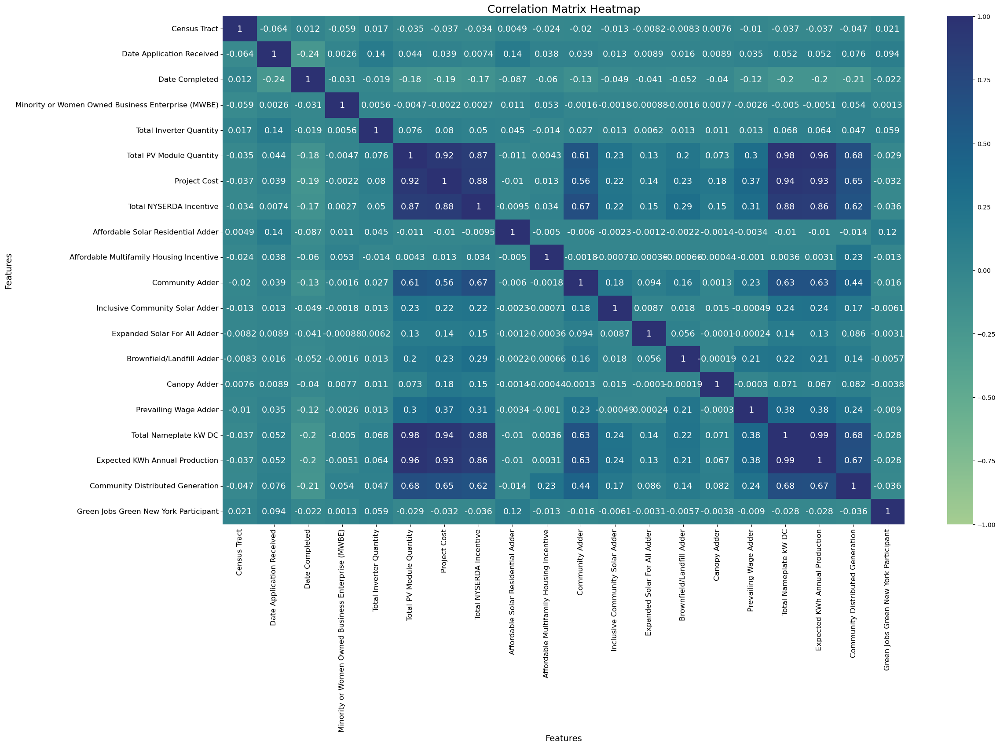

In [244]:
num_corr = num_df.corr()

# Plot the heatmap
plt.figure(figsize=(25, 15))
heatmap = sns.heatmap(num_corr, annot=True, cmap='crest', vmin=-1, vmax=1, annot_kws={"size": 14})
heatmap.set_title('Correlation Matrix Heatmap', fontsize=18)
heatmap.set_xlabel('Features', fontsize=14)
heatmap.set_ylabel('Features', fontsize=14)

# Adjust the tick labels size
heatmap.xaxis.set_tick_params(labelsize=12)
heatmap.yaxis.set_tick_params(labelsize=12)

plt.show()

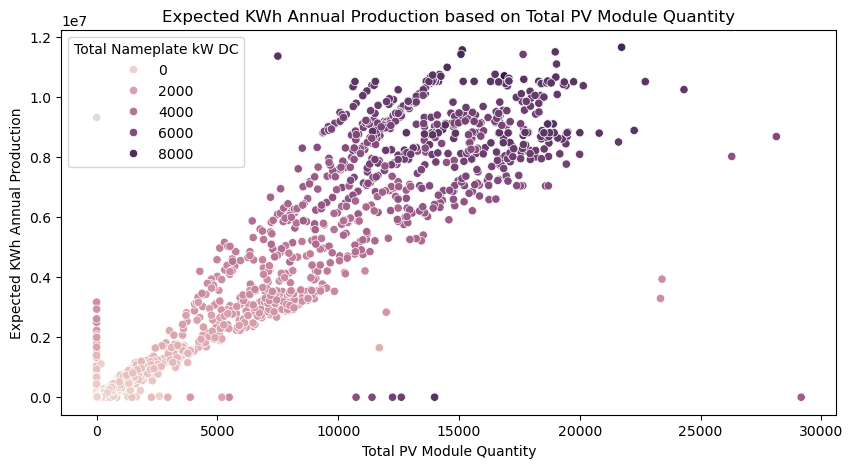

In [245]:
plt.figure(figsize=(10,5))
sns.scatterplot(data=num_df, x='Total PV Module Quantity', y='Expected KWh Annual Production', hue='Total Nameplate kW DC')
plt.title('Expected KWh Annual Production based on Total PV Module Quantity')
plt.show()

In [246]:
num_df.isnull().sum()

Census Tract                                          5249
Date Application Received                                0
Date Completed                                        7375
Minority or Women Owned Business Enterprise (MWBE)       0
Total Inverter Quantity                                116
Total PV Module Quantity                               123
Project Cost                                             0
Total NYSERDA Incentive                                 69
Affordable Solar Residential Adder                       0
Affordable Multifamily Housing Incentive                 0
Community Adder                                          0
Inclusive Community Solar Adder                          0
Expanded Solar For All Adder                             0
Brownfield/Landfill Adder                                0
Canopy Adder                                             0
Prevailing Wage Adder                                    0
Total Nameplate kW DC                                   

# EDA for time series

### Columns required

1) 'Date Completed'
2) 'Project Status'
3) 'Total Nameplate kW DC' 
4) 'Expected KWh Annual Production'


In [247]:
df_ts = df_mod[['Date Completed','Project Status','Total Nameplate kW DC','Expected KWh Annual Production']]

In [248]:
df_ts.head()

,Date Completed,Project Status,Total Nameplate kW DC,Expected KWh Annual Production
0,NaT,Pipeline,2.460000,2735.000000
1,NaT,Pipeline,4.400000,4807.000000
2,NaT,Pipeline,13.200000,13961.000000
3,NaT,Pipeline,0.000000,0.000000
4,2022-10-17,Complete,0.000000,0.000000


In [249]:
df_ts.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 168526 entries, 0 to 168525
Data columns (total 4 columns):
 #   Column                          Non-Null Count   Dtype         
---  ------                          --------------   -----         
 0   Date Completed                  161151 non-null  datetime64[ns]
 1   Project Status                  168526 non-null  object        
 2   Total Nameplate kW DC           168526 non-null  float64       
 3   Expected KWh Annual Production  168461 non-null  float64       
dtypes: datetime64[ns](1), float64(2), object(1)
memory usage: 5.1+ MB


In [250]:
df_ts = df_ts[df_ts['Project Status'] != 'Pipeline']

df_ts.reset_index(drop=True, inplace=True)

df_ts.head()

,Date Completed,Project Status,Total Nameplate kW DC,Expected KWh Annual Production
0,2022-10-17,Complete,0.000000,0.000000
1,2022-05-10,Complete,0.000000,0.000000
2,2023-04-18,Complete,0.000000,0.000000
3,2022-12-07,Complete,0.000000,0.000000
4,2022-03-21,Complete,0.000000,0.000000


In [251]:
df_ts.isnull().sum()

Date Completed                     0
Project Status                     0
Total Nameplate kW DC              0
Expected KWh Annual Production    65
dtype: int64

In [252]:
df_ts.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 161151 entries, 0 to 161150
Data columns (total 4 columns):
 #   Column                          Non-Null Count   Dtype         
---  ------                          --------------   -----         
 0   Date Completed                  161151 non-null  datetime64[ns]
 1   Project Status                  161151 non-null  object        
 2   Total Nameplate kW DC           161151 non-null  float64       
 3   Expected KWh Annual Production  161086 non-null  float64       
dtypes: datetime64[ns](1), float64(2), object(1)
memory usage: 4.9+ MB


In [253]:
missing_values_df = df_ts[df_ts['Expected KWh Annual Production'].isnull()]
missing_values_df.sort_values(by = 'Total Nameplate kW DC').head(50)

,Date Completed,Project Status,Total Nameplate kW DC,Expected KWh Annual Production
158070,2004-10-27,Complete,0.130000,NaN
93298,2004-09-08,Complete,1.480000,NaN
12236,2003-09-15,Complete,1.490000,NaN
157040,2008-06-18,Complete,1.900000,NaN
155166,2005-03-11,Complete,1.980000,NaN
155377,2004-11-09,Complete,2.000000,NaN
155266,2008-06-18,Complete,2.000000,NaN
155261,2005-05-24,Complete,2.000000,NaN
152646,2004-08-11,Complete,2.000000,NaN
154979,2004-12-20,Complete,2.000000,NaN


In [254]:
missing_values_df.sort_values(by = 'Total Nameplate kW DC').tail(15)

,Date Completed,Project Status,Total Nameplate kW DC,Expected KWh Annual Production
18892,2003-12-18,Complete,2.970000,NaN
24408,2003-06-26,Complete,2.970000,NaN
11167,2003-12-16,Complete,2.970000,NaN
156221,2005-12-14,Complete,3.000000,NaN
135793,2003-12-26,Complete,3.340000,NaN
122326,2003-10-03,Complete,3.600000,NaN
18971,2003-12-26,Complete,4.010000,NaN
125643,2004-06-09,Complete,4.320000,NaN
19885,2004-04-23,Complete,4.340000,NaN
142203,2005-09-27,Complete,4.400000,NaN


In [255]:
df_ts_sorted = df_ts.sort_values(by='Date Completed', ascending=True)

# df_ts_sorted['Date Completed'].head(100)


In [256]:
df_ts_sorted.isnull().sum()

Date Completed                     0
Project Status                     0
Total Nameplate kW DC              0
Expected KWh Annual Production    65
dtype: int64

### Imputing the missing values for the  column 'Expected KWh Annual Production '

 <blockquote>Based on the correlation matrix score, there is a very high positive correlation (0.99) between column  'Total Nameplate kW DC' and 'Expected KWh Annual Production ', Lets explore these two columns further to see if we an impute the missing values.</blockquote>   

In [257]:
## Lets creat a new dataset that will have these two columns so the the missing values can be removed
## before we carry out this test

df_ts_petest= df_ts_sorted[['Total Nameplate kW DC','Expected KWh Annual Production']]

In [258]:
## Lets clean the data for perfroming the corellation test

df_ts_petest.dropna(inplace= True)


In [259]:
df_ts_petest.isnull().sum()

Total Nameplate kW DC             0
Expected KWh Annual Production    0
dtype: int64

<div class='alert alert-block alert-info'>
    <u><b>Hypothesis testing</b></u>
    
To check if there is  a significant correlation between the columns <i> 'Total Nameplate kW DC'</i> and 
<i>'Expected KWh Annual Production'</i>. For testing if there is a significant relationship between these two columns
lets perform a Perason's r or Spearman correlation test.

<b>Hypothesis:</b> 

<p><b>H0 =</b>There is no significant correlation between'Total Nameplate kW DC' and 'Expected KWh Annual Production'(Null hypothesis)

<b>H1 =</b>There is a significant correlation between'Total Nameplate kW DC' and 'Expected KWh Annual Production'(alternate hypothesis)</p>


alpha = 0.05 (level of significance)

In [260]:
def choose_correlation_test(series1, series2, alpha=0.05):
    
    # Check normality using Shapiro-Wilk test
    _, p_value1 = shapiro(series1)
    _, p_value2 = shapiro(series2)

    # Decide based on p-values and significance level
    if p_value1 > alpha and p_value2 > alpha:
        return 'Pearson'  # Both series are likely normally distributed
    else:
        return 'Spearman'  # At least one series is not likely normally distributed

# Choose the appropriate correlation test
recommended_test = choose_correlation_test(df_ts_petest['Total Nameplate kW DC'],df_ts_petest['Expected KWh Annual Production'])
print(f'Recommended correlation test: {recommended_test}')

# Calculate the correlation
if recommended_test == 'Pearson':
    correlation, _ = pearsonr(df_ts_petest['Total Nameplate kW DC'], df_ts_petest['Expected KWh Annual Production'])
else:
    correlation, _ = spearmanr(df_ts_petest['Total Nameplate kW DC'], df_ts_petest['Expected KWh Annual Production'])
print(f'{recommended_test} correlation: {correlation:.3f}') 


Recommended correlation test: Spearman
Spearman correlation: 0.953


<div class='alert alert-block alert-info'><b><blockquote>Based on the above Spearman correlation test, it can be observed that since the pvalue is smaller than alpha, reject the null hypothesis, there <b>is</b> a signinficant correlation betweeen the 'Total Nameplate kW DC' and  'Expected KWh Annual Production' column. Also the correlation coefficient of 0.953 indicates a very high positive correlation. We  can use the 'Total Nameplate kW DC' to impute the missing values of 'Expected KWh Annual Production' column.</b></blockquote>  

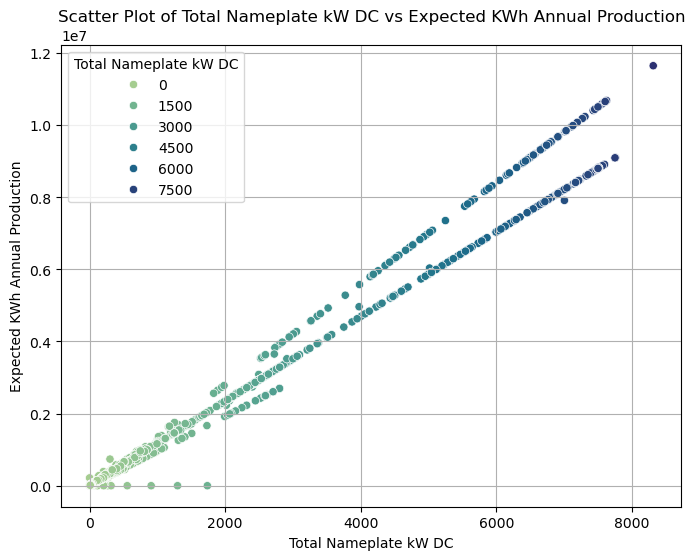

In [261]:
plt.figure(figsize=(8, 6))
sns.scatterplot(x='Total Nameplate kW DC', y='Expected KWh Annual Production', data=df_ts, hue='Total Nameplate kW DC', palette='crest')
plt.title('Scatter Plot of Total Nameplate kW DC vs Expected KWh Annual Production')
plt.xlabel('Total Nameplate kW DC')
plt.ylabel('Expected KWh Annual Production')
plt.grid(True)
plt.legend(title='Total Nameplate kW DC', loc='upper left')
plt.show()

<div class='alert alert-block alert-info'><blockquote>The scatter plot shows a positive linear relationship between 'Total Nameplate kW DC' and 'Expected KWh Annual Production'. As 'Total Nameplate kW DC' increases, 'Expected KWh Annual Production' also increase. This suggests that there is strong corellation between the'Total Nameplate kW DC' with 'Expected KWh Annual Production'.</blockquote>

In [262]:
nameplate_avg = df_ts['Total Nameplate kW DC'].mean()
expected_avg = df_ts['Expected KWh Annual Production'].mean()

print(round(nameplate_avg,4))
print(round(expected_avg,4))

27.7283
32603.3633


## For imputation

In [263]:
# Lets calculate the Expected KWh Annual Production per Nameplate kW DC 

nameplate_per_kW_DC = expected_avg/nameplate_avg
print('The Expected KWh Annual Production per nameplate capacity of 1 kW DC:', (round(nameplate_per_kW_DC ,4)))

The Expected KWh Annual Production per nameplate capacity of 1 kW DC: 1175.8173


In [264]:
df_ts_sorted.isnull().sum()

Date Completed                     0
Project Status                     0
Total Nameplate kW DC              0
Expected KWh Annual Production    65
dtype: int64

<div class='alert alert-block alert-info'><blockquote>There are 65 missing values in the dataframe for Expected KWh Annual Production column. Imputation of the missing values will be done using the calculated  estimated annual production per nameplate capacity of 1kW DC. Wehere ever there is a missing value in Expected KWh Annual Production column, the expected annual production will be calculated by multiplying 1171.2151 by the respective </blockquote> </div>

In [265]:
df_ts['Expected KWh Annual Production'] = df_ts.apply(
    lambda row: row['Total Nameplate kW DC'] * nameplate_per_kW_DC 
    if math.isnan(row['Expected KWh Annual Production']) 
    else row['Expected KWh Annual Production'], 
    axis=1)

df_ts.head(50)

,Date Completed,Project Status,Total Nameplate kW DC,Expected KWh Annual Production
0,2022-10-17,Complete,0.000000,0.000000
1,2022-05-10,Complete,0.000000,0.000000
2,2023-04-18,Complete,0.000000,0.000000
3,2022-12-07,Complete,0.000000,0.000000
4,2022-03-21,Complete,0.000000,0.000000
5,2015-03-12,Complete,7.150000,8393.000000
6,2014-10-15,Complete,7.400000,8681.000000
7,2013-10-16,Complete,14.000000,16434.000000
8,2015-01-13,Complete,9.000000,10565.000000
9,2021-09-23,Complete,0.000000,0.000000


In [266]:
df_ts.isnull().sum()

Date Completed                    0
Project Status                    0
Total Nameplate kW DC             0
Expected KWh Annual Production    0
dtype: int64

# Summary statistics for 'Expected KWh Annual Production' (after imputation)


In [267]:
summary_stats = df['Expected KWh Annual Production'].describe()
summary_stats.to_frame()

,Expected KWh Annual Production
count,168461.000000
mean,57847.717846
std,581135.184478
min,0.000000
25%,5500.000000
50%,7778.000000
75%,11003.000000
max,11648642.000000


# Box Plot for 'Expected KWh Annual Production'

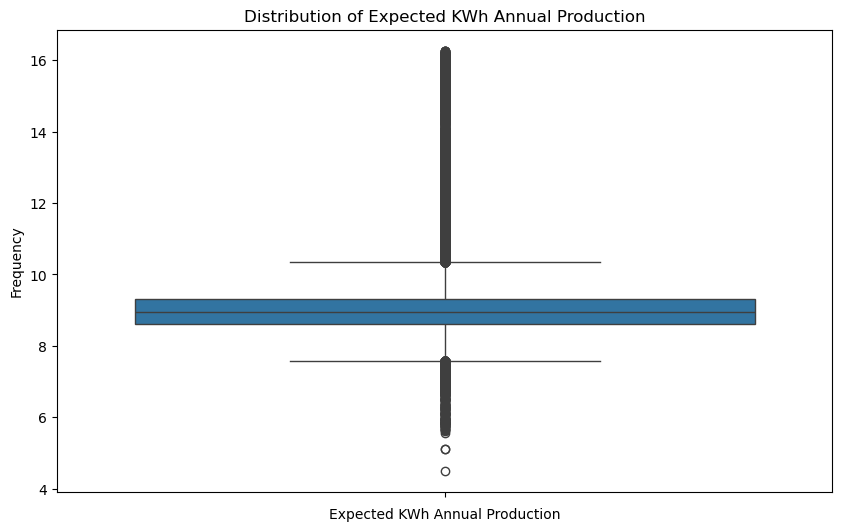

In [268]:
# Histogram for 'Expected KWh Annual Production'
plt.figure(figsize=(10, 6))
sns.boxplot(np.log(df['Expected KWh Annual Production']))
plt.title('Distribution of Expected KWh Annual Production')
plt.xlabel('Expected KWh Annual Production')
plt.ylabel('Frequency')
plt.show()


<blockquote><b>Dropping the  data for dates which does not have uniform interval</b></blockquote>

**Removing Data from years 2000 and 2001**

In [269]:
df_ts = df_ts[~df_ts['Date Completed'].dt.year.isin([2000, 2001])]

In [270]:
final_columns_ts = df_ts[['Date Completed','Expected KWh Annual Production']]
final_columns_ts.head()

,Date Completed,Expected KWh Annual Production
0,2022-10-17,0.000000
1,2022-05-10,0.000000
2,2023-04-18,0.000000
3,2022-12-07,0.000000
4,2022-03-21,0.000000


**Sorting chronologically**

In [271]:
final_columns_ts.shape

(161136, 2)

In [272]:
final_columns_ts.info()

<class 'pandas.core.frame.DataFrame'>
Index: 161136 entries, 0 to 161150
Data columns (total 2 columns):
 #   Column                          Non-Null Count   Dtype         
---  ------                          --------------   -----         
 0   Date Completed                  161136 non-null  datetime64[ns]
 1   Expected KWh Annual Production  161136 non-null  float64       
dtypes: datetime64[ns](1), float64(1)
memory usage: 3.7 MB


In [273]:
final_columns_ts[final_columns_ts['Expected KWh Annual Production'].isnull()]

,Date Completed,Expected KWh Annual Production


# Visual for 'Expected KWh Annual Production' over time (based on completion date)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

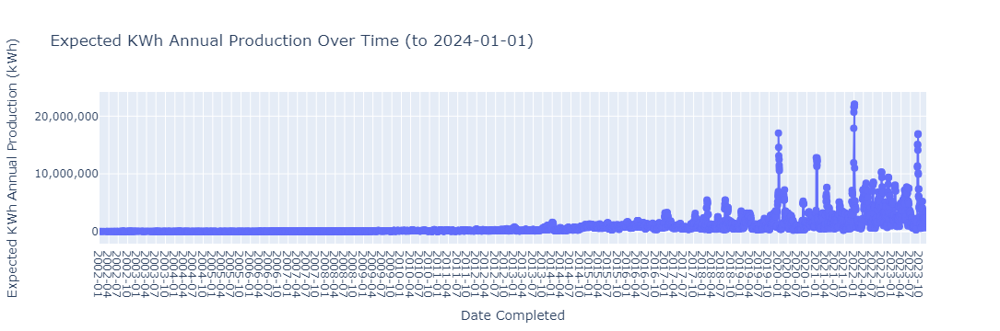

In [274]:
df_grouped = df.groupby('Date Completed')['Expected KWh Annual Production'].sum().rolling(window=7, min_periods=1).mean()

# Filter data for the desired range (starting from the first date in your dataset to 2024-01-01)
start_date = pd.to_datetime('2002-01-01')  # Get the first date in your data
end_date = pd.to_datetime('2023-12-01')

filtered_df = df_grouped[start_date:end_date]

fig = go.Figure()

fig.add_trace(go.Scatter(x=filtered_df.index, y=filtered_df.values, mode='lines+markers', name='Expected KWh Annual Production'))

fig.update_layout(
    title='Expected KWh Annual Production Over Time (to 2024-01-01)',  # Update title
    xaxis_title='Date Completed',
    yaxis_title='Expected KWh Annual Production (kWh)',
    xaxis=dict(
        tickformat='%Y-%m',
        dtick='M3',  # Tick every 3 months
        range=[start_date, end_date]  # Set x-axis range explicitly
    ),
    yaxis=dict(
        tickformat=',.0f'  # Format y-axis values with commas and no decimal places
    )
)

fig.update_traces(marker=dict(size=8))  # Adjust marker size as needed

fig.show()

In [275]:
final_columns_ts['Year'] = final_columns_ts['Date Completed'].dt.year
final_columns_ts['Month'] = final_columns_ts['Date Completed'].dt.month

# calculate the monthly sum
df_final = final_columns_ts.groupby(['Year', 'Month'])['Expected KWh Annual Production'].sum().reset_index()

# Rename the summed column 
df_final.rename(columns={'Expected KWh Annual Production': 'mon_cum_Exp_KWh_Annual_Prod'}, inplace=True)

# New column 'Month-Year' in the desired format
df_final['Month-Year'] = df_final['Month'].apply(lambda x: f"{x:02d}") + '-' + df_final['Year'].astype(str)

# cumulative sum for each year
df_final['Yearly_Cumulative_Exp_KWh_Annual_Prod'] = df_final.groupby('Year')['mon_cum_Exp_KWh_Annual_Prod'].cumsum()

# cumulative sum for the entire dataset
df_final['Total_Cumulative_Exp_KWh_Annual_Prod'] = df_final['mon_cum_Exp_KWh_Annual_Prod'].cumsum()

# Remove the decimal points 
df_final['mon_cum_Exp_KWh_Annual_Prod'] = df_final['mon_cum_Exp_KWh_Annual_Prod'].astype(float)
df_final['Yearly_Cumulative_Exp_KWh_Annual_Prod'] = df_final['Yearly_Cumulative_Exp_KWh_Annual_Prod'].astype(float)
df_final['Total_Cumulative_Exp_KWh_Annual_Prod'] = df_final['Total_Cumulative_Exp_KWh_Annual_Prod'].astype(float)

# Step 7: Rearrange columns 
df_final = df_final[['Month-Year','mon_cum_Exp_KWh_Annual_Prod','Yearly_Cumulative_Exp_KWh_Annual_Prod',
                     'Total_Cumulative_Exp_KWh_Annual_Prod']]

df_final.head(50)


,Month-Year,mon_cum_Exp_KWh_Annual_Prod,Yearly_Cumulative_Exp_KWh_Annual_Prod,Total_Cumulative_Exp_KWh_Annual_Prod
0,01-2002,16305.000000,16305.000000,16305.000000
1,02-2002,3756.000000,20061.000000,20061.000000
2,03-2002,13616.000000,33677.000000,33677.000000
3,04-2002,17935.000000,51612.000000,51612.000000
4,05-2002,51660.000000,103272.000000,103272.000000
5,06-2002,49572.000000,152844.000000,152844.000000
6,07-2002,99915.000000,252759.000000,252759.000000
7,08-2002,151845.000000,404604.000000,404604.000000
8,09-2002,106688.000000,511292.000000,511292.000000
9,10-2002,245145.000000,756437.000000,756437.000000


In [276]:
df_final.tail(60)

,Month-Year,mon_cum_Exp_KWh_Annual_Prod,Yearly_Cumulative_Exp_KWh_Annual_Prod,Total_Cumulative_Exp_KWh_Annual_Prod
210,07-2019,18155244.000000,189449442.000000,1606831491.867836
211,08-2019,27708172.000000,217157614.000000,1634539663.867836
212,09-2019,23022818.000000,240180432.000000,1657562481.867836
213,10-2019,31534670.000000,271715102.000000,1689097151.867836
214,11-2019,53216465.000000,324931567.000000,1742313616.867836
215,12-2019,131981977.000000,456913544.000000,1874295593.867836
216,01-2020,10644115.000000,10644115.000000,1884939708.867836
217,02-2020,64557924.000000,75202039.000000,1949497632.867836
218,03-2020,52726566.000000,127928605.000000,2002224198.867836
219,04-2020,38614578.000000,166543183.000000,2040838776.867836


In [277]:
df_final.isnull().sum()

Month-Year                               0
mon_cum_Exp_KWh_Annual_Prod              0
Yearly_Cumulative_Exp_KWh_Annual_Prod    0
Total_Cumulative_Exp_KWh_Annual_Prod     0
dtype: int64

### Save to Excel (Monthly Data after EDA)

In [278]:
df_final.to_excel('Monthly-Data-after-EDA.xlsx')

<hr style="border: 2px solid black;">

<hr style="border: 2px solid black;">

<hr style="border: 2px solid black;">

# Time Series

## Data Analysis For TimeSeries

**Using the DataFrame created for TimeSeries**

In [279]:
df_solar=df_final.copy()

In [280]:
df_solar.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 270 entries, 0 to 269
Data columns (total 4 columns):
 #   Column                                 Non-Null Count  Dtype  
---  ------                                 --------------  -----  
 0   Month-Year                             270 non-null    object 
 1   mon_cum_Exp_KWh_Annual_Prod            270 non-null    float64
 2   Yearly_Cumulative_Exp_KWh_Annual_Prod  270 non-null    float64
 3   Total_Cumulative_Exp_KWh_Annual_Prod   270 non-null    float64
dtypes: float64(3), object(1)
memory usage: 8.6+ KB


In [281]:
df_solar.head()

,Month-Year,mon_cum_Exp_KWh_Annual_Prod,Yearly_Cumulative_Exp_KWh_Annual_Prod,Total_Cumulative_Exp_KWh_Annual_Prod
0,01-2002,16305.000000,16305.000000,16305.000000
1,02-2002,3756.000000,20061.000000,20061.000000
2,03-2002,13616.000000,33677.000000,33677.000000
3,04-2002,17935.000000,51612.000000,51612.000000
4,05-2002,51660.000000,103272.000000,103272.000000


In [282]:
df_solar['Month-Year']=pd.to_datetime(df_solar['Month-Year'],format='%m-%Y')
df_solar.head(13)

,Month-Year,mon_cum_Exp_KWh_Annual_Prod,Yearly_Cumulative_Exp_KWh_Annual_Prod,Total_Cumulative_Exp_KWh_Annual_Prod
0,2002-01-01,16305.000000,16305.000000,16305.000000
1,2002-02-01,3756.000000,20061.000000,20061.000000
2,2002-03-01,13616.000000,33677.000000,33677.000000
3,2002-04-01,17935.000000,51612.000000,51612.000000
4,2002-05-01,51660.000000,103272.000000,103272.000000
5,2002-06-01,49572.000000,152844.000000,152844.000000
6,2002-07-01,99915.000000,252759.000000,252759.000000
7,2002-08-01,151845.000000,404604.000000,404604.000000
8,2002-09-01,106688.000000,511292.000000,511292.000000
9,2002-10-01,245145.000000,756437.000000,756437.000000


## After Cleaning all Dataframes

In [283]:
df_s=df_solar.copy()
df_s.head()

,Month-Year,mon_cum_Exp_KWh_Annual_Prod,Yearly_Cumulative_Exp_KWh_Annual_Prod,Total_Cumulative_Exp_KWh_Annual_Prod
0,2002-01-01,16305.000000,16305.000000,16305.000000
1,2002-02-01,3756.000000,20061.000000,20061.000000
2,2002-03-01,13616.000000,33677.000000,33677.000000
3,2002-04-01,17935.000000,51612.000000,51612.000000
4,2002-05-01,51660.000000,103272.000000,103272.000000


In [284]:
df_m=df_s.copy()
df_m.head()

,Month-Year,mon_cum_Exp_KWh_Annual_Prod,Yearly_Cumulative_Exp_KWh_Annual_Prod,Total_Cumulative_Exp_KWh_Annual_Prod
0,2002-01-01,16305.000000,16305.000000,16305.000000
1,2002-02-01,3756.000000,20061.000000,20061.000000
2,2002-03-01,13616.000000,33677.000000,33677.000000
3,2002-04-01,17935.000000,51612.000000,51612.000000
4,2002-05-01,51660.000000,103272.000000,103272.000000


In [285]:
df_m.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 270 entries, 0 to 269
Data columns (total 4 columns):
 #   Column                                 Non-Null Count  Dtype         
---  ------                                 --------------  -----         
 0   Month-Year                             270 non-null    datetime64[ns]
 1   mon_cum_Exp_KWh_Annual_Prod            270 non-null    float64       
 2   Yearly_Cumulative_Exp_KWh_Annual_Prod  270 non-null    float64       
 3   Total_Cumulative_Exp_KWh_Annual_Prod   270 non-null    float64       
dtypes: datetime64[ns](1), float64(3)
memory usage: 8.6 KB


In [286]:
df_m.shape

(270, 4)

## Setting datetime as index and sorting it

In [287]:
# df_MWh.set_index('Month-Year',inplace=True)
df_m.set_index('Month-Year',inplace=True)

In [288]:
df_m.sort_index(inplace=True)

## Setting the data frequency as Monthly

In [289]:
df_m.resample('M').sum()
df_m.head()

,mon_cum_Exp_KWh_Annual_Prod,Yearly_Cumulative_Exp_KWh_Annual_Prod,Total_Cumulative_Exp_KWh_Annual_Prod
Month-Year,,,
2002-01-01,16305.000000,16305.000000,16305.000000
2002-02-01,3756.000000,20061.000000,20061.000000
2002-03-01,13616.000000,33677.000000,33677.000000
2002-04-01,17935.000000,51612.000000,51612.000000
2002-05-01,51660.000000,103272.000000,103272.000000


## Checking for missing months

In [290]:
print('\nUnique months in our data: ', len(df_m.index.unique()), 'Months')

start_date = df_m.index.min().to_period('M')
end_date = df_m.index.max().to_period('M')
expected_months = (end_date - start_date).n + 1  # n is the number of periods
# Calculate number of days in date range
print('Total months in our date range:', expected_months, 'Months')



Unique months in our data:  270 Months
Total months in our date range: 270 Months


In [291]:
df_m.index

DatetimeIndex(['2002-01-01', '2002-02-01', '2002-03-01', '2002-04-01',
               '2002-05-01', '2002-06-01', '2002-07-01', '2002-08-01',
               '2002-09-01', '2002-10-01',
               ...
               '2023-09-01', '2023-10-01', '2023-11-01', '2023-12-01',
               '2024-01-01', '2024-02-01', '2024-03-01', '2024-04-01',
               '2024-05-01', '2024-06-01'],
              dtype='datetime64[ns]', name='Month-Year', length=270, freq=None)

In [292]:
df_m=df_m.copy()


## Converting to MegaWatts from KiloWatts

In [293]:
df_m_new=df_m/1000

In [294]:
df_m_new.head()

,mon_cum_Exp_KWh_Annual_Prod,Yearly_Cumulative_Exp_KWh_Annual_Prod,Total_Cumulative_Exp_KWh_Annual_Prod
Month-Year,,,
2002-01-01,16.305000,16.305000,16.305000
2002-02-01,3.756000,20.061000,20.061000
2002-03-01,13.616000,33.677000,33.677000
2002-04-01,17.935000,51.612000,51.612000
2002-05-01,51.660000,103.272000,103.272000


In [295]:
df_m_new.shape

(270, 3)

In [296]:
df_m_new.rename(columns={'mon_cum_Exp_KWh_Annual_Prod':'Monthly Cumulative MWh annual production','Yearly_Cumulative_Exp_KWh_Annual_Prod':'Yearly Cumulative MWh annual production','Total_Cumulative_Exp_KWh_Annual_Prod':'Total Cumulative MWh annual production'},inplace=True)

In [297]:
k=df_m_new
k.head()

,Monthly Cumulative MWh annual production,Yearly Cumulative MWh annual production,Total Cumulative MWh annual production
Month-Year,,,
2002-01-01,16.305000,16.305000,16.305000
2002-02-01,3.756000,20.061000,20.061000
2002-03-01,13.616000,33.677000,33.677000
2002-04-01,17.935000,51.612000,51.612000
2002-05-01,51.660000,103.272000,103.272000


## Plotting 

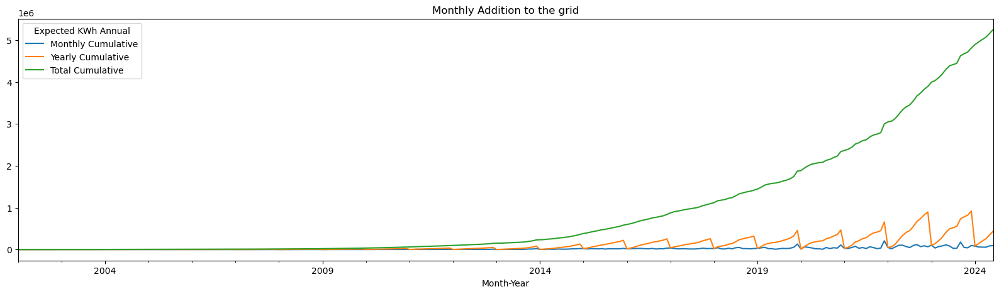

In [298]:
plotsize=(20,5)
df_m_new.plot(figsize=plotsize, title='Monthly Addition to the grid')
plt.legend(labels=['Monthly Cumulative',"Yearly Cumulative",'Total Cumulative'],title="Expected KWh Annual")
plt.show()

# Custom Recursive function for differencing 

In [299]:
# My modification recursive function to find the difference to stationary
global global_variable
def adf_test(series):
    result=adfuller(series)
    print('ADF Statistics: {}'.format(result[0]))
    print('p- value: {}'.format(result[1]))
    if result[1] <= 0.05:
        print("rejecting the null hypothesis. Data has no unit root and is stationary")
        global global_variable
        global_variable=series
        return 0
    else:
        print("Fail to reject null hypothesis, time series has a unit root, indicating it is non-stationary\n ")
        # Differencing automatically done using recursive function, returns the difference where the null hypothesis is rejected
        series=series-series.shift(1)
        return 1+adf_test(series.dropna())

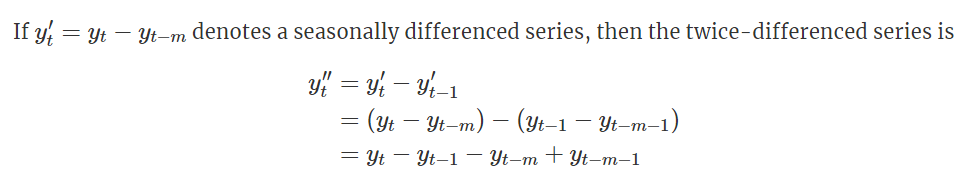

In [300]:
def adf_test_season(series,season):
    series-=series.shift(season)
    series.dropna(inplace=True)
    return adf_test(series)+1,global_variable   
    

<hr style="border: 2px solid black;">

<hr style="border: 2px solid black;">

<hr style="border: 2px solid black;">

# Preview (Used Log Transformation 2002-2022)

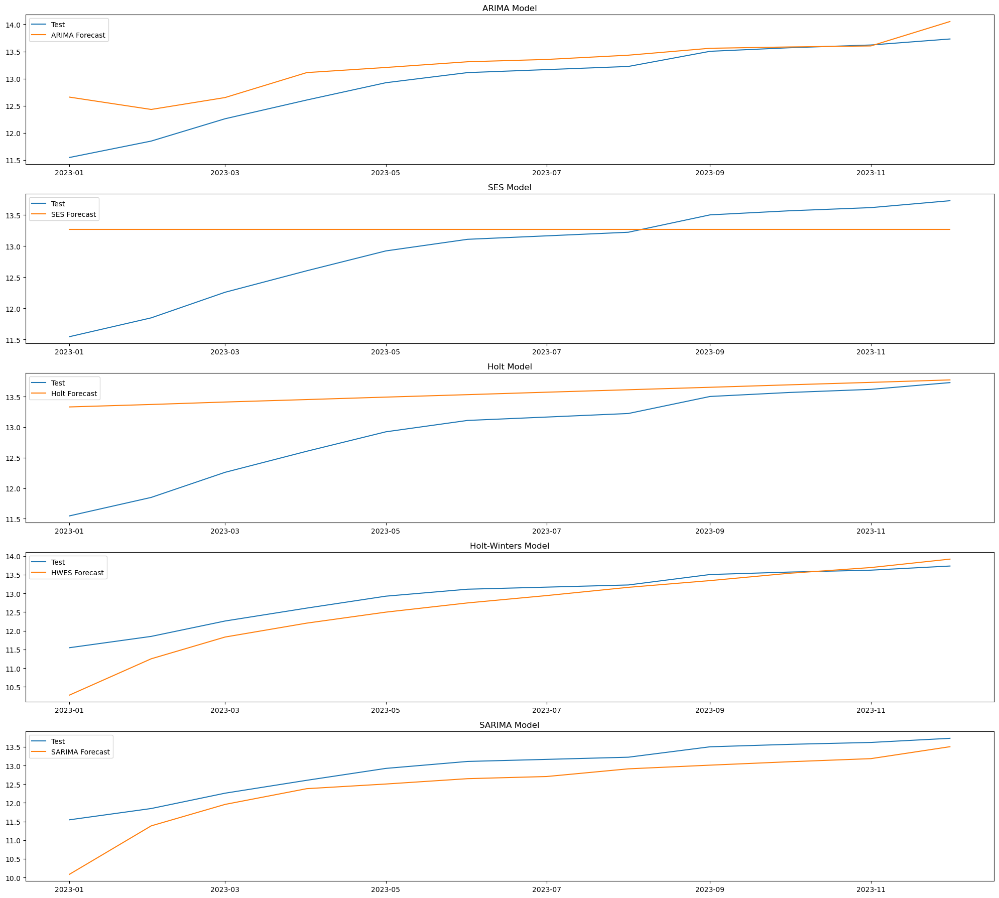

ARIMA Train RMSE: 0.5747674373321633 Train MAPE: 0.0480625761277064 Test RMSE: 0.43680852064637643 Test MAPE: 0.026197381183184213
SES Train RMSE: 0.755246668901158 Train MAPE: 0.057430429783889785 Test RMSE: 0.7698512967202267 Test MAPE: 0.046176113362778985
Holt Train RMSE: 0.7613737802180263 Train MAPE: 0.04757970418712481 Test RMSE: 0.838025238414882 Test MAPE: 0.051087397119839895
HWES Train RMSE: 0.22534628700815074 Train MAPE: 0.01653037075934795 Test RMSE: 0.4784548850742246 Test MAPE: 0.02859159851362393
SARIMA Train RMSE: 1.2024294577924546 Train MAPE: 0.06626615837413166 Test RMSE: 0.5689632698994614 Test MAPE: 0.03776744720126949


In [301]:
# Split into train and test sets
# train_size = int(len(df_m_new) * 0.95)
train, test = np.log(df_m_new[df_m_new.index.year<2023][:-12]), np.log(df_m_new[df_m_new.index.year==2023][-12:])

# Function to calculate RMSE and MAPE
def evaluate_forecast(y_true, y_pred):
    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    mape = mean_absolute_percentage_error(y_true, y_pred)
    return rmse, mape

# ARIMA Model
arima_model = ARIMA(train['Yearly Cumulative MWh annual production'], order=([1,2,3,4,11],2,[1,12]))
arima_model_fit = arima_model.fit()
arima_train_forecast = arima_model_fit.predict(start=0, end=len(train)-1)
arima_test_forecast = arima_model_fit.forecast(steps=len(test))
arima_train_rmse, arima_train_mape = evaluate_forecast(train['Yearly Cumulative MWh annual production'], arima_train_forecast)
arima_test_rmse, arima_test_mape = evaluate_forecast(test['Yearly Cumulative MWh annual production'], arima_test_forecast)

# SES Model
ses_model = SimpleExpSmoothing(train['Yearly Cumulative MWh annual production']).fit()
ses_train_forecast = ses_model.fittedvalues
ses_test_forecast = ses_model.forecast(steps=len(test))
ses_train_rmse, ses_train_mape = evaluate_forecast(train['Yearly Cumulative MWh annual production'], ses_train_forecast)
ses_test_rmse, ses_test_mape = evaluate_forecast(test['Yearly Cumulative MWh annual production'], ses_test_forecast)

# Holt's Linear Trend Model
holt_model = Holt(train['Yearly Cumulative MWh annual production']).fit()
holt_train_forecast = holt_model.fittedvalues
holt_test_forecast = holt_model.forecast(steps=len(test))
holt_train_rmse, holt_train_mape = evaluate_forecast(train['Yearly Cumulative MWh annual production'], holt_train_forecast)
holt_test_rmse, holt_test_mape = evaluate_forecast(test['Yearly Cumulative MWh annual production'], holt_test_forecast)

# Holt-Winters Model
hwes_model = ExponentialSmoothing(train['Yearly Cumulative MWh annual production'], trend='add', seasonal='mul', seasonal_periods=12).fit()
hwes_train_forecast = hwes_model.fittedvalues
hwes_test_forecast = hwes_model.forecast(steps=len(test))
hwes_train_rmse, hwes_train_mape = evaluate_forecast(train['Yearly Cumulative MWh annual production'], hwes_train_forecast)
hwes_test_rmse, hwes_test_mape = evaluate_forecast(test['Yearly Cumulative MWh annual production'], hwes_test_forecast)

# SARIMA Model
sarima_model = SARIMAX(train['Yearly Cumulative MWh annual production'],order=([1],0,[1]),seasonal_order=([1],1,0,12))
sarima_model_fit = sarima_model.fit()
sarima_train_forecast = sarima_model_fit.predict(start=0, end=len(train)-1)
sarima_test_forecast = sarima_model_fit.forecast(steps=len(test))
sarima_train_rmse, sarima_train_mape = evaluate_forecast(train['Yearly Cumulative MWh annual production'], sarima_train_forecast)
sarima_test_rmse, sarima_test_mape = evaluate_forecast(test['Yearly Cumulative MWh annual production'], sarima_test_forecast)

# Plot predictions
fig, axs = plt.subplots(5, 1, figsize=(20, 18))

# ARIMA
#axs[0].plot(train.index, train['Yearly Cumulative MWh annual production'], label='Train')
axs[0].plot(test.index, test['Yearly Cumulative MWh annual production'], label='Test')
axs[0].plot(test.index, arima_test_forecast, label='ARIMA Forecast')
axs[0].set_title('ARIMA Model')
axs[0].legend()

# SES
#axs[1].plot(train.index, train['Yearly Cumulative MWh annual production'], label='Train')
axs[1].plot(test.index, test['Yearly Cumulative MWh annual production'], label='Test')
axs[1].plot(test.index, ses_test_forecast, label='SES Forecast')
axs[1].set_title('SES Model')
axs[1].legend()

# Holt
#axs[2].plot(train.index, train['Yearly Cumulative MWh annual production'], label='Train')
axs[2].plot(test.index, test['Yearly Cumulative MWh annual production'], label='Test')
axs[2].plot(test.index, holt_test_forecast, label='Holt Forecast')
axs[2].set_title('Holt Model')
axs[2].legend()

# HWES
#axs[3].plot(train.index, train['Yearly Cumulative MWh annual production'], label='Train')
axs[3].plot(test.index, test['Yearly Cumulative MWh annual production'], label='Test')
axs[3].plot(test.index, hwes_test_forecast, label='HWES Forecast')
axs[3].set_title('Holt-Winters Model')
axs[3].legend()

# SARIMA
#axs[4].plot(train.index, train['Yearly Cumulative MWh annual production'], label='Train')
axs[4].plot(test.index, test['Yearly Cumulative MWh annual production'], label='Test')
axs[4].plot(test.index, sarima_test_forecast, label='SARIMA Forecast')
axs[4].set_title('SARIMA Model')
axs[4].legend()

plt.tight_layout()
plt.show()

# Print model performance
print('ARIMA Train RMSE:', arima_train_rmse, 'Train MAPE:', arima_train_mape, 'Test RMSE:', arima_test_rmse, 'Test MAPE:', arima_test_mape)
print('SES Train RMSE:', ses_train_rmse, 'Train MAPE:', ses_train_mape, 'Test RMSE:', ses_test_rmse, 'Test MAPE:', ses_test_mape)
print('Holt Train RMSE:', holt_train_rmse, 'Train MAPE:', holt_train_mape, 'Test RMSE:', holt_test_rmse, 'Test MAPE:', holt_test_mape)
print('HWES Train RMSE:', hwes_train_rmse, 'Train MAPE:', hwes_train_mape, 'Test RMSE:', hwes_test_rmse, 'Test MAPE:', hwes_test_mape)
print('SARIMA Train RMSE:', sarima_train_rmse, 'Train MAPE:', sarima_train_mape, 'Test RMSE:', sarima_test_rmse, 'Test MAPE:', sarima_test_mape)

<hr style="border: 2px solid black;">

<hr style="border: 2px solid black;">

<hr style="border: 2px solid black;">

# Using Yearly Cumulative data

### Reasons

**Trend Analysis:**

- Long-term Trends: Cumulative data can help identify long-term trends in energy consumption, production, or efficiency improvements over multiple years.
- Smoothing Seasonal Variations: Yearly cumulative data can smooth out seasonal variations, making it easier to see underlying trends.

**Consistency**

- Granularity: Yearly data is more readily available and consistent across years compared to weekly, monthly or quarterly data, especially since the data collection and reporting standards have evolved over time.
- Data Gaps: Annual data might be more complete, with fewer gaps, making it more reliable for modeling

**Simplification of Model Complexity:**

- Reduced Complexity: Working with yearly data reduces the complexity of the model, which can be beneficial when dealing with large datasets or when computational resources are limited.
- Easier Interpretation: Yearly cumulative models can be simpler to interpret and communicate to stakeholders.

**Impact of Policies and Programs:**

- Policy Changes: The impact of energy policies or programs may be more apparent in annual cumulative data, as these often take time to implement and show results.
- Program Evaluation: Cumulative data can be useful in evaluating the long-term effectiveness of energy efficiency programs or renewable energy initiatives.

**Economic and Environmental Factors:**

- Economic Indicators: Annual data can correlate with economic indicators, making it easier to analyze the relationship between energy use and economic growth or recession.
- Environmental Impact: Long-term environmental impacts, such as greenhouse gas emissions reductions, are often measured on an annual basis.

**Forecasting and Planning:**

- Long-term Forecasts: Cumulative data is useful for long-term energy demand or supply forecasting, which is critical for infrastructure planning and investment decisions.
- Strategic Planning: Helps in strategic planning by providing a clear picture of energy trends over the years.

**Regulatory and Reporting Requirements:**

- Compliance Reporting: Many regulatory bodies require annual reporting of energy data, making yearly cumulative data essential for compliance purposes.
- Benchmarking: Yearly data can be used for benchmarking performance against targets or industry standards.

# Yearly Cumulative 2002-2022

## Yearly Cumulative MWh annual production

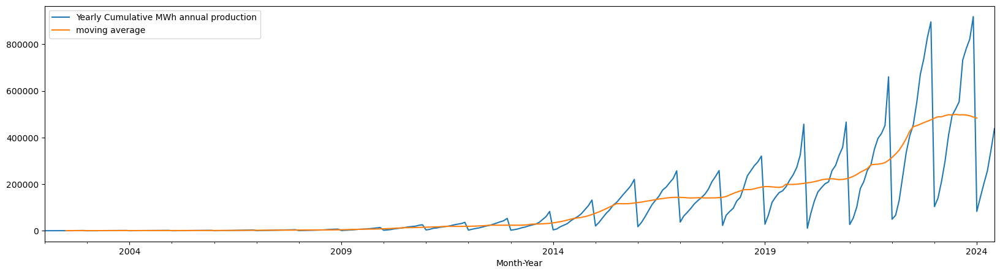

In [302]:
# Using Center parameter for the moving window
j=df_m_new.copy()
j['moving average']=df_m_new['Yearly Cumulative MWh annual production'].rolling(12,center=True).mean()
j[['Yearly Cumulative MWh annual production','moving average']].plot(figsize=plotsize)
plt.show()


### Differencing recursively to a Stationary series

In [303]:
df_m_new.tail()

,Monthly Cumulative MWh annual production,Yearly Cumulative MWh annual production,Total Cumulative MWh annual production
Month-Year,,,
2024-02-01,60388.788000,143321.488000,4957371.056868
2024-03-01,58547.970000,201869.458000,5015919.026868
2024-04-01,55116.270000,256985.728000,5071035.296868
2024-05-01,87534.996000,344520.724000,5158570.292868
2024-06-01,93554.244000,438074.968000,5252124.536868


In [304]:

k=df_m_new.copy()
Difference=adf_test((df_m_new[(df_m_new['Yearly Cumulative MWh annual production'].index.year<2023)]['Yearly Cumulative MWh annual production']))
print(f"\n{Difference= }")

ADF Statistics: 2.9136634290595054
p- value: 1.0
Fail to reject null hypothesis, time series has a unit root, indicating it is non-stationary
 
ADF Statistics: -1.171331756008946
p- value: 0.6858049236270359
Fail to reject null hypothesis, time series has a unit root, indicating it is non-stationary
 
ADF Statistics: -12.203257846690656
p- value: 1.2096311061662463e-22
rejecting the null hypothesis. Data has no unit root and is stationary

Difference= 2


**The differencing value is 1 because the data is stationary after shifting once**

## Decompostion

### Additive

<Figure size 2000x2000 with 0 Axes>

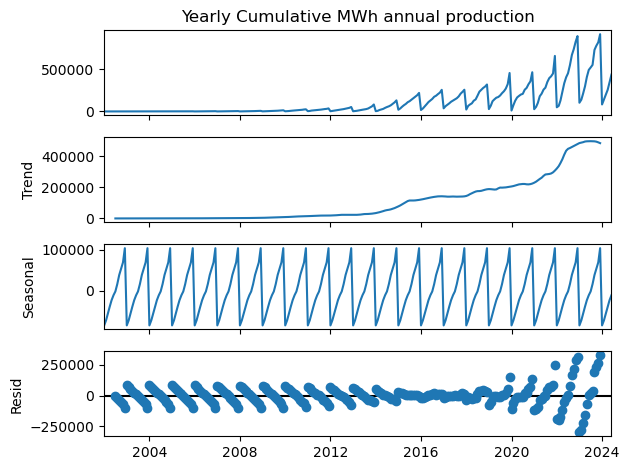

In [305]:

plt.figure(figsize=(20,20))
decompose=seasonal_decompose(df_m_new['Yearly Cumulative MWh annual production'],model='add')
decompose.plot()
plt.show()
plt.close()

**Issue with multiplicative model because of the scaling done which creates some 0 values**

Overcoming error thrown with zero by adding a finite value of 0.00000001

### Multiplicative

<Figure size 2000x2000 with 0 Axes>

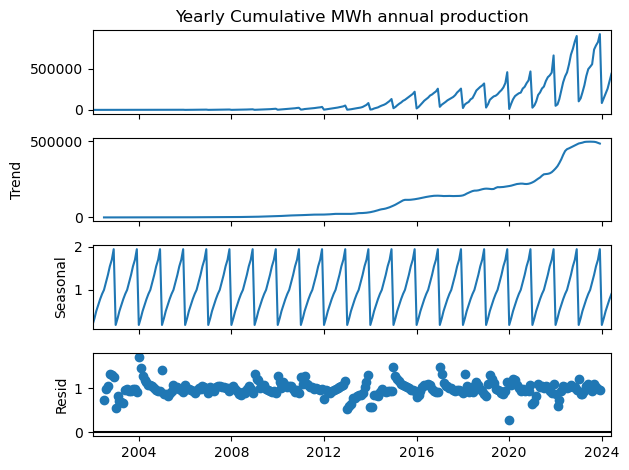

In [306]:
## There were missing values before 2015; threw error when tried decomposing using multiplicative model

plt.figure(figsize=(20,20))
decompose=seasonal_decompose(df_m_new['Yearly Cumulative MWh annual production'],model='mul')
decompose.plot()
plt.show()
plt.close()

## Time Series Visualizations

- __[plot_acf](https://www.statsmodels.org/stable/generated/statsmodels.graphics.tsaplots.plot_acf.html#statsmodels.graphics.tsaplots.plot_acf)__: Plot of the Autocorrelation Function
- __[plot_pacf](https://www.statsmodels.org/stable/generated/statsmodels.graphics.tsaplots.plot_pacf.html#statsmodels.graphics.tsaplots.plot_pacf)__: Plot of the Partial Autocorrelation Function
- __[month_plot](https://www.statsmodels.org/stable/generated/statsmodels.graphics.tsaplots.month_plot.html#statsmodels.graphics.tsaplots.month_plot)__: Seasonal Plot for Monthly Data
- __[quarter_plot](https://www.statsmodels.org/stable/generated/statsmodels.graphics.tsaplots.quarter_plot.html#statsmodels.graphics.tsaplots.quarter_plot)__: Seasonal Plot for Quarterly Data




**Since first differencing is required to achieve stationarity using the Differenced data for pacf and acf graphs**

In [307]:
k=(df_m_new[(df_m_new['Yearly Cumulative MWh annual production'].index.year<2023) ]['Yearly Cumulative MWh annual production'])

k-=k.shift(1)
k-=k.shift(1)

k.head()
k.dropna(inplace=True)

## PACF and ACF

Autocorrelation Plots


<Figure size 1000x1000 with 0 Axes>

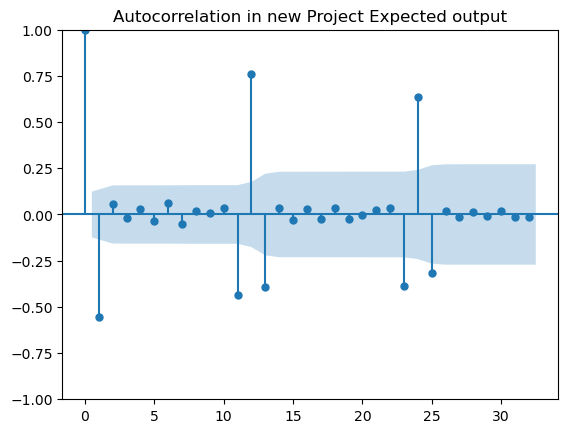

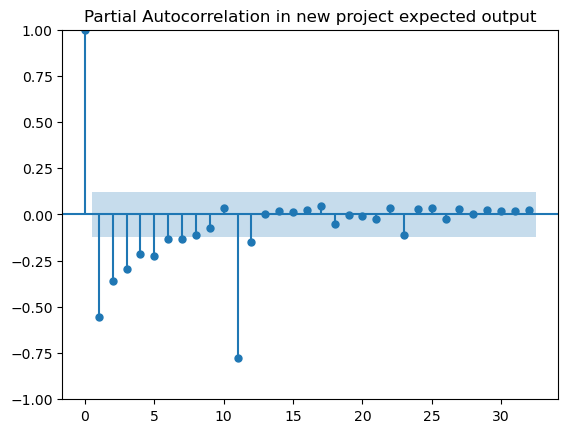

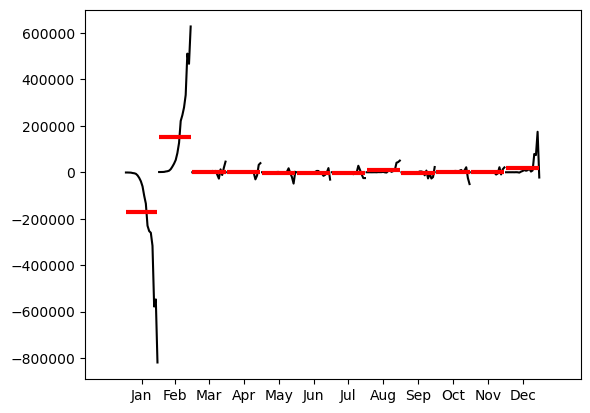

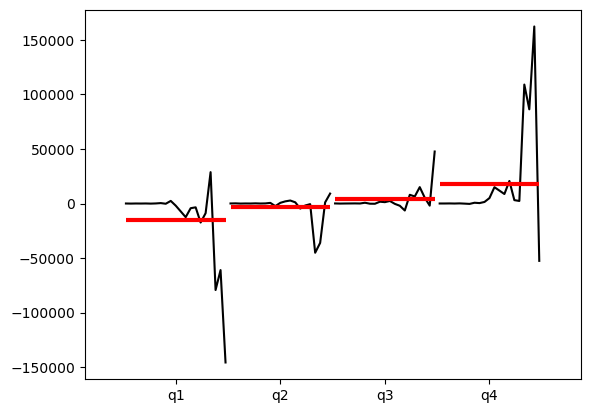

In [308]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf, month_plot, quarter_plot

print('Autocorrelation Plots')
# Autocorrelation and Partial Autocorrelation Functions for weekly data
#plot_acf
plt.figure(figsize=(10,10))
acf_plot = plot_acf(k,lags=32, title='Autocorrelation in new Project Expected output')

pacf_plot = plot_pacf(k,lags=32, title='Partial Autocorrelation in new project expected output')

month= month_plot(k)  #This is done using all the continuous dates from 2000-12 to last project completed in 2024
quarter= quarter_plot(k.resample('Q').sum())


<Axes: xlabel='Month-Year'>

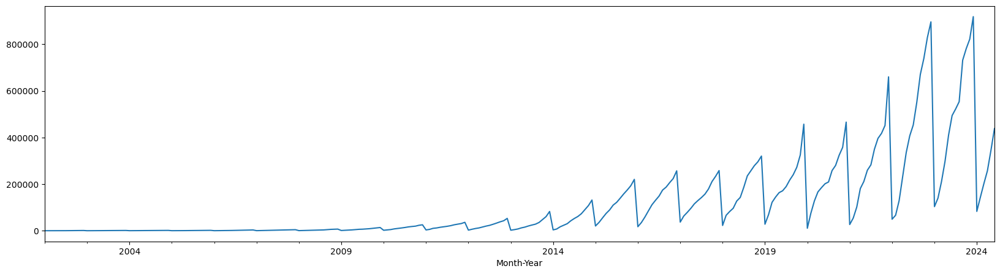

In [309]:
df_m_new['Yearly Cumulative MWh annual production'].plot(figsize=plotsize)

In [310]:
Train=(df_m_new[(df_m_new['Yearly Cumulative MWh annual production'].index.year<2023) ]['Yearly Cumulative MWh annual production'])
Train.shape

(252,)

<Axes: xlabel='Month-Year'>

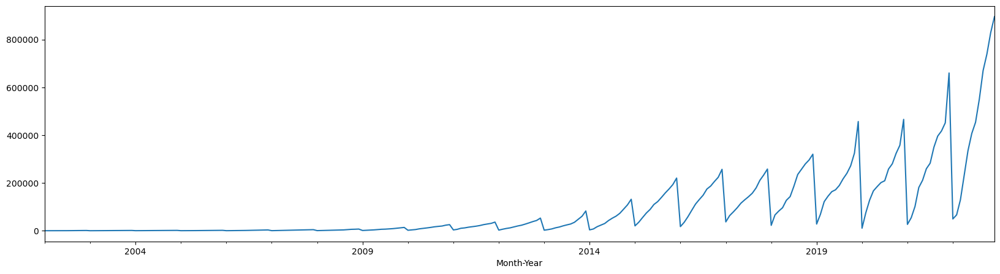

In [311]:
Train.plot(figsize=plotsize)

<Axes: xlabel='Month-Year'>

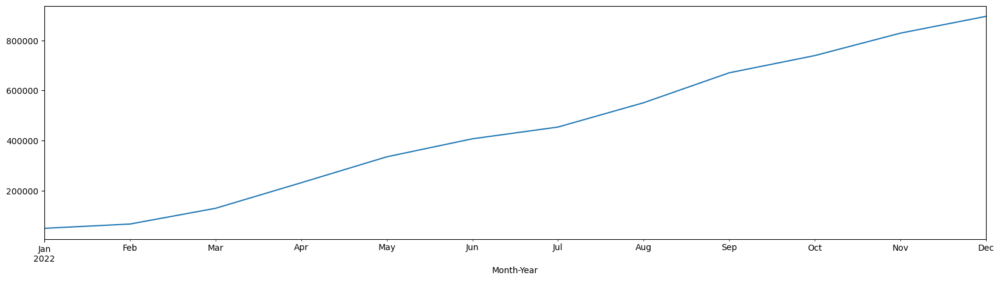

In [312]:
Train[Train.index.year==2022].plot(figsize=plotsize)

In [313]:
Test=(df_m_new[df_m_new.index.year==2023]['Yearly Cumulative MWh annual production'])
Test.shape

(12,)

<Axes: xlabel='Month-Year'>

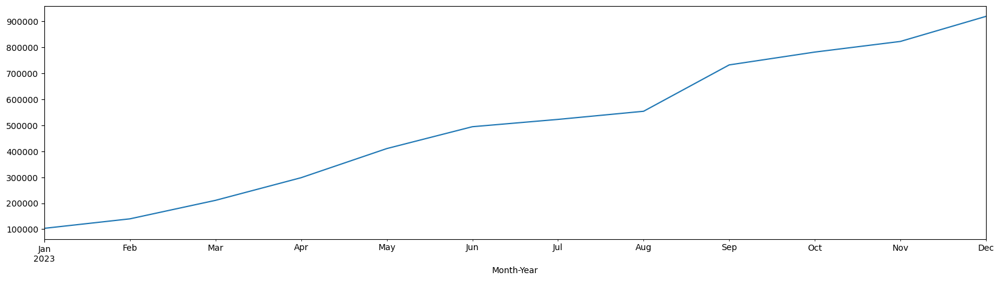

In [314]:
Test.plot(figsize=plotsize)

In [315]:
Train.shape

(252,)

In [316]:
Test.shape

(12,)

## ARIMA model

In [317]:
from statsmodels.tsa.arima.model import ARIMA,ARIMAResults
model_ARIMA=ARIMA((Train),order=([1,2,3,4,11],Difference,[1,11,12])) # 
model_Arima_fit=model_ARIMA.fit()
model_Arima_fit.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                          SARIMAX Results                                          
===================================================================================================
Dep. Variable:     Yearly Cumulative MWh annual production   No. Observations:                  252
Model:             ARIMA([1, 2, 3, 4, 11], 2, [1, 11, 12])   Log Likelihood                 -15.826
Date:                                     Wed, 17 Jul 2024   AIC                             49.652
Time:                                             16:36:25   BIC                             81.345
Sample:                                         01-01-2002   HQIC                            62.408
                                              - 12-01-2022                                         
Covariance Type:                                       opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -2.1936   1.36e-05  -1.62e+05      0.000      -2.194      -2.194
ar.L2         -2.4969   5.62e-08  -4.44e+07      0.000      -2.497      -2.497
ar.L3         -2.0366   9.05e-06  -2.25e+05      0.000      -2.037      -2.037
ar.L4         -1.1575   3.39e-06  -3.41e+05      0.000      -1.158      -1.158
ar.L11        -0.2093   1.19e-05  -1.77e+04      0.000      -0.209      -0.209
ma.L1          1.9814   8.71e-08   2.28e+07      0.000       1.981       1.981
ma.L11         1.9761   8.34e-08   2.37e+07      0.000       1.976       1.976
ma.L12         0.9660    1.7e-07   5.68e+06      0.000       0.966       0.966
sigma2      4.435e+09   2.17e-20   2.05e+29      0.000    4.44e+09    4.44e+09
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):            635572.75
Prob(Q):                              0.95   Prob(JB):                         0.00
Heteroskedasticity (H):               0.00   Skew:                            15.72
Prob(H) (two-sided):                  0.00   Kurtosis:                       248.00
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 5.27e+45. Standard errors may be unstable.
"""

<div class='alert alert-block alert-success'><b>Model Fit and Significance:

- Log Likelihood: This value measures how well the model fits the data. Higher values indicate a better fit.
- AIC (Akaike Information Criterion) and BIC (Bayesian Information Criterion): These are metrics for comparing models. Lower values are preferable, as they suggest a good balance between model complexity and goodness of fit.
- Ljung-Box (Q): This test assesses whether the model's residuals (the differences between the predicted and actual values) are independent. A high p-value (e.g., 0.95) suggests that the model captures the underlying patterns well.power.

Diagnostic Tests:

- Jarque-Bera (JB): This test examines whether the residuals are normally distributed. The extremely low p-value indicates that they are not.
- Heteroskedasticity (H): This test checks for unequal variances in the residuals. The low p-value suggests that heteroskedasticity is present.
- Skewness and Kurtosis: These statistics describe the shape of the distribution of residuals. High values for both indicate a distribution that is far from normal.</b></div>

### Testing

In [318]:
##prediction
pred_start_date=Test.index[0]
pred_end_date=Test.index[-1]
print(pred_start_date)
print(pred_end_date)

2023-01-01 00:00:00
2023-12-01 00:00:00


In [319]:
Train.head()

Month-Year
2002-01-01    16.305000
2002-02-01    20.061000
2002-03-01    33.677000
2002-04-01    51.612000
2002-05-01   103.272000
Name: Yearly Cumulative MWh annual production, dtype: float64

In [320]:
Test.head()

Month-Year
2023-01-01   103365.994000
2023-02-01   139870.801000
2023-03-01   210981.305000
2023-04-01   298043.333000
2023-05-01   409933.582000
Name: Yearly Cumulative MWh annual production, dtype: float64

In [321]:
pred=model_Arima_fit.predict(start=pred_start_date,end=pred_end_date)
# pred=pd.DataFrame(pred,index=pred.index)
# pred.rename(columns={f"{pred.columns[0]}":f"{Test.columns[0]}"},inplace=True)
residuals=Test-pred

In [322]:
residuals

Month-Year
2023-01-01    -795444256592074496.000000
2023-02-01    1201699817414997760.000000
2023-03-01   -1425140585196560384.000000
2023-04-01    1338411349627246592.000000
2023-05-01    -853213244307857024.000000
2023-06-01     -41361718647023200.000000
2023-07-01    1247871192877654016.000000
2023-08-01   -2548095506637975040.000000
2023-09-01    3619249097275873792.000000
2023-10-01   -4084732875629716992.000000
2023-11-01    3597988470660585984.000000
2023-12-01   -1948415403139915008.000000
dtype: float64

In [323]:
pred

2023-01-01     795444256592177920.000000
2023-02-01   -1201699817414857984.000000
2023-03-01    1425140585196771328.000000
2023-04-01   -1338411349626948608.000000
2023-05-01     853213244308267008.000000
2023-06-01      41361718647517184.000000
2023-07-01   -1247871192877131776.000000
2023-08-01    2548095506638528512.000000
2023-09-01   -3619249097275142144.000000
2023-10-01    4084732875630497792.000000
2023-11-01   -3597988470659764224.000000
2023-12-01    1948415403140833280.000000
Freq: MS, Name: predicted_mean, dtype: float64

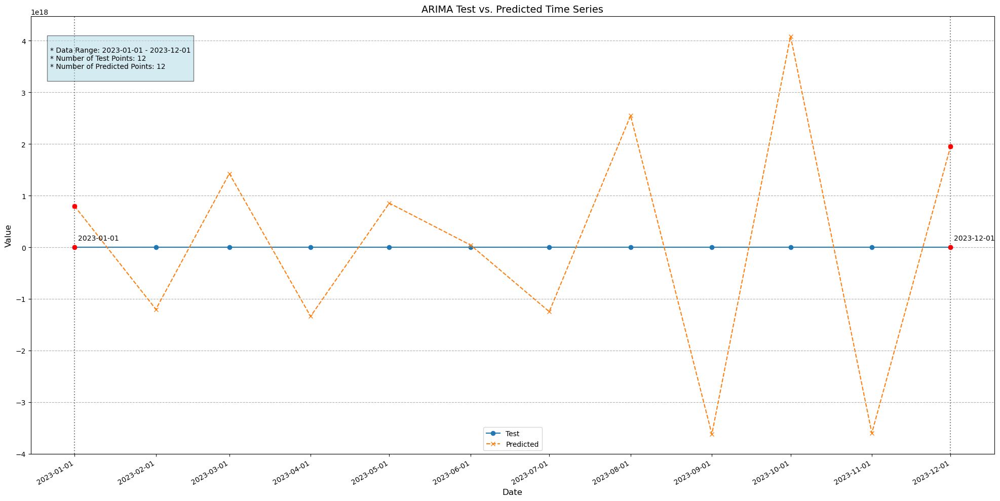

<Figure size 640x480 with 0 Axes>

In [325]:


plt.figure(figsize=(20, 10))

# Plot the data
plt.plot(Test.index, Test, label='Test', marker='o', linestyle='-')
plt.plot(pred.index, pred, label='Predicted', marker='x', linestyle='--')

# Highlight specific points
highlight_points = [Test.index[0], Test.index[11]]  # Replace with the desired datetimes you want to mark
for point in highlight_points:
    plt.scatter(point, Test[point], color='red', zorder=5)
    plt.scatter(point, pred[point], color='red', zorder=5)
    plt.axvline(point, color='gray', linestyle=':')

# Add annotations
for point in highlight_points:
    plt.annotate(f'{point.strftime("%Y-%m-%d")}', xy=(point, Test[point]), xytext=(5, 10), textcoords='offset points')


# Customize appearance
plt.xlabel('Date', fontsize=12)
plt.ylabel('Value', fontsize=12)
plt.title('ARIMA Test vs. Predicted Time Series', fontsize=14)
plt.legend(fontsize=10)
plt.grid(axis='y', linestyle='--')

# Format date axis
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
plt.gca().xaxis.set_major_locator(mdates.MonthLocator(interval=1))  # Adjust interval as needed
plt.gcf().autofmt_xdate()

# Add text box with loaded details
text_box = """
* Data Range: {} - {}
* Number of Test Points: {}
* Number of Predicted Points: {}
""".format(Test.index[0].strftime("%Y-%m-%d"), Test.index[-1].strftime("%Y-%m-%d"), len(Test), len(pred))  # Replace with actual details

plt.text(0.02, 0.95, text_box, transform=plt.gca().transAxes, verticalalignment='top', bbox=dict(facecolor='lightblue', alpha=0.5))

plt.tight_layout()
plt.show()
plt.savefig('Yearly_ARIMA_m.png')

### Model Performance

In [326]:
new_row=evaluate_performance(f"ARIMA manual p,d,q selection Yearly", Test.values, pred.values)
res= pd.concat([res,new_row],axis=0,ignore_index=True)

In [327]:
row=mean_predicted(pred)
predicted= pd.concat([predicted,row],axis=0,ignore_index=True)

## SARIMA model

In [328]:
k=(df_m_new['Yearly Cumulative MWh annual production'].copy())

seasonality_diff,stationary_series=adf_test_season(k,12)
d=seasonality_diff-1
D=seasonality_diff-d
print(f"{D=} & {d=}")

ADF Statistics: -4.480822982601321
p- value: 0.00021293894710104735
rejecting the null hypothesis. Data has no unit root and is stationary
D=1 & d=0


**p-value is <0.05 indicating stationarity**

Plots after seasonality


<Figure size 1000x1000 with 0 Axes>

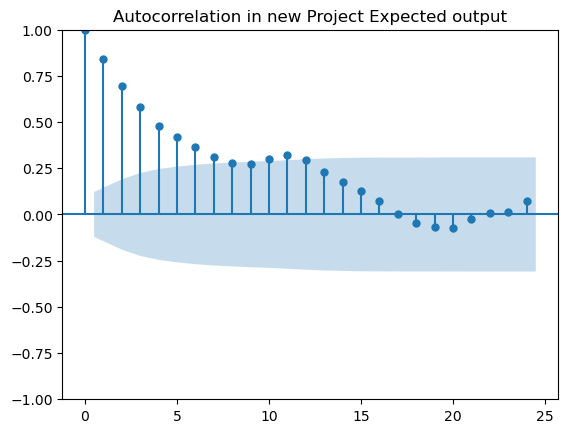

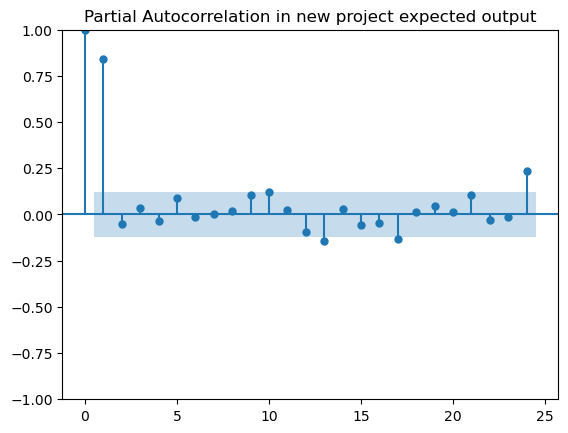

In [329]:
print('Plots after seasonality')

plt.figure(figsize=(10,10))
acf_plot = plot_acf(stationary_series,lags=24, title='Autocorrelation in new Project Expected output')

pacf_plot = plot_pacf(stationary_series,lags=24, title='Partial Autocorrelation in new project expected output')



In [330]:
model=sm.tsa.statespace.SARIMAX(Train,order=([1],0,[1]),seasonal_order=([1],1,0,12)) 
results=model.fit()

<IPython.core.display.Javascript object>

In [331]:
print(results.summary())

                                          SARIMAX Results                                          
Dep. Variable:     Yearly Cumulative MWh annual production   No. Observations:                  252
Model:                     SARIMAX(1, 0, 1)x(1, 1, [], 12)   Log Likelihood               -2763.213
Date:                                     Wed, 17 Jul 2024   AIC                           5534.427
Time:                                             16:36:27   BIC                           5548.349
Sample:                                         01-01-2002   HQIC                          5540.036
                                              - 12-01-2022                                         
Covariance Type:                                       opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.9716      0.017     55.78

<div class='alert alert-block alert-success'><b>Analysis:

- Significant Coefficients: All estimated coefficients (AR, MA, and seasonal AR) are statistically significant (p-values < 0.05), meaning they likely have a real effect on the time series.
- No Autocorrelation: The Ljung-Box test for autocorrelation in the residuals has a high p-value (0.53), suggesting the model effectively captures the linear dependencies in the data.

- The Ljung-Box (Q) test indicates that there is no significant autocorrelation in the residuals at lag 1, suggesting the model adequately captures the dependencies in the data.
- The Jarque-Bera (JB) test strongly rejects the hypothesis of normally distributed residuals. This suggests that the residuals may not be well-behaved and could impact the validity of statistical inferences.
- The Heteroskedasticity (H) test also suggests the presence of heteroskedasticity, indicating that the variance of the residuals is not constant over time.</b></div>

### Testing

In [332]:
##prediction
pred_start_date=Test.index[0]
pred_end_date=Test.index[-1]
print(pred_start_date)
print(pred_end_date)

2023-01-01 00:00:00
2023-12-01 00:00:00


In [333]:
pred=results.predict(start=pred_start_date,end=pred_end_date)
manual_pred=pred
# pred=pd.DataFrame(pred,index=pred.index)
# pred.rename(columns={f"{pred.columns[0]}":f"{Test.columns[0]}"},inplace=True)
residuals=Test-pred

In [334]:
res_manual=residuals
residuals

Month-Year
2023-01-01   -190367.194096
2023-02-01   -163717.824406
2023-03-01   -149186.258358
2023-04-01   -158313.881104
2023-05-01   -145799.075468
2023-06-01   -128219.484726
2023-07-01   -141719.805711
2023-08-01   -202603.532927
2023-09-01   -140484.603770
2023-10-01   -155771.876189
2023-11-01   -200791.425044
2023-12-01   -162028.905025
dtype: float64

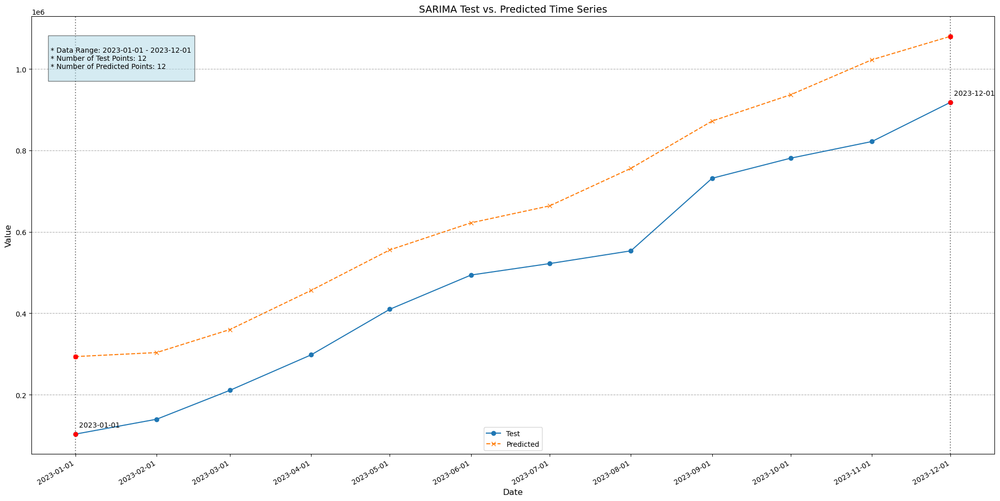

In [336]:


plt.figure(figsize=(20, 10))

# Plot the data
plt.plot(Test.index, Test, label='Test', marker='o', linestyle='-')
plt.plot(pred.index, pred, label='Predicted', marker='x', linestyle='--')

# Highlight specific points
highlight_points = [Test.index[0], Test.index[11]]  # Replace with the desired datetimes you want to mark
for point in highlight_points:
    plt.scatter(point, Test[point], color='red', zorder=5)
    plt.scatter(point, pred[point], color='red', zorder=5)
    plt.axvline(point, color='gray', linestyle=':')

# Add annotations
for point in highlight_points:
    plt.annotate(f'{point.strftime("%Y-%m-%d")}', xy=(point, Test[point]), xytext=(5, 10), textcoords='offset points')


# Customize appearance
plt.xlabel('Date', fontsize=12)
plt.ylabel('Value', fontsize=12)
plt.title('SARIMA Test vs. Predicted Time Series', fontsize=14)
plt.legend(fontsize=10)
plt.grid(axis='y', linestyle='--')

# Format date axis
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
plt.gca().xaxis.set_major_locator(mdates.MonthLocator(interval=1))  # Adjust interval as needed
plt.gcf().autofmt_xdate()

# Add text box with loaded details
text_box = """
* Data Range: {} - {}
* Number of Test Points: {}
* Number of Predicted Points: {}
""".format(Test.index[0].strftime("%Y-%m-%d"), Test.index[-1].strftime("%Y-%m-%d"), len(Test), len(pred))  # Replace with actual details

plt.text(0.02, 0.95, text_box, transform=plt.gca().transAxes, verticalalignment='top', bbox=dict(facecolor='lightblue', alpha=0.5))

plt.tight_layout()
plt.show()


### Model Performance

In [337]:
new_row=evaluate_performance(f"SARIMA manual p,d,q selection Yearly", Test.values, pred.values)
res= pd.concat([res,new_row],axis=0,ignore_index=True)

In [338]:
row=mean_predicted(pred)
predicted= pd.concat([predicted,row],axis=0,ignore_index=True)

## Auto SARIMA

In [339]:
import pmdarima as pm

auto_model = pm.auto_arima(
    Train, 
    start_p=0, start_q=0,  # Starting values for non-seasonal p and q
    max_p=24, max_q=7,      # Maximum values for non-seasonal p and q
    start_P=0, start_Q=0,  # Starting values for seasonal P and Q
    max_P=1, max_Q=2,      # Maximum values for seasonal P and Q
    m=12,                   # Seasonality 12 in year data
    seasonal=True,          # Explicitly indicate seasonal model
    d=None, D=None,         # Let the algorithm determine d and D
    trace=True,            # Print results of the search
    error_action='ignore',  # Ignore convergence warnings (if any)
    suppress_warnings=True, # Suppress other warnings
    stepwise=True,
    with_intercept='auto'
)

print(auto_model.summary())

Performing stepwise search to minimize aic
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=5515.567, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=5511.961, Time=0.12 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=5511.182, Time=0.14 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=5509.196, Time=0.06 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=5511.164, Time=0.11 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=5499.827, Time=0.37 sec
 ARIMA(0,1,1)(1,1,2)[12]             : AIC=5478.398, Time=0.67 sec
 ARIMA(0,1,1)(0,1,2)[12]             : AIC=5476.418, Time=0.31 sec
 ARIMA(0,1,0)(0,1,2)[12]             : AIC=5504.695, Time=0.21 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=5478.430, Time=0.44 sec
 ARIMA(0,1,2)(0,1,2)[12]             : AIC=5479.062, Time=0.39 sec
 ARIMA(1,1,0)(0,1,2)[12]             : AIC=5475.971, Time=0.25 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=5511.962, Time=0.12 sec
 ARIMA(1,1,0)(1,1,2)[12]             : AIC=5477.938, Time=0.60 sec
 ARIMA(1,1,0)(1,1,1

### Testing

In [340]:
##prediction
pred_start_date=Test.index[0]
pred_end_date=Test.index[-1]
print(pred_start_date)
print(pred_end_date)
print(pred_start_date-pred_end_date)

2023-01-01 00:00:00
2023-12-01 00:00:00
-334 days +00:00:00


In [341]:
pred=auto_model.predict(n_periods=12)
auto_pred=pred
# pred=pd.DataFrame(pred,index=Test.index)
# pred.rename(columns={f"{pred.columns[0]}":f"{Test.columns[0]}"},inplace=True)
residuals=Test-pred

In [342]:
res_auto=residuals
residuals

Month-Year
2023-01-01   -214628.335355
2023-02-01   -176738.291771
2023-03-01   -154929.481710
2023-04-01   -185964.128167
2023-05-01   -182653.863108
2023-06-01   -186338.950359
2023-07-01   -216370.053832
2023-08-01   -293347.033174
2023-09-01   -244654.954476
2023-10-01   -251672.786432
2023-11-01   -289829.781790
2023-12-01   -286979.435194
dtype: float64

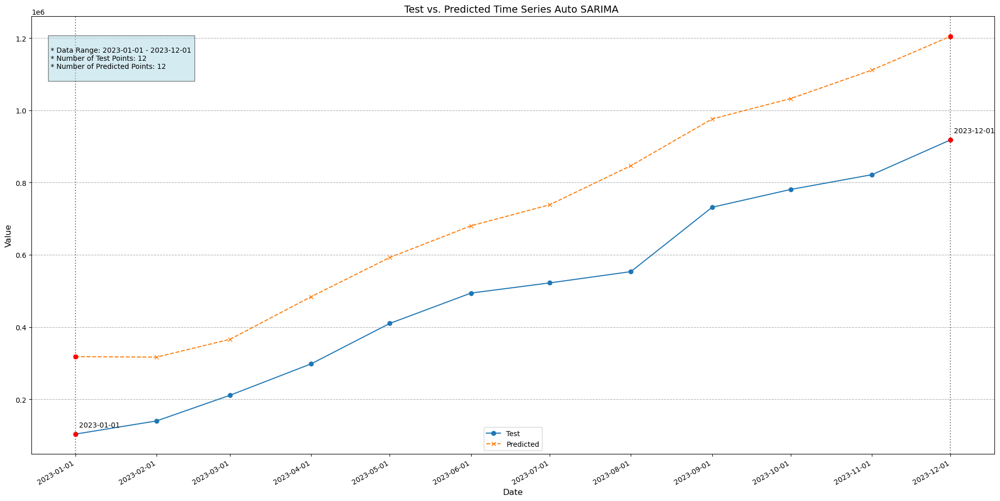

In [344]:


plt.figure(figsize=(20, 10))

# Plot the data
plt.plot(Test.index, Test, label='Test', marker='o', linestyle='-')
plt.plot(pred.index, pred, label='Predicted', marker='x', linestyle='--')

# Highlight specific points
highlight_points = [Test.index[0], Test.index[11]]  # Replace with the desired datetimes you want to mark
for point in highlight_points:
    plt.scatter(point, Test[point], color='red', zorder=5)
    plt.scatter(point, pred[point], color='red', zorder=5)
    plt.axvline(point, color='gray', linestyle=':')

# Add annotations
for point in highlight_points:
    plt.annotate(f'{point.strftime("%Y-%m-%d")}', xy=(point, Test[point]), xytext=(5, 10), textcoords='offset points')


# Customize appearance
plt.xlabel('Date', fontsize=12)
plt.ylabel('Value', fontsize=12)
plt.title('Test vs. Predicted Time Series Auto SARIMA ', fontsize=14)
plt.legend(fontsize=10)
plt.grid(axis='y', linestyle='--')

# Format date axis
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
plt.gca().xaxis.set_major_locator(mdates.MonthLocator(interval=1))  # Adjust interval as needed
plt.gcf().autofmt_xdate()

# Add text box with loaded details
text_box = """
* Data Range: {} - {}
* Number of Test Points: {}
* Number of Predicted Points: {}
""".format(Test.index[0].strftime("%Y-%m-%d"), Test.index[-1].strftime("%Y-%m-%d"), len(Test), len(pred))  # Replace with actual details

plt.text(0.02, 0.95, text_box, transform=plt.gca().transAxes, verticalalignment='top', bbox=dict(facecolor='lightblue', alpha=0.5))

plt.tight_layout()
plt.show()


### Model Performance

In [345]:
new_row=evaluate_performance(f"Auto SARIMA Yearly", Test.values, pred.values)
res= pd.concat([res,new_row],axis=0,ignore_index=True)

In [346]:
row=mean_predicted(pred)
predicted= pd.concat([predicted,row],axis=0,ignore_index=True)

## AutoModel predictions vs Manually selected predictions

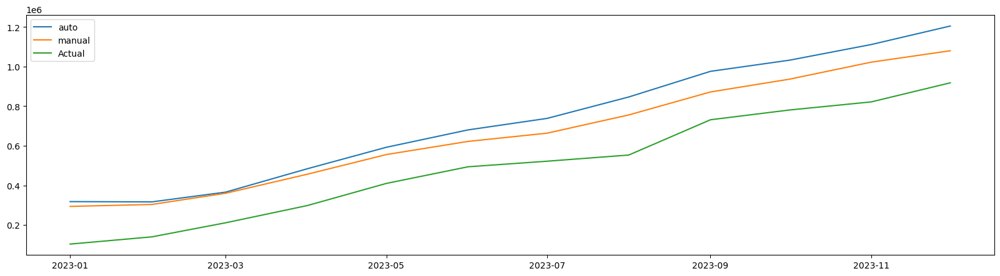

In [347]:
plt.figure(figsize=(20,5))
p1=plt.plot(auto_pred, label='auto')
p2=plt.plot(manual_pred, label='manual')
p3=plt.plot(Test, label='Actual')
plt.legend()
plt.show()

## Holt-Winters

In [348]:
df_m_hw =(df_m_new)
df_m_hw=df_m_hw[df_m_hw.index.year<=2023]['Yearly Cumulative MWh annual production'].copy()

In [349]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.holtwinters import ExponentialSmoothing



# Split into training and testing sets (optional)
train = df_m_hw.iloc[:-12]  
test = df_m_hw.iloc[-12:]

# Fit the Holt-Winters model (choose the appropriate seasonal component: 'add' or 'mul')
model = ExponentialSmoothing(train, seasonal_periods=12, trend='add', seasonal='mul').fit()

# Make predictions on the test set (optional)
predictions = model.forecast(steps=len(test))

# Evaluate the model (optional)
from sklearn.metrics import mean_squared_error
mse = mean_squared_error(test, predictions)
print('MSE:', mse)



MSE: 4986635794.025876


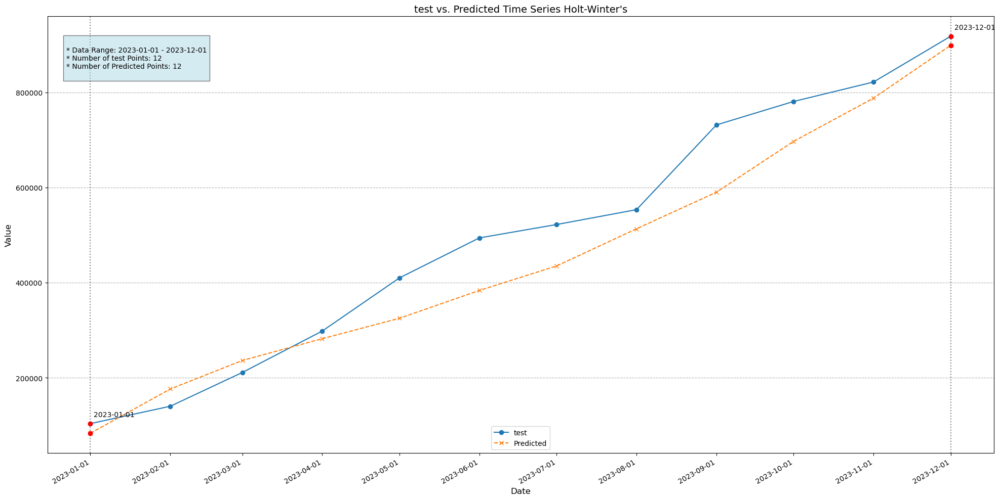

In [350]:
plt.figure(figsize=(20, 10))

# Plot the data
plt.plot(test.index, test, label='test', marker='o', linestyle='-')
plt.plot(predictions.index, predictions, label='Predicted', marker='x', linestyle='--')

# Highlight specific points
highlight_points = [test.index[0], test.index[11]]  # Replace with the desired datetimes you want to mark
for point in highlight_points:
    plt.scatter(point, test[point], color='red', zorder=5)
    plt.scatter(point, predictions[point], color='red', zorder=5)
    plt.axvline(point, color='gray', linestyle=':')

# Add annotations
for point in highlight_points:
    plt.annotate(f'{point.strftime("%Y-%m-%d")}', xy=(point, test[point]), xytext=(5, 10), textcoords='offset points')


# Customize appearance
plt.xlabel('Date', fontsize=12)
plt.ylabel('Value', fontsize=12)
plt.title('test vs. Predicted Time Series Holt-Winter\'s', fontsize=14)
plt.legend(fontsize=10)
plt.grid(axis='y', linestyle='--')

# Format date axis
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
plt.gca().xaxis.set_major_locator(mdates.MonthLocator(interval=1))  # Adjust interval as needed
plt.gcf().autofmt_xdate()

# Add text box with loaded details
text_box = """
* Data Range: {} - {}
* Number of test Points: {}
* Number of Predicted Points: {}
""".format(test.index[0].strftime("%Y-%m-%d"), test.index[-1].strftime("%Y-%m-%d"), len(test), len(predictions))  # Replace with actual details

plt.text(0.02, 0.95, text_box, transform=plt.gca().transAxes, verticalalignment='top', bbox=dict(facecolor='lightblue', alpha=0.5))

plt.tight_layout()
plt.show()


### Model Performance

In [351]:
new_row=evaluate_performance(f"Holt-Winter Yearly", test.values, predictions.values)
res= pd.concat([res,new_row],axis=0,ignore_index=True)

In [352]:
row=mean_predicted(predictions)
predicted= pd.concat([predicted,row],axis=0,ignore_index=True)

# With log transform 2002 to 2022

## Yearly Cumulative MWh annual production

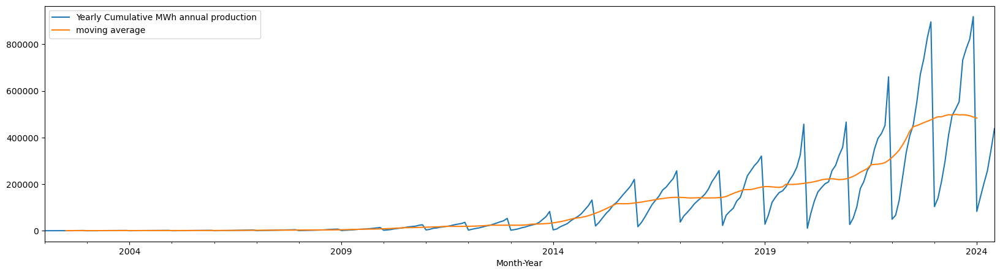

In [353]:
# Using Center parameter for the moving window
j=df_m_new.copy()
j['moving average']=df_m_new['Yearly Cumulative MWh annual production'].rolling(12,center=True).mean()
j[['Yearly Cumulative MWh annual production','moving average']].plot(figsize=plotsize)
plt.show()


### Differencing recursively to a Stationary series

In [354]:

k=df_m_new.copy()
Difference=adf_test(np.log(df_m_new[(df_m_new['Yearly Cumulative MWh annual production'].index.year<2023)]['Yearly Cumulative MWh annual production']))
print(f"\n{Difference= }")

ADF Statistics: -0.9927604683308252
p- value: 0.7558955872311238
Fail to reject null hypothesis, time series has a unit root, indicating it is non-stationary
 
ADF Statistics: -4.628636387130436
p- value: 0.00011434899065793085
rejecting the null hypothesis. Data has no unit root and is stationary

Difference= 1


**The differencing value is 1 because the data is stationary after shifting once**

## Decompostion

### Additive

<Figure size 2000x2000 with 0 Axes>

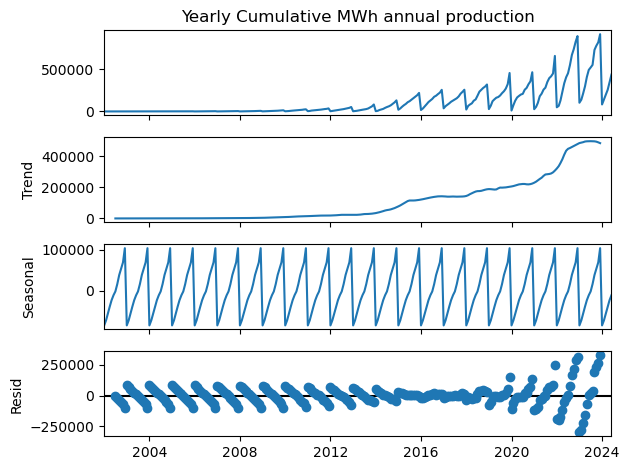

In [355]:

plt.figure(figsize=(20,20))
decompose=seasonal_decompose(df_m_new['Yearly Cumulative MWh annual production'],model='add')
decompose.plot()
plt.show()
plt.close()

**Issue with multiplicative model because of the scaling done which creates some 0 values**

Overcoming error thrown with zero by adding a finite value of 0.00000001

### Multiplicative

<Figure size 2000x2000 with 0 Axes>

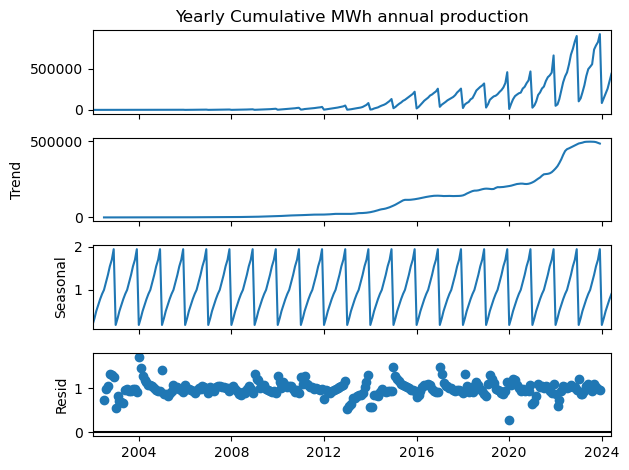

In [356]:
## There were missing values before 2015; threw error when tried decomposing using multiplicative model

plt.figure(figsize=(20,20))
decompose=seasonal_decompose(df_m_new['Yearly Cumulative MWh annual production']+0.000000001,model='mul')
decompose.plot()
plt.show()
plt.close()

## Time Series Visualizations

- __[plot_acf](https://www.statsmodels.org/stable/generated/statsmodels.graphics.tsaplots.plot_acf.html#statsmodels.graphics.tsaplots.plot_acf)__: Plot of the Autocorrelation Function
- __[plot_pacf](https://www.statsmodels.org/stable/generated/statsmodels.graphics.tsaplots.plot_pacf.html#statsmodels.graphics.tsaplots.plot_pacf)__: Plot of the Partial Autocorrelation Function
- __[month_plot](https://www.statsmodels.org/stable/generated/statsmodels.graphics.tsaplots.month_plot.html#statsmodels.graphics.tsaplots.month_plot)__: Seasonal Plot for Monthly Data
- __[quarter_plot](https://www.statsmodels.org/stable/generated/statsmodels.graphics.tsaplots.quarter_plot.html#statsmodels.graphics.tsaplots.quarter_plot)__: Seasonal Plot for Quarterly Data




**Since first differencing is required to achieve stationarity using the Differenced data for pacf and acf graphs**

In [357]:
k=np.log(df_m_new[(df_m_new['Yearly Cumulative MWh annual production'].index.year<2023) ]['Yearly Cumulative MWh annual production'])

k-=k.shift(1)
k-=k.shift(1)

k.head()
k.dropna(inplace=True)

## PACF and ACF

Autocorrelation Plots


<Figure size 1000x1000 with 0 Axes>

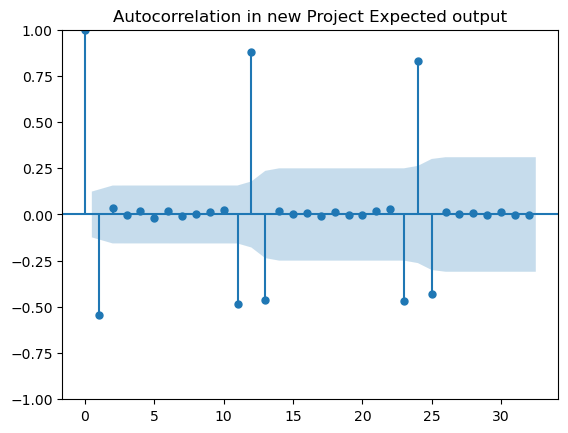

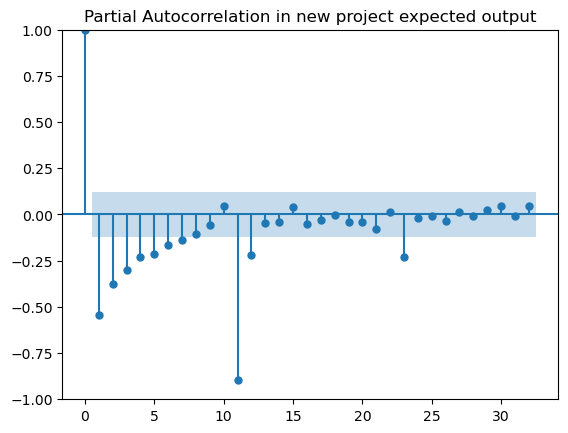

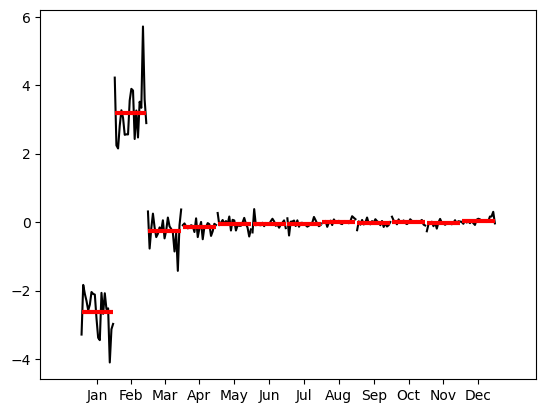

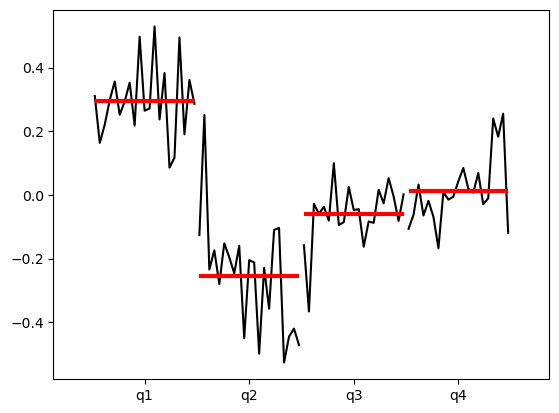

In [358]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf, month_plot, quarter_plot

print('Autocorrelation Plots')
# Autocorrelation and Partial Autocorrelation Functions for weekly data
#plot_acf
plt.figure(figsize=(10,10))
acf_plot = plot_acf(k,lags=32, title='Autocorrelation in new Project Expected output')

pacf_plot = plot_pacf(k,lags=32, title='Partial Autocorrelation in new project expected output')

month= month_plot(k)  #This is done using all the continuous dates from 2000-12 to last project completed in 2024
quarter= quarter_plot(k.resample('Q').sum())


<Axes: xlabel='Month-Year'>

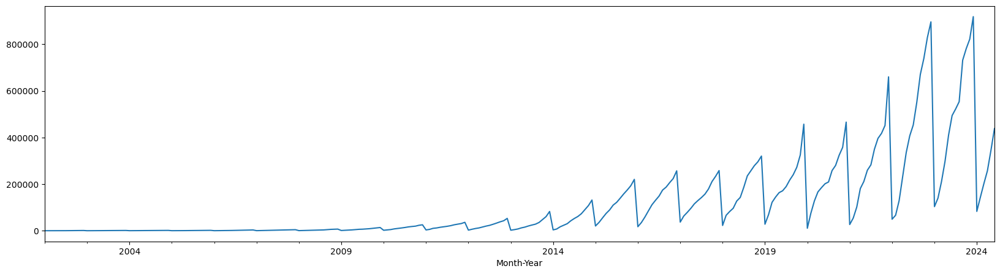

In [359]:
df_m_new['Yearly Cumulative MWh annual production'].plot(figsize=plotsize)

In [360]:
Train=np.log(df_m_new[(df_m_new['Yearly Cumulative MWh annual production'].index.year<2023) ]['Yearly Cumulative MWh annual production'])
Train.shape

(252,)

<Axes: xlabel='Month-Year'>

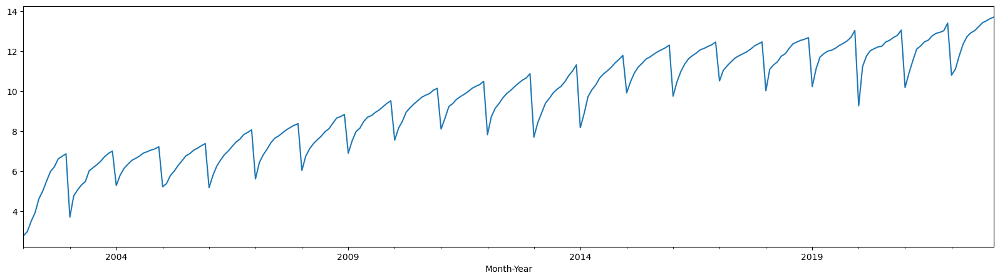

In [361]:
Train.plot(figsize=plotsize)

<Axes: xlabel='Month-Year'>

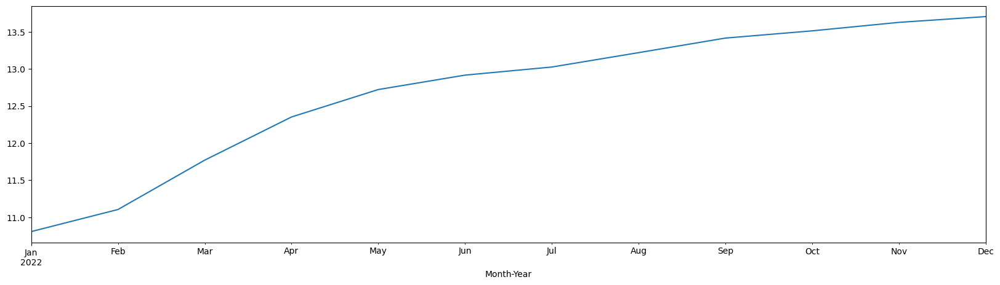

In [362]:
Train[Train.index.year==2022].plot(figsize=plotsize)

In [363]:
Test=np.log(df_m_new[df_m_new['Yearly Cumulative MWh annual production'].index.year==2023]['Yearly Cumulative MWh annual production'])
Test.shape

(12,)

<Axes: xlabel='Month-Year'>

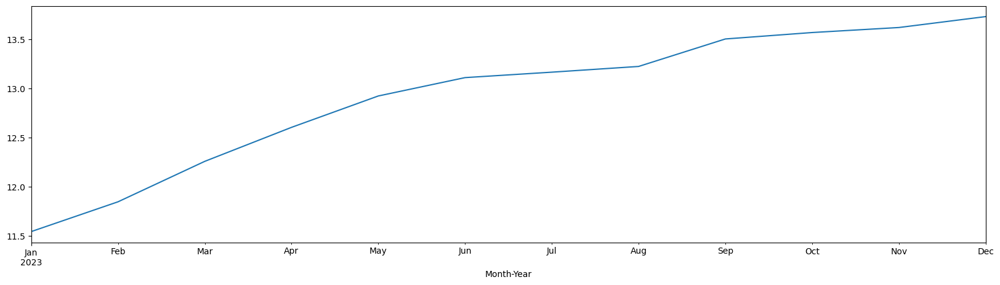

In [364]:
Test.plot(figsize=plotsize)

In [365]:
Train.shape

(252,)

In [366]:
Test.shape

(12,)

## ARIMA model

In [367]:
from statsmodels.tsa.arima.model import ARIMA,ARIMAResults
model_ARIMA=ARIMA((Train),order=([1],Difference,[12])) # 
model_Arima_fit=model_ARIMA.fit()
model_Arima_fit.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                          SARIMAX Results                                          
===================================================================================================
Dep. Variable:     Yearly Cumulative MWh annual production   No. Observations:                  252
Model:                                   ARIMA(1, 1, [12])   Log Likelihood                -191.488
Date:                                     Wed, 17 Jul 2024   AIC                            388.976
Time:                                             16:36:38   BIC                            399.553
Sample:                                         01-01-2002   HQIC                           393.232
                                              - 12-01-2022                                         
Covariance Type:                                       opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.2397      0.061     -3.904      0.000      -0.360      -0.119
ma.L12         0.7399      0.028     26.765      0.000       0.686       0.794
sigma2         0.2592      0.009     27.413      0.000       0.241       0.278
===================================================================================
Ljung-Box (L1) (Q):                   0.42   Jarque-Bera (JB):              2128.05
Prob(Q):                              0.52   Prob(JB):                         0.00
Heteroskedasticity (H):               1.52   Skew:                            -3.31
Prob(H) (two-sided):                  0.06   Kurtosis:                        15.64
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

<div class='alert alert-block alert-success'><b>Model Fit and Significance:

- The coefficient estimates for both the autoregressive (ar.L1) and moving average (ma.L12) terms are statistically significant, suggesting they play a crucial role in explaining the variation in the data.
- The negative value for ar.L1 suggests a mean-reverting behavior, where high values tend to be followed by lower values and vice versa.
- The positive value for ma.L12 indicates that positive shocks (unexpected increases) in production tend to be followed by further increases for 12 lags, and then the effect dies out.

Diagnostic Tests:

- The Ljung-Box (Q) test indicates that there is no significant autocorrelation in the residuals at lag 1, suggesting the model adequately captures the dependencies in the data.
- The Jarque-Bera (JB) test strongly rejects the hypothesis of normally distributed residuals. This suggests that the residuals may not be well-behaved and could impact the validity of statistical inferences.
- The Heteroskedasticity (H) test also suggests the presence of heteroskedasticity, indicating that the variance of the residuals is not constant over time./b></div>

### Testing

In [368]:
##prediction
pred_start_date=Test.index[0]
pred_end_date=Test.index[-1]
print(pred_start_date)
print(pred_end_date)

2023-01-01 00:00:00
2023-12-01 00:00:00


In [369]:
Train.head()

Month-Year
2002-01-01   2.791472
2002-02-01   2.998778
2002-03-01   3.516815
2002-04-01   3.943754
2002-05-01   4.637366
Name: Yearly Cumulative MWh annual production, dtype: float64

In [370]:
Test.head()

Month-Year
2023-01-01   11.546031
2023-02-01   11.848474
2023-03-01   12.259525
2023-04-01   12.604994
2023-05-01   12.923750
Name: Yearly Cumulative MWh annual production, dtype: float64

In [371]:
pred=model_Arima_fit.predict(start=pred_start_date,end=pred_end_date)
# pred=pd.DataFrame(pred,index=pred.index)
# pred.rename(columns={f"{pred.columns[0]}":f"{Test.columns[0]}"},inplace=True)
residuals=Test-pred

In [372]:
residuals

Month-Year
2023-01-01   -0.580954
2023-02-01   -0.842450
2023-03-01   -0.697052
2023-04-01   -0.554761
2023-05-01   -0.485837
2023-06-01   -0.372564
2023-07-01   -0.397648
2023-08-01   -0.461967
2023-09-01   -0.263559
2023-10-01   -0.261059
2023-11-01   -0.239159
2023-12-01    0.008886
dtype: float64

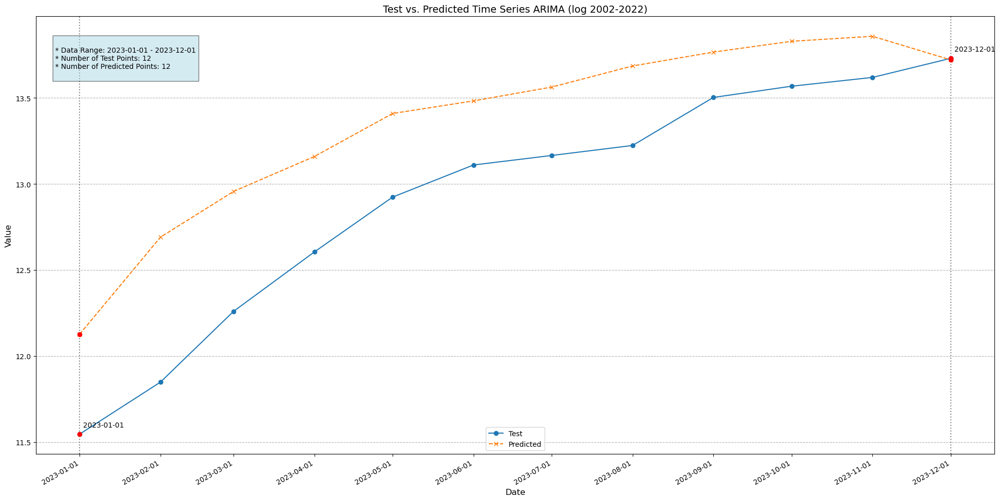

In [373]:


plt.figure(figsize=(20, 10))

# Plot the data
plt.plot(Test.index, Test, label='Test', marker='o', linestyle='-')
plt.plot(pred.index, pred, label='Predicted', marker='x', linestyle='--')

# Highlight specific points
highlight_points = [Test.index[0], Test.index[11]]  # Replace with the desired datetimes you want to mark
for point in highlight_points:
    plt.scatter(point, Test[point], color='red', zorder=5)
    plt.scatter(point, pred[point], color='red', zorder=5)
    plt.axvline(point, color='gray', linestyle=':')

# Add annotations
for point in highlight_points:
    plt.annotate(f'{point.strftime("%Y-%m-%d")}', xy=(point, Test[point]), xytext=(5, 10), textcoords='offset points')


# Customize appearance
plt.xlabel('Date', fontsize=12)
plt.ylabel('Value', fontsize=12)
plt.title('Test vs. Predicted Time Series ARIMA (log 2002-2022)', fontsize=14)
plt.legend(fontsize=10)
plt.grid(axis='y', linestyle='--')

# Format date axis
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
plt.gca().xaxis.set_major_locator(mdates.MonthLocator(interval=1))  # Adjust interval as needed
plt.gcf().autofmt_xdate()

# Add text box with loaded details
text_box = """
* Data Range: {} - {}
* Number of Test Points: {}
* Number of Predicted Points: {}
""".format(Test.index[0].strftime("%Y-%m-%d"), Test.index[-1].strftime("%Y-%m-%d"), len(Test), len(pred))  # Replace with actual details

plt.text(0.02, 0.95, text_box, transform=plt.gca().transAxes, verticalalignment='top', bbox=dict(facecolor='lightblue', alpha=0.5))

plt.tight_layout()
plt.show()


### Model Performance

In [374]:
new_row=evaluate_performance(f"ARIMA manual p,d,q selection Yearly (log 2002-2022)", Test.values, pred.values)
res= pd.concat([res,new_row],axis=0,ignore_index=True)

In [375]:
row=mean_predicted(pred)
predicted= pd.concat([predicted,row],axis=0,ignore_index=True)

## SARIMA model

In [376]:
k=np.log(df_m_new['Yearly Cumulative MWh annual production'].copy())

seasonality_diff,stationary_series=adf_test_season(k,12)
d=seasonality_diff-1
D=seasonality_diff-d
print(f"{D=} & {d=}")

ADF Statistics: -3.3813808233561855
p- value: 0.01161021269197879
rejecting the null hypothesis. Data has no unit root and is stationary
D=1 & d=0


**p-value is <0.05 indicating stationarity**

Plots after seasonality


<Figure size 1000x1000 with 0 Axes>

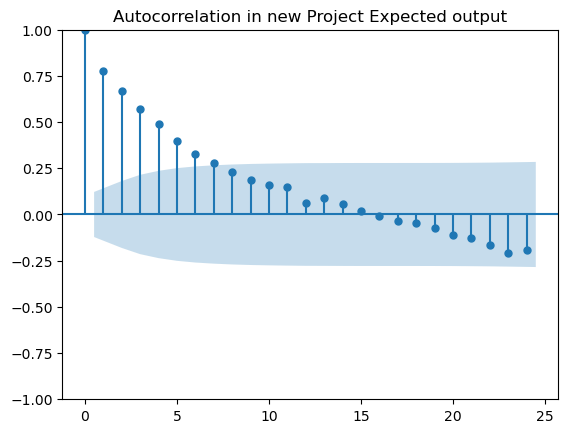

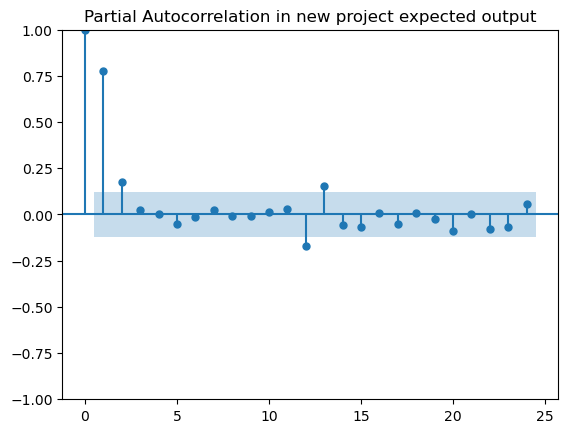

In [377]:
print('Plots after seasonality')

plt.figure(figsize=(10,10))
acf_plot = plot_acf(stationary_series,lags=24, title='Autocorrelation in new Project Expected output')

pacf_plot = plot_pacf(stationary_series,lags=24, title='Partial Autocorrelation in new project expected output')



In [378]:
model=sm.tsa.statespace.SARIMAX(Train,order=([1],0,[1]),seasonal_order=([1],1,0,12)) 
results=model.fit()

<IPython.core.display.Javascript object>

In [379]:
print(results.summary())

                                          SARIMAX Results                                          
Dep. Variable:     Yearly Cumulative MWh annual production   No. Observations:                  252
Model:                     SARIMAX(1, 0, 1)x(1, 1, [], 12)   Log Likelihood                   9.575
Date:                                     Wed, 17 Jul 2024   AIC                            -11.150
Time:                                             16:36:39   BIC                              2.773
Sample:                                         01-01-2002   HQIC                            -5.540
                                              - 12-01-2022                                         
Covariance Type:                                       opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.9782      0.013     74.20

<div class='alert alert-block alert-success'><b>Analysis:

- The coefficient estimates for the autoregressive (ar.L1) and moving average (ma.L1) terms are statistically significant, suggesting they play a role in explaining the variation in the data.
- The seasonal autoregressive term (ar.S.L12) is also statistically significant, indicating it contributes to the model's explanatory power.

- The Ljung-Box (Q) test indicates that there is no significant autocorrelation in the residuals at lag 1, suggesting the model adequately captures the dependencies in the data.
- The Jarque-Bera (JB) test strongly rejects the hypothesis of normally distributed residuals, suggesting that the residuals may not be well-behaved and could impact the validity of statistical inferences.
- The Heteroskedasticity (H) test does not suggest the presence of heteroskedasticity, indicating that the variance of the residuals is relatively constant over time.</b></div>

### Testing

In [380]:
##prediction
pred_start_date=Test.index[0]
pred_end_date=Test.index[-1]
print(pred_start_date)
print(pred_end_date)

2023-01-01 00:00:00
2023-12-01 00:00:00


In [381]:
pred=results.predict(start=pred_start_date,end=pred_end_date)
manual_pred=pred
# pred=pd.DataFrame(pred,index=pred.index)
# pred.rename(columns={f"{pred.columns[0]}":f"{Test.columns[0]}"},inplace=True)
residuals=Test-pred

In [382]:
res_manual=residuals
residuals

Month-Year
2023-01-01    0.463492
2023-02-01    0.336566
2023-03-01    0.105619
2023-04-01   -0.118726
2023-05-01   -0.087153
2023-06-01   -0.089392
2023-07-01   -0.125703
2023-08-01   -0.258623
2023-09-01   -0.142382
2023-10-01   -0.150637
2023-11-01   -0.193171
2023-12-01   -0.253906
dtype: float64

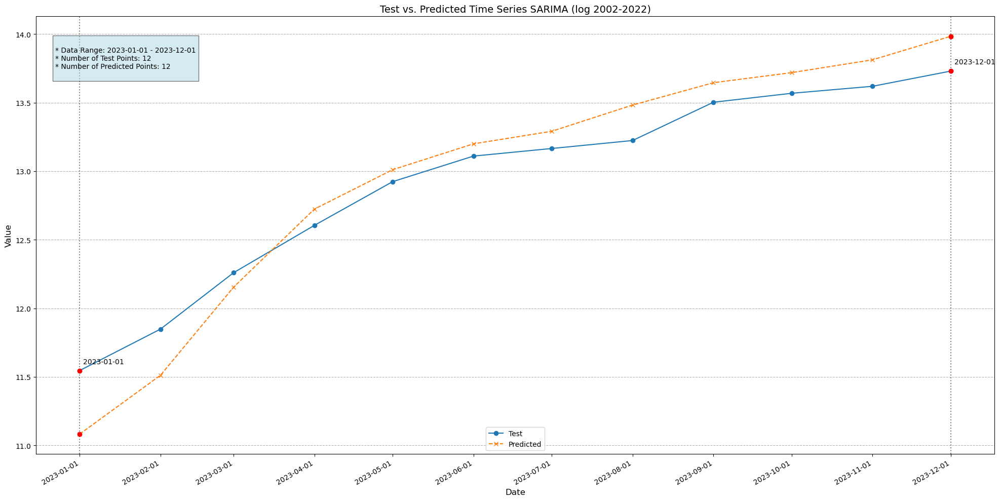

In [383]:
plt.figure(figsize=(20, 10))

# Plot the data
plt.plot(Test.index, Test, label='Test', marker='o', linestyle='-')
plt.plot(pred.index, pred, label='Predicted', marker='x', linestyle='--')

# Highlight specific points
highlight_points = [Test.index[0], Test.index[11]]  # Replace with the desired datetimes you want to mark
for point in highlight_points:
    plt.scatter(point, Test[point], color='red', zorder=5)
    plt.scatter(point, pred[point], color='red', zorder=5)
    plt.axvline(point, color='gray', linestyle=':')

# Add annotations
for point in highlight_points:
    plt.annotate(f'{point.strftime("%Y-%m-%d")}', xy=(point, Test[point]), xytext=(5, 10), textcoords='offset points')


# Customize appearance
plt.xlabel('Date', fontsize=12)
plt.ylabel('Value', fontsize=12)
plt.title('Test vs. Predicted Time Series SARIMA (log 2002-2022)', fontsize=14)
plt.legend(fontsize=10)
plt.grid(axis='y', linestyle='--')

# Format date axis
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
plt.gca().xaxis.set_major_locator(mdates.MonthLocator(interval=1))  # Adjust interval as needed
plt.gcf().autofmt_xdate()

# Add text box with loaded details
text_box = """
* Data Range: {} - {}
* Number of Test Points: {}
* Number of Predicted Points: {}
""".format(Test.index[0].strftime("%Y-%m-%d"), Test.index[-1].strftime("%Y-%m-%d"), len(Test), len(pred))  # Replace with actual details

plt.text(0.02, 0.95, text_box, transform=plt.gca().transAxes, verticalalignment='top', bbox=dict(facecolor='lightblue', alpha=0.5))

plt.tight_layout()
plt.show()


### Model Performance

In [384]:
new_row=evaluate_performance(f"SARIMA manual p,d,q selection Yearly (log 2002-2022)", Test.values, pred.values)
res= pd.concat([res,new_row],axis=0,ignore_index=True)

In [385]:
row=mean_predicted(pred)
predicted= pd.concat([predicted,row],axis=0,ignore_index=True)

## Auto SARIMA

In [386]:
import pmdarima as pm

auto_model = pm.auto_arima(
    Train, 
    start_p=0, start_q=0,  # Starting values for non-seasonal p and q
    max_p=24, max_q=7,      # Maximum values for non-seasonal p and q
    start_P=0, start_Q=0,  # Starting values for seasonal P and Q
    max_P=1, max_Q=2,      # Maximum values for seasonal P and Q
    m=12,                   # Seasonality 12 in year data
    seasonal=True,          # Explicitly indicate seasonal model
    d=None, D=None,         # Let the algorithm determine d and D
    trace=True,            # Print results of the search
    error_action='ignore',  # Ignore convergence warnings (if any)
    suppress_warnings=True, # Suppress other warnings
    stepwise=True,
    with_intercept='auto'
)

print(auto_model.summary())

Performing stepwise search to minimize aic
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=592.440, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=inf, Time=0.31 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=383.920, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=591.216, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=578.617, Time=0.05 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=-21.098, Time=0.62 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=38.841, Time=0.24 sec
 ARIMA(0,1,1)(1,0,2)[12] intercept   : AIC=inf, Time=1.74 sec
 ARIMA(0,1,1)(0,0,2)[12] intercept   : AIC=inf, Time=0.50 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=-3.202, Time=0.34 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=-18.400, Time=0.51 sec
 ARIMA(0,1,2)(1,0,1)[12] intercept   : AIC=-19.834, Time=0.55 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=-18.421, Time=0.55 sec
 ARIMA(1,1,2)(1,0,1)[12] intercept   : AIC=-17.143, Time=0.75 sec
 ARIMA(0,1,1)(1,0,1)[12]             : AIC=-24.

### Testing

In [387]:
##prediction
pred_start_date=Test.index[0]
pred_end_date=Test.index[-1]
print(pred_start_date)
print(pred_end_date)
print(pred_start_date-pred_end_date)

2023-01-01 00:00:00
2023-12-01 00:00:00
-334 days +00:00:00


In [388]:
pred=auto_model.predict(n_periods=12)
auto_pred=pred
# pred=pd.DataFrame(pred,index=Test.index)
# pred.rename(columns={f"{pred.columns[0]}":f"{Test.columns[0]}"},inplace=True)
residuals=Test-pred

In [389]:
res_auto=residuals
residuals

Month-Year
2023-01-01    0.411610
2023-02-01   -0.081787
2023-03-01   -0.177270
2023-04-01   -0.180474
2023-05-01   -0.088243
2023-06-01   -0.070973
2023-07-01   -0.142927
2023-08-01   -0.261484
2023-09-01   -0.116937
2023-10-01   -0.177268
2023-11-01   -0.238727
2023-12-01   -0.320160
dtype: float64

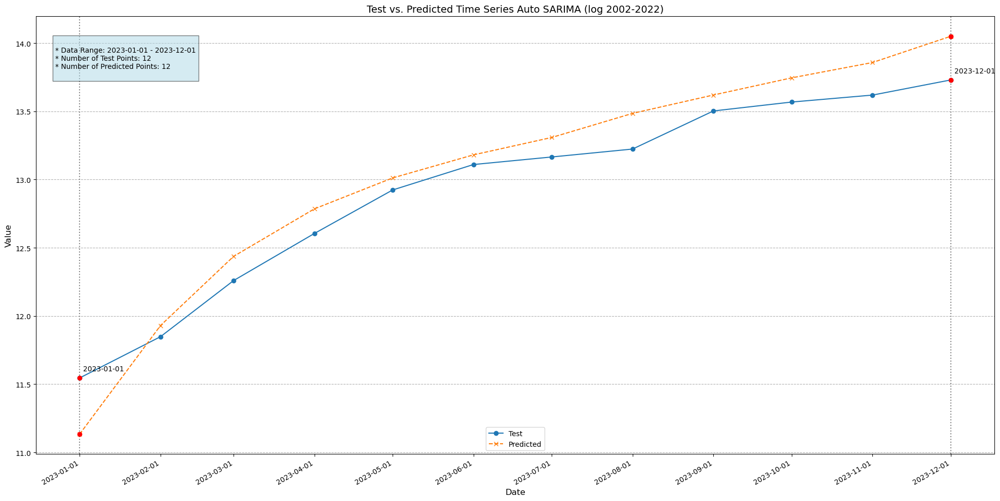

In [390]:
plt.figure(figsize=(20, 10))

# Plot the data
plt.plot(Test.index, Test, label='Test', marker='o', linestyle='-')
plt.plot(pred.index, pred, label='Predicted', marker='x', linestyle='--')

# Highlight specific points
highlight_points = [Test.index[0], Test.index[11]]  # Replace with the desired datetimes you want to mark
for point in highlight_points:
    plt.scatter(point, Test[point], color='red', zorder=5)
    plt.scatter(point, pred[point], color='red', zorder=5)
    plt.axvline(point, color='gray', linestyle=':')

# Add annotations
for point in highlight_points:
    plt.annotate(f'{point.strftime("%Y-%m-%d")}', xy=(point, Test[point]), xytext=(5, 10), textcoords='offset points')


# Customize appearance
plt.xlabel('Date', fontsize=12)
plt.ylabel('Value', fontsize=12)
plt.title('Test vs. Predicted Time Series Auto SARIMA (log 2002-2022)', fontsize=14)
plt.legend(fontsize=10)
plt.grid(axis='y', linestyle='--')

# Format date axis
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
plt.gca().xaxis.set_major_locator(mdates.MonthLocator(interval=1))  # Adjust interval as needed
plt.gcf().autofmt_xdate()

# Add text box with loaded details
text_box = """
* Data Range: {} - {}
* Number of Test Points: {}
* Number of Predicted Points: {}
""".format(Test.index[0].strftime("%Y-%m-%d"), Test.index[-1].strftime("%Y-%m-%d"), len(Test), len(pred))  # Replace with actual details

plt.text(0.02, 0.95, text_box, transform=plt.gca().transAxes, verticalalignment='top', bbox=dict(facecolor='lightblue', alpha=0.5))

plt.tight_layout()
plt.show()


### Model Performance

In [391]:
new_row=evaluate_performance(f"Auto SARIMA Yearly (log 2002-2022)", Test.values, pred.values)
res= pd.concat([res,new_row],axis=0,ignore_index=True)

In [392]:
row=mean_predicted(pred)
predicted= pd.concat([predicted,row],axis=0,ignore_index=True)

## SARIMA AutoModel predictions vs Manually selected predictions

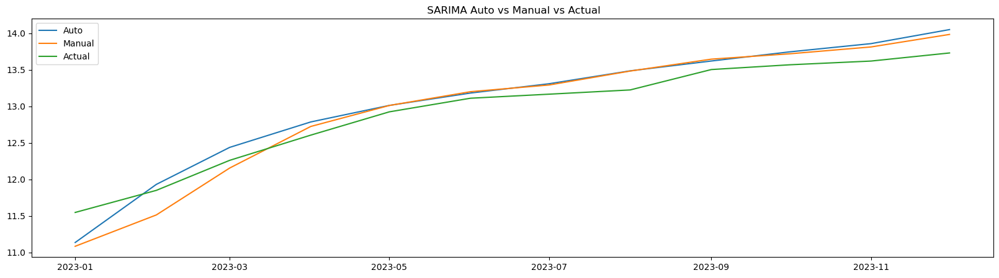

In [393]:
plt.figure(figsize=(20,5))
p1=plt.plot(auto_pred, label='Auto')
p2=plt.plot(manual_pred, label='Manual')
p3=plt.plot(Test, label='Actual')
plt.title(' SARIMA Auto vs Manual vs Actual')
plt.legend()
plt.show()

<hr style="border: 2px solid black;">

<hr style="border: 2px solid black;">

<hr style="border: 2px solid black;">

# Log Transformations using 2012-2022

## Yearly Cumulative MWh annual production with the log transformation of the series data

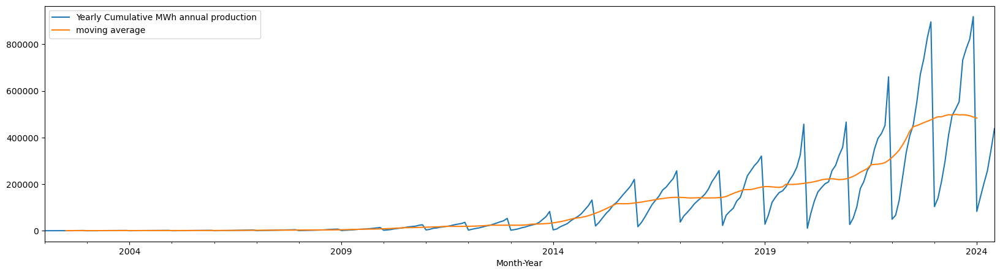

In [394]:
# Using Center parameter for the moving window
j=df_m_new.copy()
j['moving average']=df_m_new['Yearly Cumulative MWh annual production'].rolling(12,center=True).mean()
j[['Yearly Cumulative MWh annual production','moving average']].plot(figsize=plotsize)
plt.show()


### Differencing recursively to a Stationary series

In [395]:

k=df_m_new.copy()
Difference=adf_test(np.log(df_m_new[(df_m_new['Yearly Cumulative MWh annual production'].index.year<2023) & (df_m_new['Yearly Cumulative MWh annual production'].index.year>2012)]['Yearly Cumulative MWh annual production']))
print(f"\n{Difference= }")

ADF Statistics: -2.477058676727139
p- value: 0.12115643897707273
Fail to reject null hypothesis, time series has a unit root, indicating it is non-stationary
 
ADF Statistics: -2.334808367370864
p- value: 0.16098715658817225
Fail to reject null hypothesis, time series has a unit root, indicating it is non-stationary
 
ADF Statistics: -9.944821732242596
p- value: 2.6063746048542698e-17
rejecting the null hypothesis. Data has no unit root and is stationary

Difference= 2


**The differencing value is 1 because the data is stationary after shifting once**

## Decompostion

### Additive

<Figure size 2000x2000 with 0 Axes>

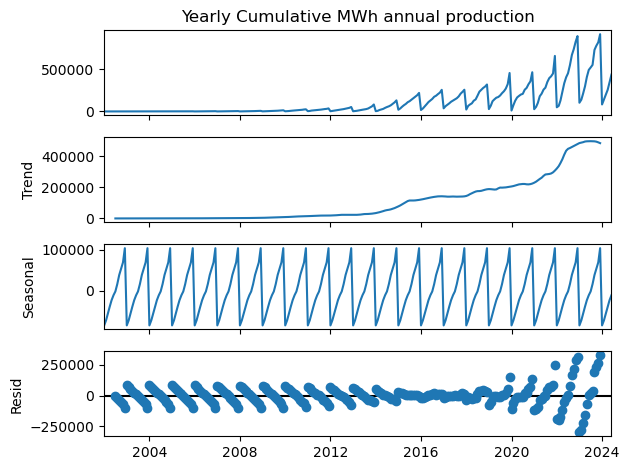

In [396]:

plt.figure(figsize=(20,20))
decompose=seasonal_decompose(df_m_new['Yearly Cumulative MWh annual production'],model='add')
decompose.plot()
plt.show()
plt.close()

**Issue with multiplicative model because of the scaling done which creates some 0 values**

Overcoming error thrown with zero by adding a finite value of 0.00000001

### Multiplicative

<Figure size 2000x2000 with 0 Axes>

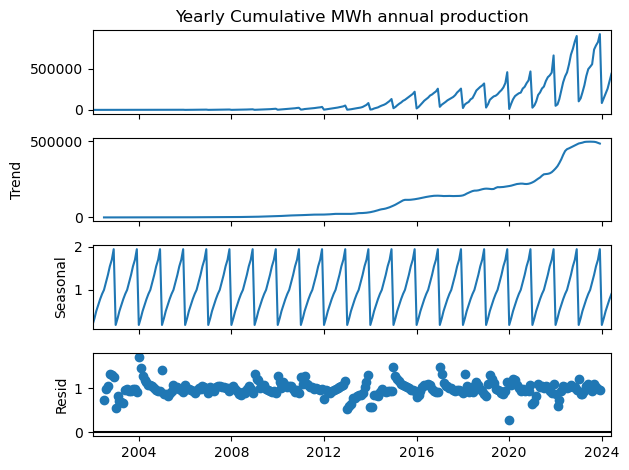

In [397]:
## There were missing values before 2015; threw error when tried decomposing using multiplicative model

plt.figure(figsize=(20,20))
decompose=seasonal_decompose(df_m_new['Yearly Cumulative MWh annual production']+0.000000001,model='mul')
decompose.plot()
plt.show()
plt.close()

## Time Series Visualizations

- __[plot_acf](https://www.statsmodels.org/stable/generated/statsmodels.graphics.tsaplots.plot_acf.html#statsmodels.graphics.tsaplots.plot_acf)__: Plot of the Autocorrelation Function
- __[plot_pacf](https://www.statsmodels.org/stable/generated/statsmodels.graphics.tsaplots.plot_pacf.html#statsmodels.graphics.tsaplots.plot_pacf)__: Plot of the Partial Autocorrelation Function
- __[month_plot](https://www.statsmodels.org/stable/generated/statsmodels.graphics.tsaplots.month_plot.html#statsmodels.graphics.tsaplots.month_plot)__: Seasonal Plot for Monthly Data
- __[quarter_plot](https://www.statsmodels.org/stable/generated/statsmodels.graphics.tsaplots.quarter_plot.html#statsmodels.graphics.tsaplots.quarter_plot)__: Seasonal Plot for Quarterly Data




**Since first differencing is required to achieve stationarity using the Differenced data for pacf and acf graphs**

In [398]:
k=np.log(df_m_new[(df_m_new['Yearly Cumulative MWh annual production'].index.year<2023) & (df_m_new['Yearly Cumulative MWh annual production'].index.year>2012)]['Yearly Cumulative MWh annual production'])

k-=k.shift(1)
k-=k.shift(1)

k.head()
k.dropna(inplace=True)

## PACF and ACF

Autocorrelation Plots


<Figure size 1000x1000 with 0 Axes>

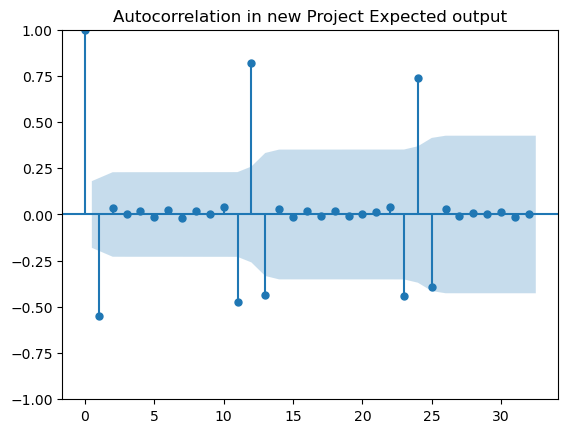

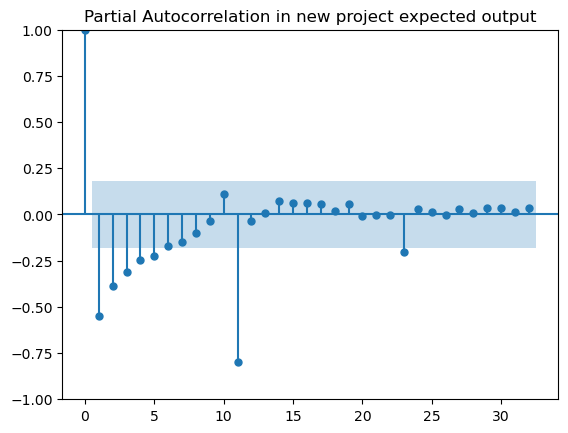

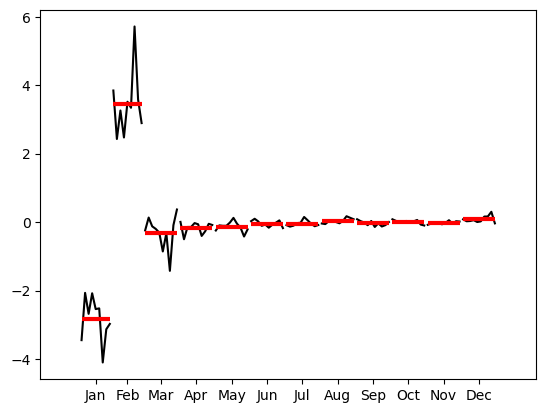

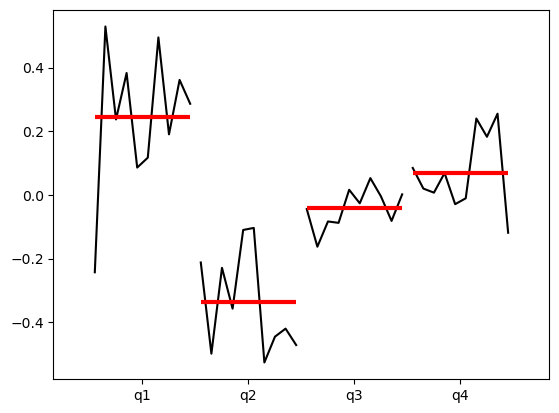

In [399]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf, month_plot, quarter_plot

print('Autocorrelation Plots')
# Autocorrelation and Partial Autocorrelation Functions for weekly data
#plot_acf
plt.figure(figsize=(10,10))
acf_plot = plot_acf(k,lags=32, title='Autocorrelation in new Project Expected output')

pacf_plot = plot_pacf(k,lags=32, title='Partial Autocorrelation in new project expected output')

month= month_plot(k)  #This is done using all the continuous dates from 2000-12 to last project completed in 2024
quarter= quarter_plot(k.resample('Q').sum())


<Axes: xlabel='Month-Year'>

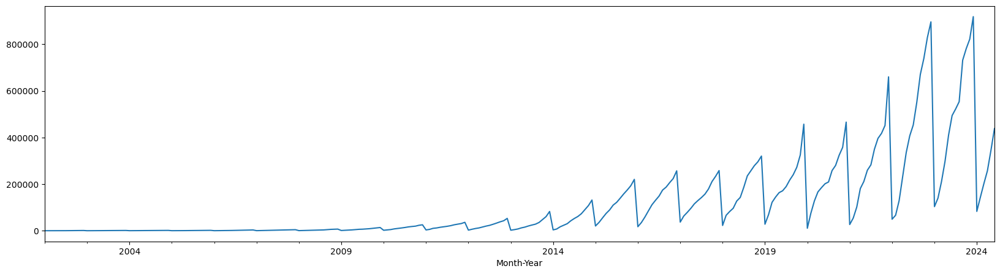

In [400]:
df_m_new['Yearly Cumulative MWh annual production'].plot(figsize=plotsize)

In [401]:
Train=np.log(df_m_new[(df_m_new['Yearly Cumulative MWh annual production'].index.year<2023) & (df_m_new['Yearly Cumulative MWh annual production'].index.year>2012)]['Yearly Cumulative MWh annual production'])
Train.shape

(120,)

<Axes: xlabel='Month-Year'>

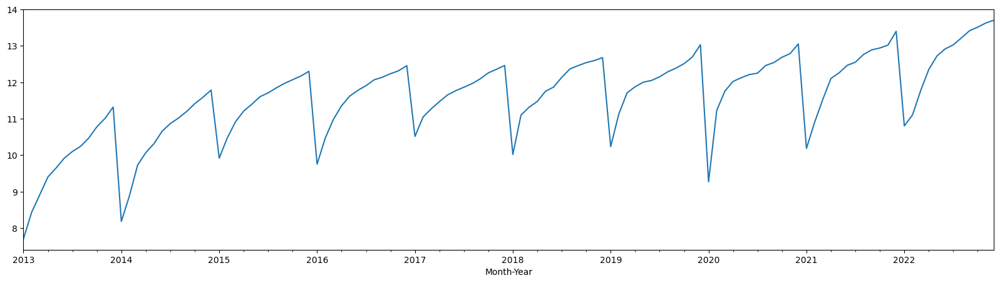

In [402]:
Train.plot(figsize=plotsize)

<Axes: xlabel='Month-Year'>

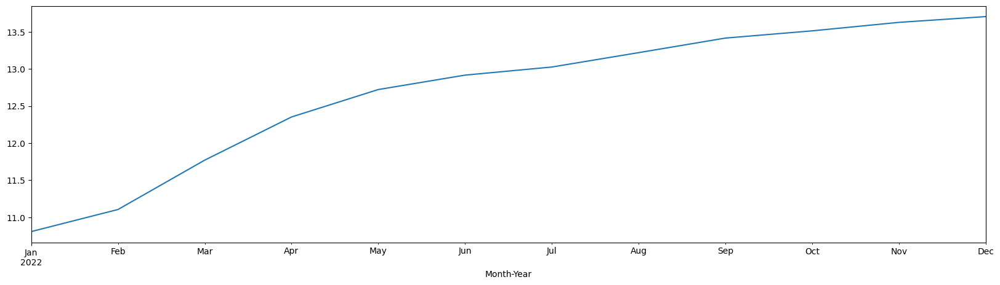

In [403]:
Train[Train.index.year==2022].plot(figsize=plotsize)

In [404]:
Test=np.log(df_m_new[df_m_new['Yearly Cumulative MWh annual production'].index.year==2023]['Yearly Cumulative MWh annual production'])
Test.shape

(12,)

<Axes: xlabel='Month-Year'>

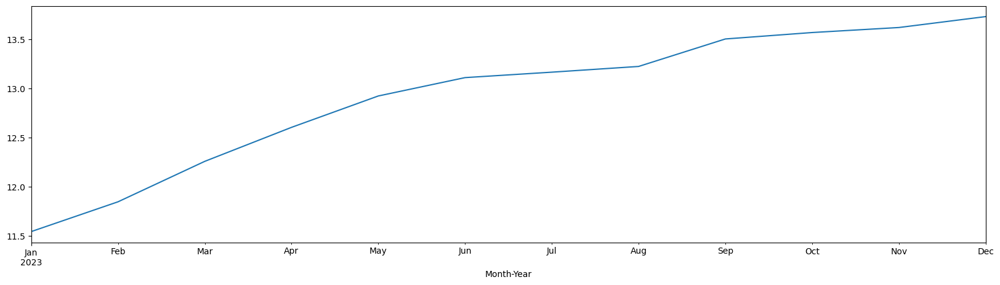

In [405]:
Test.plot(figsize=plotsize)

In [406]:
Train.shape

(120,)

In [407]:
Test.shape

(12,)

## ARIMA model

In [408]:
from statsmodels.tsa.arima.model import ARIMA,ARIMAResults
model_ARIMA=ARIMA((Train),order=([1,2,3,4,11],Difference,[1,12])) # 
model_Arima_fit=model_ARIMA.fit()
model_Arima_fit.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                          SARIMAX Results                                          
===================================================================================================
Dep. Variable:     Yearly Cumulative MWh annual production   No. Observations:                  120
Model:                 ARIMA([1, 2, 3, 4, 11], 2, [1, 12])   Log Likelihood                -107.734
Date:                                     Wed, 17 Jul 2024   AIC                            231.469
Time:                                             16:36:54   BIC                            253.634
Sample:                                         01-01-2013   HQIC                           240.469
                                              - 12-01-2022                                         
Covariance Type:                                       opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.7362      0.092     -8.008      0.000      -0.916      -0.556
ar.L2         -0.5901      0.115     -5.134      0.000      -0.815      -0.365
ar.L3         -0.4036      0.129     -3.134      0.002      -0.656      -0.151
ar.L4         -0.2186      0.109     -1.999      0.046      -0.433      -0.004
ar.L11        -0.3010      0.080     -3.774      0.000      -0.457      -0.145
ma.L1         -0.3774      0.132     -2.866      0.004      -0.636      -0.119
ma.L12         0.6014      0.156      3.850      0.000       0.295       0.908
sigma2         0.3214      0.039      8.213      0.000       0.245       0.398
===================================================================================
Ljung-Box (L1) (Q):                   0.29   Jarque-Bera (JB):               242.17
Prob(Q):                              0.59   Prob(JB):                         0.00
Heteroskedasticity (H):               1.10   Skew:                            -1.85
Prob(H) (two-sided):                  0.78   Kurtosis:                         8.96
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

<div class='alert alert-block alert-success'><b>Model Fit and Significance:

- Log-Likelihood: The log-likelihood value (-107.734) suggests a reasonable model fit. 
- AIC, BIC, HQIC: These information criteria (AIC: 231.469, BIC: 253.634, HQIC: 240.469) 
- Coefficients: All AR and MA coefficients are statistically significant (p-values < 0.05), suggesting they contribute to the model's explanatory power.

Diagnostic Tests:

Ljung-Box (Q): The Q-statistic is very low (0.29) with a high p-value (0.59), indicating no significant autocorrelation in the residuals. It suggests the model is capturing the linear dependence in the data.

Jarque-Bera (JB): The high JB statistic and low p-value (0.00) indicate the residuals are not normally distributed. This is common in real-world time series and might not be a major concern unless the deviations are extreme.

Heteroskedasticity (H): The H-statistic (1.10) with a p-value of 0.29 suggests there might be mild heteroskedasticity (unequal variance) in the residuals. 

Skewness and Kurtosis: The negative skew (-1.85) indicates a longer left tail in the distribution of residuals</b></div>

### Testing

In [409]:
##prediction
pred_start_date=Test.index[0]
pred_end_date=Test.index[-1]
print(pred_start_date)
print(pred_end_date)

2023-01-01 00:00:00
2023-12-01 00:00:00


In [410]:
Train.head()

Month-Year
2013-01-01   7.708517
2013-02-01   8.434178
2013-03-01   8.916964
2013-04-01   9.405658
2013-05-01   9.648720
Name: Yearly Cumulative MWh annual production, dtype: float64

In [411]:
Test.head()

Month-Year
2023-01-01   11.546031
2023-02-01   11.848474
2023-03-01   12.259525
2023-04-01   12.604994
2023-05-01   12.923750
Name: Yearly Cumulative MWh annual production, dtype: float64

In [412]:
pred=model_Arima_fit.predict(start=pred_start_date,end=pred_end_date)
# pred=pd.DataFrame(pred,index=pred.index)
# pred.rename(columns={f"{pred.columns[0]}":f"{Test.columns[0]}"},inplace=True)
residuals=Test-pred

In [413]:
residuals

Month-Year
2023-01-01   -0.855476
2023-02-01   -0.352666
2023-03-01   -0.199970
2023-04-01   -0.046166
2023-05-01    0.116219
2023-06-01    0.261629
2023-07-01    0.305016
2023-08-01    0.285557
2023-09-01    0.448498
2023-10-01    0.435614
2023-11-01    0.380413
2023-12-01    0.567400
dtype: float64

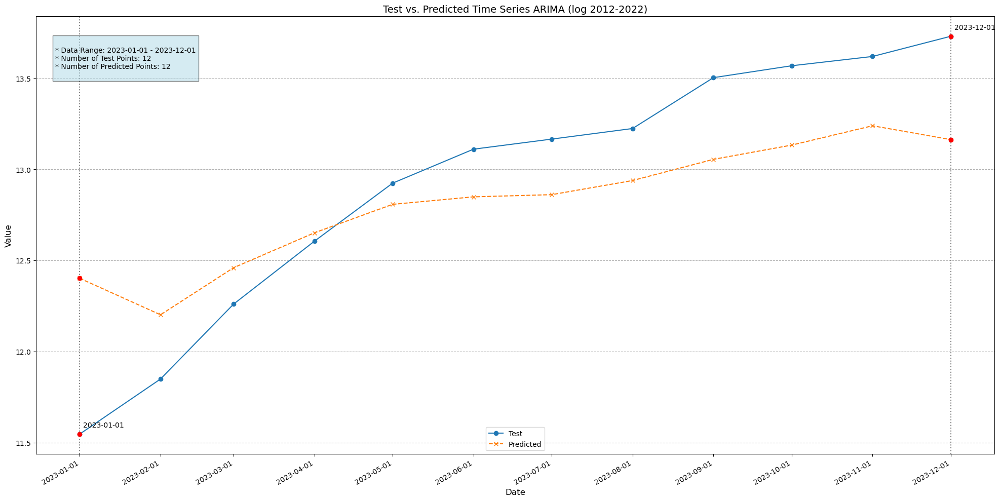

In [414]:
plt.figure(figsize=(20, 10))

# Plot the data
plt.plot(Test.index, Test, label='Test', marker='o', linestyle='-')
plt.plot(pred.index, pred, label='Predicted', marker='x', linestyle='--')

# Highlight specific points
highlight_points = [Test.index[0], Test.index[11]]  # Replace with the desired datetimes you want to mark
for point in highlight_points:
    plt.scatter(point, Test[point], color='red', zorder=5)
    plt.scatter(point, pred[point], color='red', zorder=5)
    plt.axvline(point, color='gray', linestyle=':')

# Add annotations
for point in highlight_points:
    plt.annotate(f'{point.strftime("%Y-%m-%d")}', xy=(point, Test[point]), xytext=(5, 10), textcoords='offset points')


# Customize appearance
plt.xlabel('Date', fontsize=12)
plt.ylabel('Value', fontsize=12)
plt.title('Test vs. Predicted Time Series ARIMA (log 2012-2022)', fontsize=14)
plt.legend(fontsize=10)
plt.grid(axis='y', linestyle='--')

# Format date axis
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
plt.gca().xaxis.set_major_locator(mdates.MonthLocator(interval=1))  # Adjust interval as needed
plt.gcf().autofmt_xdate()

# Add text box with loaded details
text_box = """
* Data Range: {} - {}
* Number of Test Points: {}
* Number of Predicted Points: {}
""".format(Test.index[0].strftime("%Y-%m-%d"), Test.index[-1].strftime("%Y-%m-%d"), len(Test), len(pred))  # Replace with actual details

plt.text(0.02, 0.95, text_box, transform=plt.gca().transAxes, verticalalignment='top', bbox=dict(facecolor='lightblue', alpha=0.5))

plt.tight_layout()
plt.show()


### Model Performance

In [415]:
new_row=evaluate_performance(f"ARIMA manual p,d,q selection Yearly (log 2012-2022)", Test.values, pred.values)
res= pd.concat([res,new_row],axis=0,ignore_index=True)

In [416]:
row=mean_predicted(pred)
predicted= pd.concat([predicted,row],axis=0,ignore_index=True)

## SARIMA model

In [417]:
k=np.log(df_m_new['Yearly Cumulative MWh annual production'].copy())

seasonality_diff,stationary_series=adf_test_season(k,12)
d=seasonality_diff-1
D=seasonality_diff-d
print(f"{D=} & {d=}")

ADF Statistics: -3.3813808233561855
p- value: 0.01161021269197879
rejecting the null hypothesis. Data has no unit root and is stationary
D=1 & d=0


**p-value is <0.05 indicating stationarity**

Plots after seasonality


<Figure size 1000x1000 with 0 Axes>

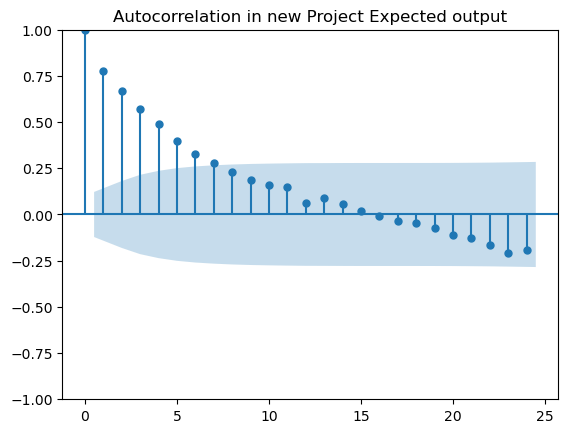

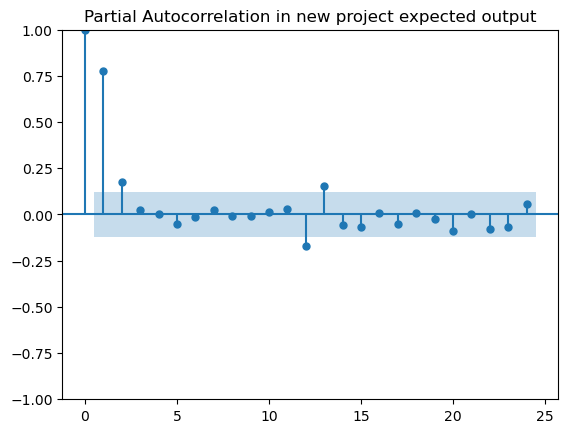

In [418]:
print('Plots after seasonality')

plt.figure(figsize=(10,10))
acf_plot = plot_acf(stationary_series,lags=24, title='Autocorrelation in new Project Expected output')

pacf_plot = plot_pacf(stationary_series,lags=24, title='Partial Autocorrelation in new project expected output')



In [419]:
model=sm.tsa.statespace.SARIMAX(Train,order=([1],0,[1]),seasonal_order=([1],1,0,12)) 
results=model.fit()

<IPython.core.display.Javascript object>

In [420]:
print(results.summary())

                                          SARIMAX Results                                          
Dep. Variable:     Yearly Cumulative MWh annual production   No. Observations:                  120
Model:                     SARIMAX(1, 0, 1)x(1, 1, [], 12)   Log Likelihood                  -0.837
Date:                                     Wed, 17 Jul 2024   AIC                              9.674
Time:                                             16:36:55   BIC                             20.403
Sample:                                         01-01-2013   HQIC                            14.024
                                              - 12-01-2022                                         
Covariance Type:                                       opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.9919      0.013     78.05

<div class='alert alert-block alert-success'><b>Analysis:

- Significant Coefficients: All estimated coefficients (AR, MA, and seasonal AR) are statistically significant (p-values < 0.05), meaning they likely have a real effect on the time series.
- No Autocorrelation: The Ljung-Box test for autocorrelation in the residuals has a high p-value (0.53), suggesting the model effectively captures the linear dependencies in the data.</b></div>

### Testing

In [421]:
##prediction
pred_start_date=Test.index[0]
pred_end_date=Test.index[-1]
print(pred_start_date)
print(pred_end_date)

2023-01-01 00:00:00
2023-12-01 00:00:00


In [422]:
pred=results.predict(start=pred_start_date,end=pred_end_date)
manual_pred=pred
# pred=pd.DataFrame(pred,index=pred.index)
# pred.rename(columns={f"{pred.columns[0]}":f"{Test.columns[0]}"},inplace=True)
residuals=Test-pred

In [423]:
res_manual=residuals
residuals

Month-Year
2023-01-01    0.448211
2023-02-01    0.269065
2023-03-01    0.036770
2023-04-01   -0.192526
2023-05-01   -0.142657
2023-06-01   -0.151381
2023-07-01   -0.190157
2023-08-01   -0.330072
2023-09-01   -0.210602
2023-10-01   -0.218475
2023-11-01   -0.261454
2023-12-01   -0.359753
dtype: float64

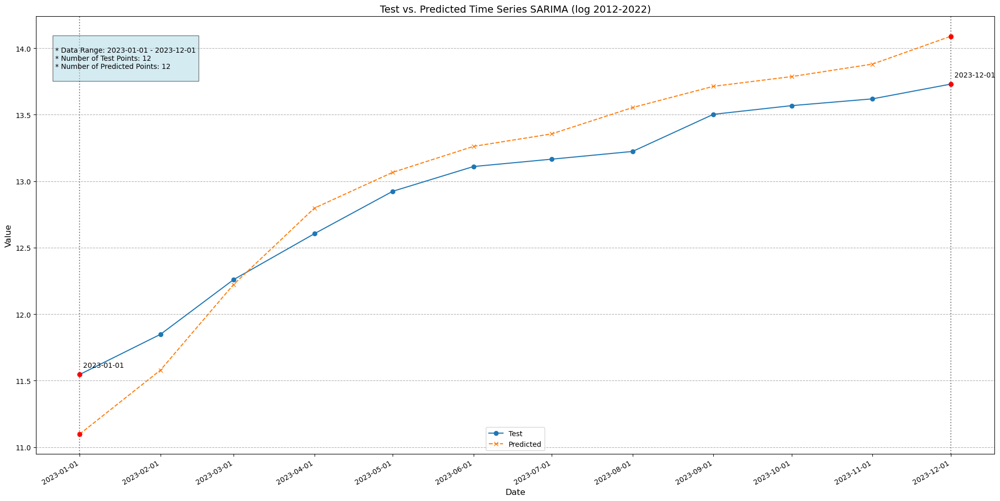

In [424]:
plt.figure(figsize=(20, 10))

# Plot the data
plt.plot(Test.index, Test, label='Test', marker='o', linestyle='-')
plt.plot(pred.index, pred, label='Predicted', marker='x', linestyle='--')

# Highlight specific points
highlight_points = [Test.index[0], Test.index[11]]  # Replace with the desired datetimes you want to mark
for point in highlight_points:
    plt.scatter(point, Test[point], color='red', zorder=5)
    plt.scatter(point, pred[point], color='red', zorder=5)
    plt.axvline(point, color='gray', linestyle=':')

# Add annotations
for point in highlight_points:
    plt.annotate(f'{point.strftime("%Y-%m-%d")}', xy=(point, Test[point]), xytext=(5, 10), textcoords='offset points')


# Customize appearance
plt.xlabel('Date', fontsize=12)
plt.ylabel('Value', fontsize=12)
plt.title('Test vs. Predicted Time Series SARIMA (log 2012-2022)', fontsize=14)
plt.legend(fontsize=10)
plt.grid(axis='y', linestyle='--')

# Format date axis
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
plt.gca().xaxis.set_major_locator(mdates.MonthLocator(interval=1))  # Adjust interval as needed
plt.gcf().autofmt_xdate()

# Add text box with loaded details
text_box = """
* Data Range: {} - {}
* Number of Test Points: {}
* Number of Predicted Points: {}
""".format(Test.index[0].strftime("%Y-%m-%d"), Test.index[-1].strftime("%Y-%m-%d"), len(Test), len(pred))  # Replace with actual details

plt.text(0.02, 0.95, text_box, transform=plt.gca().transAxes, verticalalignment='top', bbox=dict(facecolor='lightblue', alpha=0.5))

plt.tight_layout()
plt.show()


### Model Performance

In [425]:
new_row=evaluate_performance(f"SARIMA manual p,d,q selection Yearly (log 2012-2022)", Test.values, pred.values)
res= pd.concat([res,new_row],axis=0,ignore_index=True)

In [426]:
row=mean_predicted(pred)
predicted= pd.concat([predicted,row],axis=0,ignore_index=True)

## Auto SARIMA

In [427]:
import pmdarima as pm

auto_model = pm.auto_arima(
    Train, 
    start_p=0, start_q=0,  # Starting values for non-seasonal p and q
    max_p=24, max_q=7,      # Maximum values for non-seasonal p and q
    start_P=0, start_Q=0,  # Starting values for seasonal P and Q
    max_P=1, max_Q=2,      # Maximum values for seasonal P and Q
    m=12,                   # Seasonality 12 in year data
    seasonal=True,          # Explicitly indicate seasonal model
    d=None, D=None,         # Let the algorithm determine d and D
    trace=True,            # Print results of the search
    error_action='ignore',  # Ignore convergence warnings (if any)
    suppress_warnings=True, # Suppress other warnings
    stepwise=True,
    with_intercept='auto'
)

print(auto_model.summary())

Performing stepwise search to minimize aic
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=293.990, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=inf, Time=0.20 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=210.934, Time=0.10 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=292.441, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=285.949, Time=0.03 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=34.806, Time=0.40 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=58.381, Time=0.17 sec
 ARIMA(0,1,1)(1,0,2)[12] intercept   : AIC=36.147, Time=0.83 sec
 ARIMA(0,1,1)(0,0,2)[12] intercept   : AIC=inf, Time=0.59 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.38 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=40.736, Time=0.42 sec
 ARIMA(0,1,2)(1,0,1)[12] intercept   : AIC=38.814, Time=0.38 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=43.083, Time=0.40 sec
 ARIMA(1,1,2)(1,0,1)[12] intercept   : AIC=42.107, Time=0.44 sec
 ARIMA(0,1,1)(1,0,1)[12]             : AIC=inf, Time

### Testing

In [428]:
##prediction
pred_start_date=Test.index[0]
pred_end_date=Test.index[-1]
print(pred_start_date)
print(pred_end_date)
print(pred_start_date-pred_end_date)

2023-01-01 00:00:00
2023-12-01 00:00:00
-334 days +00:00:00


In [429]:
pred=auto_model.predict(n_periods=12)
auto_pred=pred
# pred=pd.DataFrame(pred,index=Test.index)
# pred.rename(columns={f"{pred.columns[0]}":f"{Test.columns[0]}"},inplace=True)
residuals=Test-pred

In [430]:
res_auto=residuals
residuals

Month-Year
2023-01-01    0.402339
2023-02-01   -0.114529
2023-03-01   -0.222001
2023-04-01   -0.234651
2023-05-01   -0.131372
2023-06-01   -0.110990
2023-07-01   -0.179298
2023-08-01   -0.293395
2023-09-01   -0.145331
2023-10-01   -0.207539
2023-11-01   -0.272769
2023-12-01   -0.366130
dtype: float64

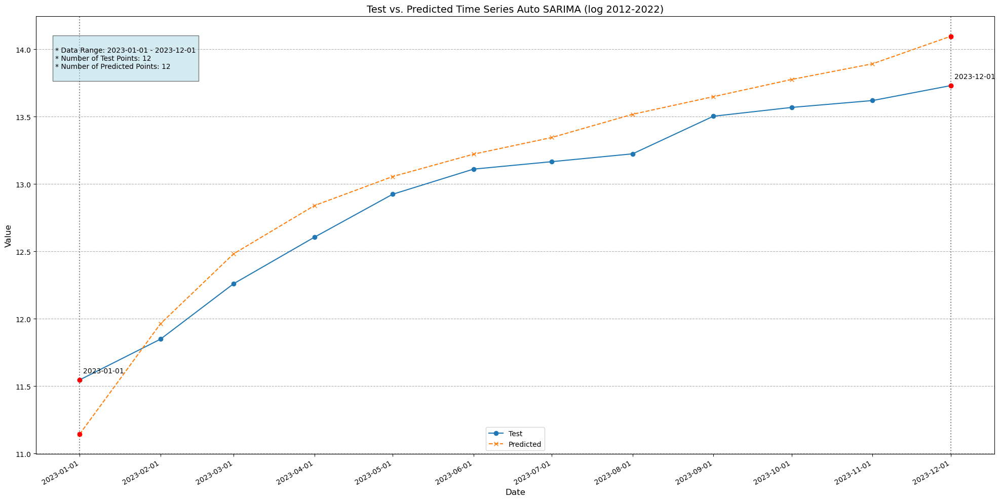

In [431]:
plt.figure(figsize=(20, 10))

# Plot the data
plt.plot(Test.index, Test, label='Test', marker='o', linestyle='-')
plt.plot(pred.index, pred, label='Predicted', marker='x', linestyle='--')

# Highlight specific points
highlight_points = [Test.index[0], Test.index[11]]  # Replace with the desired datetimes you want to mark
for point in highlight_points:
    plt.scatter(point, Test[point], color='red', zorder=5)
    plt.scatter(point, pred[point], color='red', zorder=5)
    plt.axvline(point, color='gray', linestyle=':')

# Add annotations
for point in highlight_points:
    plt.annotate(f'{point.strftime("%Y-%m-%d")}', xy=(point, Test[point]), xytext=(5, 10), textcoords='offset points')


# Customize appearance
plt.xlabel('Date', fontsize=12)
plt.ylabel('Value', fontsize=12)
plt.title('Test vs. Predicted Time Series Auto SARIMA (log 2012-2022)', fontsize=14)
plt.legend(fontsize=10)
plt.grid(axis='y', linestyle='--')

# Format date axis
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
plt.gca().xaxis.set_major_locator(mdates.MonthLocator(interval=1))  # Adjust interval as needed
plt.gcf().autofmt_xdate()

# Add text box with loaded details
text_box = """
* Data Range: {} - {}
* Number of Test Points: {}
* Number of Predicted Points: {}
""".format(Test.index[0].strftime("%Y-%m-%d"), Test.index[-1].strftime("%Y-%m-%d"), len(Test), len(pred))  # Replace with actual details

plt.text(0.02, 0.95, text_box, transform=plt.gca().transAxes, verticalalignment='top', bbox=dict(facecolor='lightblue', alpha=0.5))

plt.tight_layout()
plt.show()


### Model Performance

In [432]:
new_row=evaluate_performance(f"Auto SARIMA Yearly (log 2012-2022)", Test.values, pred.values)
res= pd.concat([res,new_row],axis=0,ignore_index=True)

In [433]:
row=mean_predicted(pred)
predicted= pd.concat([predicted,row],axis=0,ignore_index=True)

## AutoModel predictions vs Manually selected predictions

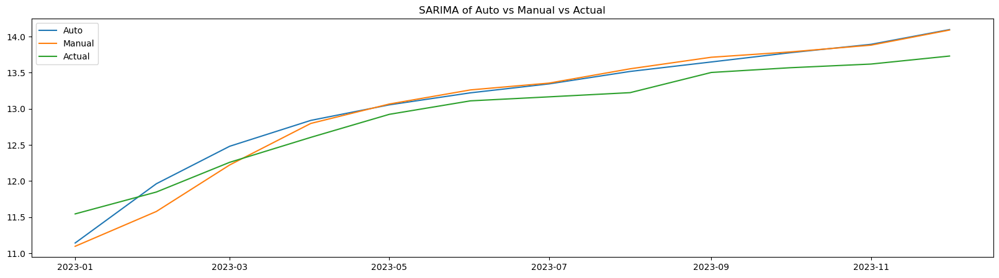

In [434]:
plt.figure(figsize=(20,5))
p1=plt.plot(auto_pred, label='Auto')
p2=plt.plot(manual_pred, label='Manual')
p3=plt.plot(Test, label='Actual')
plt.title("SARIMA of Auto vs Manual vs Actual")
plt.legend()
plt.show()

## LSTM

In [435]:
lstm_year=np.log(df_m_new[df_m_new.index.year<2024]['Yearly Cumulative MWh annual production'].copy())

In [436]:
trainData=lstm_year[:-12]
trainData.shape

(252,)

In [437]:
X_train= []
y_train= []
window=12
for i in range(window,len(trainData)):
    X_train.append(trainData[i-window:i])
    y_train.append(trainData[i])

X_train,y_train= np.array(X_train),np.array(y_train)
X_train= np.reshape(X_train,(X_train.shape[0],X_train.shape[1],1))
X_train.shape

(240, 12, 1)

In [438]:
y_test=trainData[-12:]
# start=trainData[-12:]
# start

### Creating LSTM model

In [439]:
model= Sequential()

model.add(LSTM(units=100, return_sequences=True, input_shape= (X_train.shape[1],1)))
model.add(Dropout(0.25))

model.add(LSTM(units=100, return_sequences=True))
model.add(Dropout(0.15))

model.add(LSTM(units=100, return_sequences=True))
model.add(Dropout(0.25))

model.add(LSTM(units=100, return_sequences=True))
model.add(Dropout(0.2))

model.add(LSTM(units=100, return_sequences=False))
model.add(Dropout(0.2))

model.add(Dense(units = 1))
model.compile(optimizer='adam',loss="mean_squared_error")

In [440]:
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━┓
┃ Layer (type)                       ┃ Output Shape                  ┃     Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━┩
│ lstm (LSTM)                        │ (None, 12, 100)               │      40,800 │
├────────────────────────────────────┼───────────────────────────────┼─────────────┤
│ dropout (Dropout)                  │ (None, 12, 100)               │           0 │
├────────────────────────────────────┼───────────────────────────────┼─────────────┤
│ lstm_1 (LSTM)                      │ (None, 12, 100)               │      80,400 │
├────────────────────────────────────┼───────────────────────────────┼─────────────┤
│ dropout_1 (Dropout)                │ (None, 12, 100)               │           0 │
├────────────────────────────────────┼───────────────────────────────┼─────────────┤
│ lstm_2 (LSTM)                      │ (None, 12, 100)               │      80,400 │
├────────────────────────────────────┼───────────────────────────────┼─────────────┤
│ dropout_2 (Dropout)                │ (None, 12, 100)               │           0 │
├────────────────────────────────────┼───────────────────────────────┼─────────────┤
│ lstm_3 (LSTM)                      │ (None, 12, 100)               │      80,400 │
├────────────────────────────────────┼───────────────────────────────┼─────────────┤
│ dropout_3 (Dropout)                │ (None, 12, 100)               │           0 │
├────────────────────────────────────┼───────────────────────────────┼─────────────┤
│ lstm_4 (LSTM)                      │ (None, 100)                   │      80,400 │
├────────────────────────────────────┼───────────────────────────────┼─────────────┤
│ dropout_4 (Dropout)                │ (None, 100)                   │           0 │
├────────────────────────────────────┼───────────────────────────────┼─────────────┤
│ dense (Dense)                      │ (None, 1)                     │         101 │
└────────────────────────────────────┴───────────────────────────────┴─────────────┘

 Total params: 362,501 (1.38 MB)

 Trainable params: 362,501 (1.38 MB)

 Non-trainable params: 0 (0.00 B)

### Fitting model

In [441]:
import tensorflow
earlystopping= tensorflow.keras.callbacks.EarlyStopping(
    monitor="val_loss",
    min_delta=0.01,
    patience=20,
    verbose=0,
    mode="auto",
    baseline=None,
    restore_best_weights=False,
    
)

In [442]:
hist= model.fit(X_train,y_train,epochs=200,batch_size=24,callbacks=[earlystopping])

Epoch 1/200
10/10 ━━━━━━━━━━━━━━━━━━━━ 6s 16ms/step - loss: 79.5845
Epoch 2/200
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 6.8326
Epoch 3/200
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 6.4827
Epoch 4/200
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 5.9266
Epoch 5/200
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 6.1922
Epoch 6/200
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 5.5970
Epoch 7/200
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 6.0988
Epoch 8/200
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 5.5220
Epoch 9/200
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 5.8268
Epoch 10/200
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 6.2197
Epoch 11/200
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 5.2174
Epoch 12/200
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 5.9876
Epoch 13/200
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 5.6603
Epoch 14/200
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 5.6574
Epoch 15/200
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - l

<Axes: >

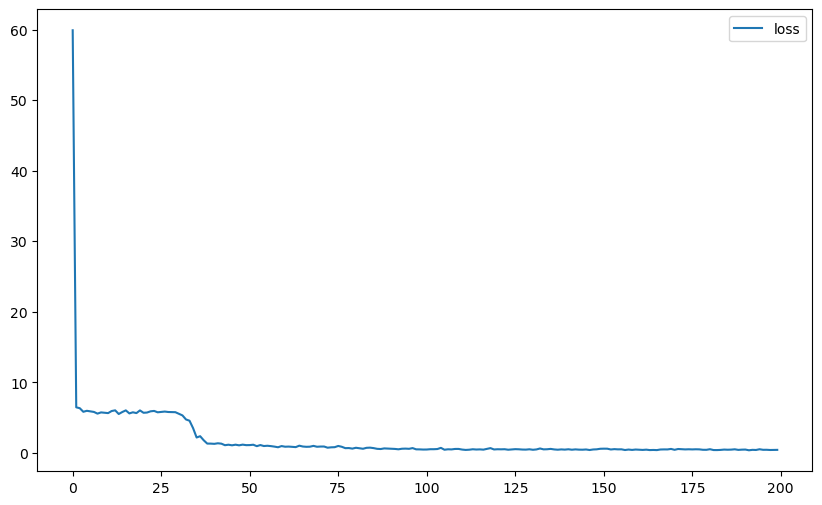

In [443]:
losses_df1 = pd.DataFrame(model.history.history)

losses_df1.plot(figsize = (10,6))

### Testing

In [444]:
testData=(lstm_year.iloc[-24:])
X_test= []
y_test= []
length= len(testData)
timestep= 12
for i in range(-24,-12):
    X_test.append(testData[i:i+12])
    y_test.append(testData[i+12])



X_test,y_test= np.array(X_test),np.array(y_test)
X_test= np.reshape(X_test,(X_test.shape[0],X_test.shape[1],1))
X_test.shape


(12, 12, 1)

In [445]:
pred=model.predict(X_test)

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 988ms/step


In [446]:
pred.shape

(12, 1)

In [447]:
index=lstm_year.iloc[-12:].index

pred=pd.DataFrame(pred,index=index,columns=['Predicted'])
pred

,Predicted
Month-Year,
2023-01-01,10.958817
2023-02-01,11.251248
2023-03-01,11.939959
2023-04-01,12.524820
2023-05-01,12.987533
2023-06-01,13.089071
2023-07-01,13.106972
2023-08-01,13.122033
2023-09-01,13.128880


In [448]:
testData=lstm_year[-12:]
testData=pd.DataFrame(testData.values,index=index,columns=['Test'])
testData

,Test
Month-Year,
2023-01-01,11.546031
2023-02-01,11.848474
2023-03-01,12.259525
2023-04-01,12.604994
2023-05-01,12.923750
2023-06-01,13.110263
2023-07-01,13.165639
2023-08-01,13.223784
2023-09-01,13.502966


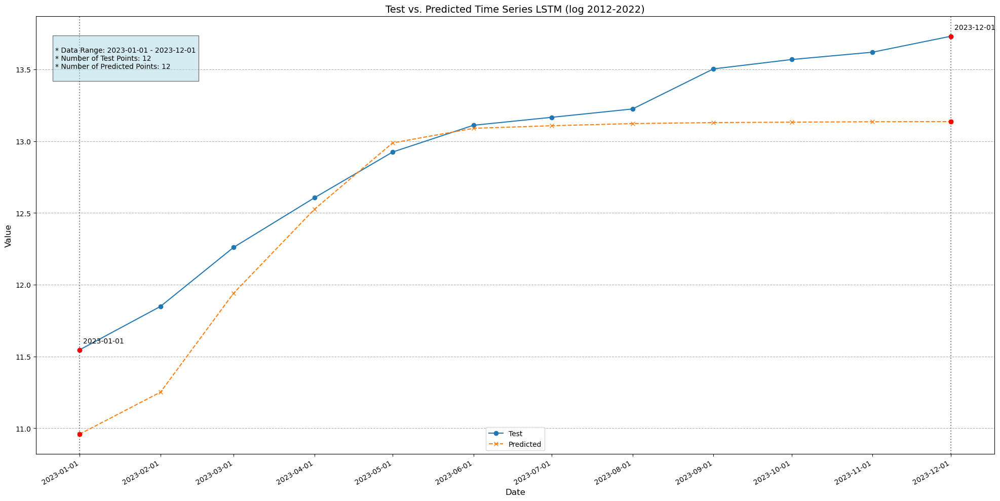

In [449]:
plt.figure(figsize=(20, 10))

# Plot the data, ensure using .loc for index-based access
plt.plot(testData.index, testData['Test'], label='Test', marker='o', linestyle='-')
plt.plot(pred.index, pred, label='Predicted', marker='x', linestyle='--')

# Highlight specific points (with error handling)
for point in highlight_points:
    if point in testData.index and point in pred.index:
        plt.scatter(point, testData.loc[point, 'Test'], color='red', zorder=5)
        plt.scatter(point, pred.loc[point], color='red', zorder=5)
        plt.axvline(point, color='gray', linestyle=':')
    else:
        print(f"Warning: Timestamp '{point}' not found in one or both datasets. Skipping highlight.")
    
# Add annotations (access by .loc)
for point in highlight_points:
    if point in testData.index:
        plt.annotate(f'{point.strftime("%Y-%m-%d")}', xy=(point, testData.loc[point, 'Test']), xytext=(5, 10), textcoords='offset points')

# Customize appearance
plt.xlabel('Date', fontsize=12)
plt.ylabel('Value', fontsize=12)
plt.title('Test vs. Predicted Time Series LSTM (log 2012-2022)', fontsize=14)
plt.legend(fontsize=10)
plt.grid(axis='y', linestyle='--')

# Format date axis
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
plt.gca().xaxis.set_major_locator(mdates.MonthLocator(interval=1))  # Adjust interval as needed
plt.gcf().autofmt_xdate()

# Add text box with loaded details
text_box = """
* Data Range: {} - {}
* Number of Test Points: {}
* Number of Predicted Points: {}
""".format(testData.index[0].strftime("%Y-%m-%d"), testData.index[-1].strftime("%Y-%m-%d"), len(Test), len(pred))  # Replace with actual details

plt.text(0.02, 0.95, text_box, transform=plt.gca().transAxes, verticalalignment='top', bbox=dict(facecolor='lightblue', alpha=0.5))

plt.tight_layout()
plt.show()


### Model Performance

In [450]:
new_row=evaluate_performance(f"LSTM Yearly (log 2012-2022)", testData.values, pred.values)
res= pd.concat([res,new_row],axis=0,ignore_index=True)

In [451]:
row=mean_predicted(pred)
predicted= pd.concat([predicted,row],axis=0,ignore_index=True)

## Holt-Winters

In [452]:
df_m_hw = np.log(df_m_new)
df_m_hw=df_m_hw[df_m_hw.index.year<=2023]['Yearly Cumulative MWh annual production'].copy()

In [453]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.holtwinters import ExponentialSmoothing



# Split into training and testing sets (optional)
train = df_m_hw.iloc[:-12]  
test = df_m_hw.iloc[-12:]

# Fit the Holt-Winters model (choose the appropriate seasonal component: 'add' or 'mul')
hwmodel = ExponentialSmoothing(train, seasonal_periods=12, trend='add', seasonal='mul').fit()

# Make predictions on the test set (optional)
predictions = hwmodel.forecast(steps=len(test))

# Evaluate the model (optional)
from sklearn.metrics import mean_squared_error
mse = mean_squared_error(test, predictions)
print('MSE:', mse)


hwmodel.summary()

MSE: 0.11016131257855384


Dep. Variable:,Yearly Cumulative MWh annual production,No. Observations:,252
Model:,ExponentialSmoothing,SSE,12.545
Optimized:,True,AIC,-724.029
Trend:,Additive,BIC,-667.558
Seasonal:,Multiplicative,AICC,-721.093
Seasonal Periods:,12,Date:,"Wed, 17 Jul 2024"
Box-Cox:,False,Time:,16:37:45
Box-Cox Coeff.:,None,,
,coeff,code,optimized
smoothing_level,0.8071070,alpha,True
smoothing_trend,0.0178199,beta,True


<div class='alert alert-block alert-success'>

**Evaluation Metrics:**

- **SSE** (Sum of Squared Errors): 12.545, indicating the overall fit of the model. Lower values are better.
- **AIC** (Akaike Information Criterion): -724.029, used for model comparison. Lower values generally indicate a better model.
- **BIC** (Bayesian Information Criterion): -667.558, also used for model comparison, but it penalizes model complexity more than AIC.
- **AICC** (Corrected AIC): -721.093, a version of AIC corrected for small sample sizes.

**Smoothing Parameters:**

- **Alpha (Level)**: 0.807, indicating a high weight given to recent observations when estimating the current level of the series. This suggests the model is responsive to recent changes.
- **Beta (Trend):** 0.018, a low value implying a relatively smooth estimated trend component. The model is conservative in adjusting the trend based on recent changes.
- **Gamma (Seasonal):** 0.000, a zero value means the model is not updating the seasonal component at all. This might suggest that the seasonal pattern is stable over time.

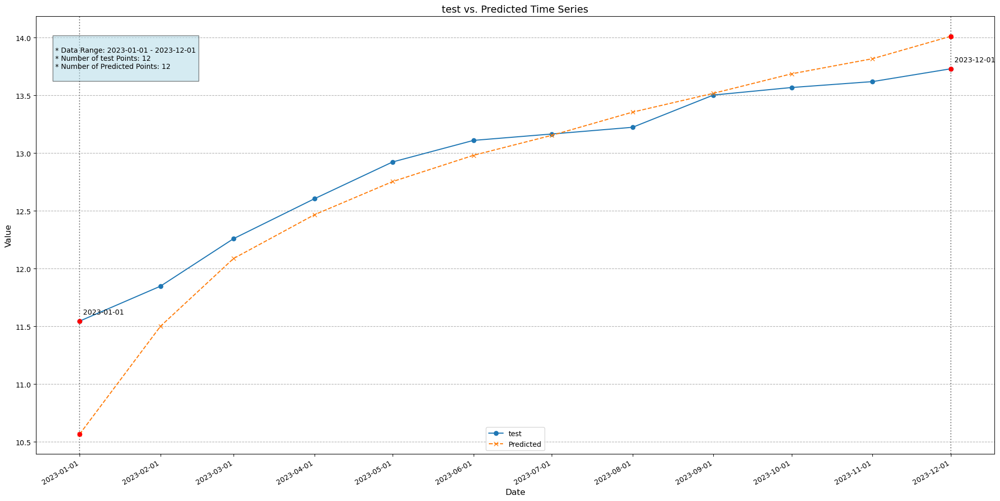

In [454]:
plt.figure(figsize=(20, 10))

# Plot the data
plt.plot(test.index, test, label='test', marker='o', linestyle='-')
plt.plot(predictions.index, predictions, label='Predicted', marker='x', linestyle='--')

# Highlight specific points
highlight_points = [test.index[0], test.index[11]]  # Replace with the desired datetimes you want to mark
for point in highlight_points:
    plt.scatter(point, test[point], color='red', zorder=5)
    plt.scatter(point, predictions[point], color='red', zorder=5)
    plt.axvline(point, color='gray', linestyle=':')

# Add annotations
for point in highlight_points:
    plt.annotate(f'{point.strftime("%Y-%m-%d")}', xy=(point, test[point]), xytext=(5, 10), textcoords='offset points')


# Customize appearance
plt.xlabel('Date', fontsize=12)
plt.ylabel('Value', fontsize=12)
plt.title('test vs. Predicted Time Series', fontsize=14)
plt.legend(fontsize=10)
plt.grid(axis='y', linestyle='--')

# Format date axis
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
plt.gca().xaxis.set_major_locator(mdates.MonthLocator(interval=1))  # Adjust interval as needed
plt.gcf().autofmt_xdate()

# Add text box with loaded details
text_box = """
* Data Range: {} - {}
* Number of test Points: {}
* Number of Predicted Points: {}
""".format(test.index[0].strftime("%Y-%m-%d"), test.index[-1].strftime("%Y-%m-%d"), len(test), len(predictions))  # Replace with actual details

plt.text(0.02, 0.95, text_box, transform=plt.gca().transAxes, verticalalignment='top', bbox=dict(facecolor='lightblue', alpha=0.5))

plt.tight_layout()
plt.show()


### Model Performance

In [455]:
new_row=evaluate_performance(f"Holt-Winter Yearly (log 2012-2022)", test.values, predictions.values)
res= pd.concat([res,new_row],axis=0,ignore_index=True)

In [456]:
row=mean_predicted(predictions)
predicted= pd.concat([predicted,row],axis=0,ignore_index=True)

# Results

In [457]:
from tabulate import tabulate

print(tabulate(res, headers='keys', tablefmt='psql',numalign='right'))

+----+------------------------------------------------------+------------+-------------+------------+-------------+
|    | Model                                                |        MAE |         MSE |       RMSE |        MAPE |
|----+------------------------------------------------------+------------+-------------+------------+-------------|
|  0 | ARIMA manual p,d,q selection Yearly                  | 1.8918e+18 | 5.10039e+36 | 2.2584e+18 | 4.44748e+14 |
|  1 | SARIMA manual p,d,q selection Yearly                 |     161584 | 2.66471e+10 |     163239 |     52.6293 |
|  2 | Auto SARIMA Yearly                                   |     223676 | 5.21995e+10 |     228472 |     64.8954 |
|  3 | Holt-Winter Yearly                                   |    58245.3 | 4.98664e+09 |    70616.1 |     13.8488 |
|  4 | ARIMA manual p,d,q selection Yearly (log 2002-2022)  |   0.430491 |    0.231845 |   0.481503 |     3.42002 |
|  5 | SARIMA manual p,d,q selection Yearly (log 2002-2022) |   0.193781

# Future Forecast

In [458]:
yearly_ensemble=pd.DataFrame()
forecast_future_ensemble= pd.DataFrame()

## Holt-Winter

In [459]:
T_and_F_hw=np.log(df_m_new[df_m_new.index.year>=2023]['Yearly Cumulative MWh annual production'])
test_2023=np.log(df_m_new[df_m_new.index.year==2023]['Yearly Cumulative MWh annual production'])

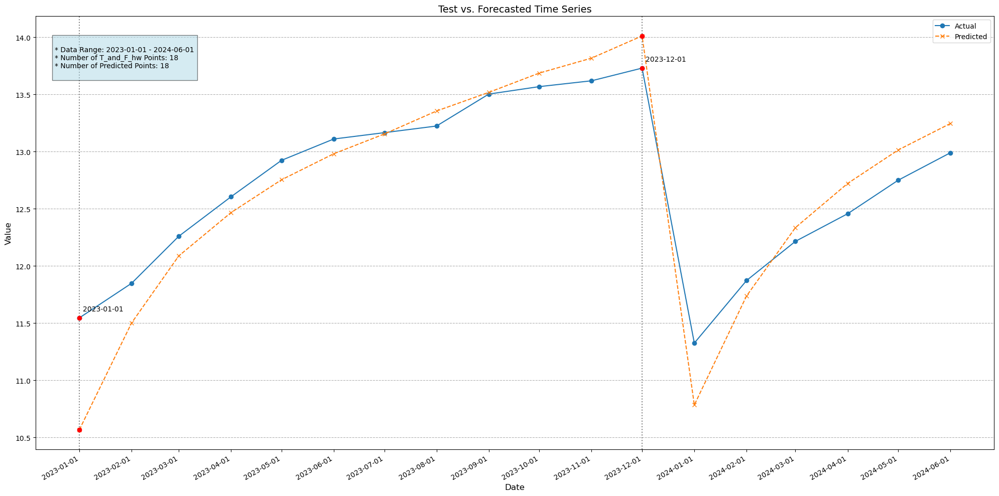

In [460]:
# forecast from 2023-Jan to 2024-Jun
forecast_hw=hwmodel.forecast(steps=12+6)
plt.figure(figsize=(20, 10))

# Plot the data

plt.plot(T_and_F_hw.index, T_and_F_hw, label='Actual', marker='o', linestyle='-')
plt.plot(forecast_hw.index, forecast_hw, label='Predicted', marker='x', linestyle='--')

# Highlight specific points
highlight_points = [T_and_F_hw.index[0], T_and_F_hw.index[11]]  # Replace with the desired datetimes you want to mark
for point in highlight_points:
    
    plt.scatter(point, T_and_F_hw[point], color='red', zorder=5)
    plt.scatter(point, forecast_hw[point], color='red', zorder=5)
    plt.axvline(point, color='gray', linestyle=':')

# Add annotations
for point in highlight_points:
    plt.annotate(f'{point.strftime("%Y-%m-%d")}', xy=(point, T_and_F_hw[point]), xytext=(5, 10), textcoords='offset points')


# Customize appearance
plt.xlabel('Date', fontsize=12)
plt.ylabel('Value', fontsize=12)
plt.title('Test vs. Forecasted Time Series', fontsize=14)
plt.legend(fontsize=10)
plt.grid(axis='y', linestyle='--')

# Format date axis
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
plt.gca().xaxis.set_major_locator(mdates.MonthLocator(interval=1))  # Adjust interval as needed
plt.gcf().autofmt_xdate()

# Add text box with loaded details
text_box = """
* Data Range: {} - {}
* Number of T_and_F_hw Points: {}
* Number of Predicted Points: {}
""".format(T_and_F_hw.index[0].strftime("%Y-%m-%d"), T_and_F_hw.index[-1].strftime("%Y-%m-%d"), len(T_and_F_hw), len(forecast_hw))  # Replace with actual details

plt.text(0.02, 0.95, text_box, transform=plt.gca().transAxes, verticalalignment='top', bbox=dict(facecolor='lightblue', alpha=0.5))

plt.tight_layout()
plt.show()

In [461]:
r=evaluate_performance("Holt-Winter", T_and_F_hw, forecast_hw)
forecast_future_ensemble= pd.concat([forecast_future_ensemble,r],axis=0,ignore_index=True)

In [462]:
row=mean_predicted(forecast_hw)
yearly_ensemble=pd.concat([yearly_ensemble,row],axis=0,ignore_index=True)

## SARIMA 

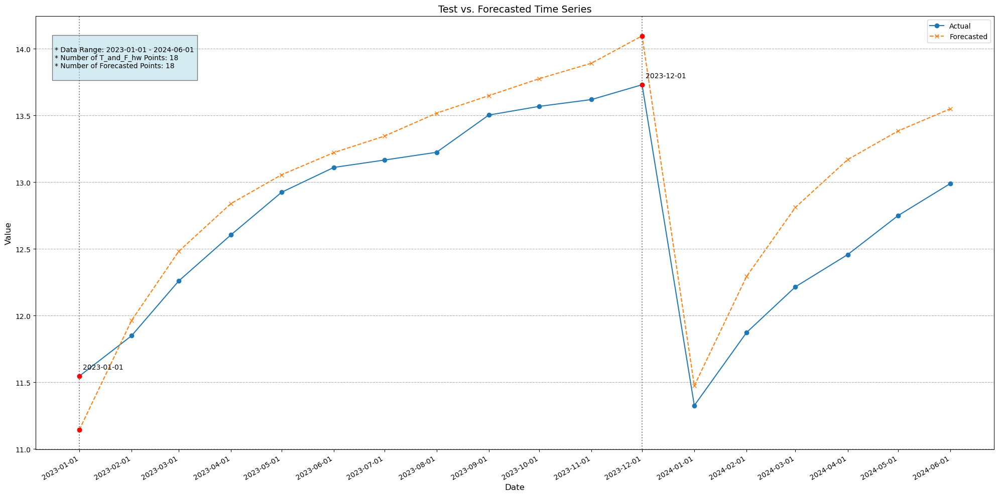

In [463]:
forecast_autoS=auto_model.predict(n_periods=12+6)

plt.figure(figsize=(20, 10))

# Plot the data

plt.plot(T_and_F_hw.index, T_and_F_hw, label='Actual', marker='o', linestyle='-')
plt.plot(forecast_autoS.index, forecast_autoS, label='Forecasted', marker='x', linestyle='--')

# Highlight specific points
highlight_points = [T_and_F_hw.index[0], T_and_F_hw.index[11]]  # Replace with the desired datetimes you want to mark
for point in highlight_points:
    
    plt.scatter(point, T_and_F_hw[point], color='red', zorder=5)
    plt.scatter(point, forecast_autoS[point], color='red', zorder=5)
    plt.axvline(point, color='gray', linestyle=':')

# Add annotations
for point in highlight_points:
    plt.annotate(f'{point.strftime("%Y-%m-%d")}', xy=(point, T_and_F_hw[point]), xytext=(5, 10), textcoords='offset points')


# Customize appearance
plt.xlabel('Date', fontsize=12)
plt.ylabel('Value', fontsize=12)
plt.title('Test vs. Forecasted Time Series', fontsize=14)
plt.legend(fontsize=10)
plt.grid(axis='y', linestyle='--')

# Format date axis
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
plt.gca().xaxis.set_major_locator(mdates.MonthLocator(interval=1))  # Adjust interval as needed
plt.gcf().autofmt_xdate()

# Add text box with loaded details
text_box = """
* Data Range: {} - {}
* Number of T_and_F_hw Points: {}
* Number of Forecasted Points: {}
""".format(T_and_F_hw.index[0].strftime("%Y-%m-%d"), T_and_F_hw.index[-1].strftime("%Y-%m-%d"), len(T_and_F_hw), len(forecast_autoS))  # Replace with actual details

plt.text(0.02, 0.95, text_box, transform=plt.gca().transAxes, verticalalignment='top', bbox=dict(facecolor='lightblue', alpha=0.5))

plt.tight_layout()
plt.show()

In [464]:
r=evaluate_performance("SARIMA", T_and_F_hw, forecast_autoS)
forecast_future_ensemble= pd.concat([forecast_future_ensemble,r],axis=0,ignore_index=True)

In [465]:
row=mean_predicted(forecast_autoS)
yearly_ensemble=pd.concat([yearly_ensemble,row],axis=0,ignore_index=True)

## ARIMA

In [466]:
start_date=pd.to_datetime('2023-01-01',format='%Y-%m-%d')
end_date= pd.to_datetime('2024-06-01',format='%Y-%m-%d')
forecast_arima=model_Arima_fit.predict(start=start_date,end=end_date)


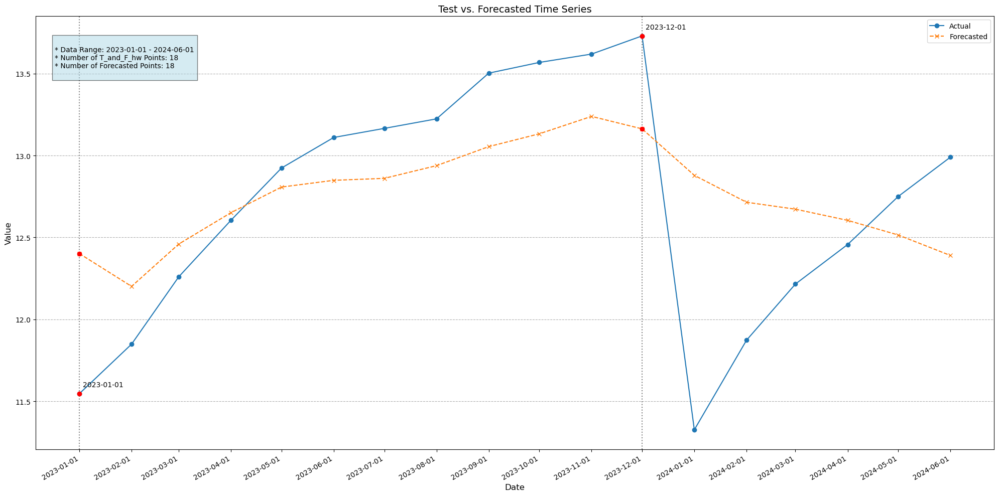

In [467]:
plt.figure(figsize=(20, 10))

# Plot the data

plt.plot(T_and_F_hw.index, T_and_F_hw, label='Actual', marker='o', linestyle='-')
plt.plot(forecast_arima.index, forecast_arima, label='Forecasted', marker='x', linestyle='--')

# Highlight specific points
highlight_points = [T_and_F_hw.index[0], T_and_F_hw.index[11]]  # Replace with the desired datetimes you want to mark
for point in highlight_points:
    
    plt.scatter(point, T_and_F_hw[point], color='red', zorder=5)
    plt.scatter(point, forecast_arima[point], color='red', zorder=5)
    plt.axvline(point, color='gray', linestyle=':')

# Add annotations
for point in highlight_points:
    plt.annotate(f'{point.strftime("%Y-%m-%d")}', xy=(point, T_and_F_hw[point]), xytext=(5, 10), textcoords='offset points')


# Customize appearance
plt.xlabel('Date', fontsize=12)
plt.ylabel('Value', fontsize=12)
plt.title('Test vs. Forecasted Time Series', fontsize=14)
plt.legend(fontsize=10)
plt.grid(axis='y', linestyle='--')

# Format date axis
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
plt.gca().xaxis.set_major_locator(mdates.MonthLocator(interval=1))  # Adjust interval as needed
plt.gcf().autofmt_xdate()

# Add text box with loaded details
text_box = """
* Data Range: {} - {}
* Number of T_and_F_hw Points: {}
* Number of Forecasted Points: {}
""".format(T_and_F_hw.index[0].strftime("%Y-%m-%d"), T_and_F_hw.index[-1].strftime("%Y-%m-%d"), len(T_and_F_hw), len(forecast_arima))  # Replace with actual details

plt.text(0.02, 0.95, text_box, transform=plt.gca().transAxes, verticalalignment='top', bbox=dict(facecolor='lightblue', alpha=0.5))

plt.tight_layout()
plt.show()

In [468]:
r=evaluate_performance("ARIMA", T_and_F_hw, forecast_arima)
forecast_future_ensemble= pd.concat([forecast_future_ensemble,r],axis=0,ignore_index=True)

In [469]:
row=mean_predicted(forecast_arima)
yearly_ensemble=pd.concat([yearly_ensemble,row],axis=0,ignore_index=True)

# Ensemble 

In [470]:
yearly_ensemble

,2023-01-01,2023-02-01,2023-03-01,2023-04-01,2023-05-01,2023-06-01,2023-07-01,2023-08-01,2023-09-01,2023-10-01,2023-11-01,2023-12-01,2024-01-01,2024-02-01,2024-03-01,2024-04-01,2024-05-01,2024-06-01
0,10.567631,11.501659,12.087765,12.466602,12.753768,12.981216,13.154021,13.355063,13.517959,13.686876,13.817446,14.011718,10.784949,11.737781,12.335496,12.721661,13.014258,13.245901
1,11.143692,11.963003,12.481526,12.839645,13.055123,13.221252,13.344937,13.517179,13.648298,13.775804,13.892070,14.096313,11.474062,12.292788,12.810948,13.168824,13.384163,13.550191
2,12.401507,12.201141,12.459494,12.651160,12.807532,12.848634,12.860622,12.938227,13.054469,13.132651,13.238887,13.162783,12.879067,12.714695,12.672509,12.604214,12.514951,12.389898


In [471]:
forecast_mean=yearly_ensemble.mean()

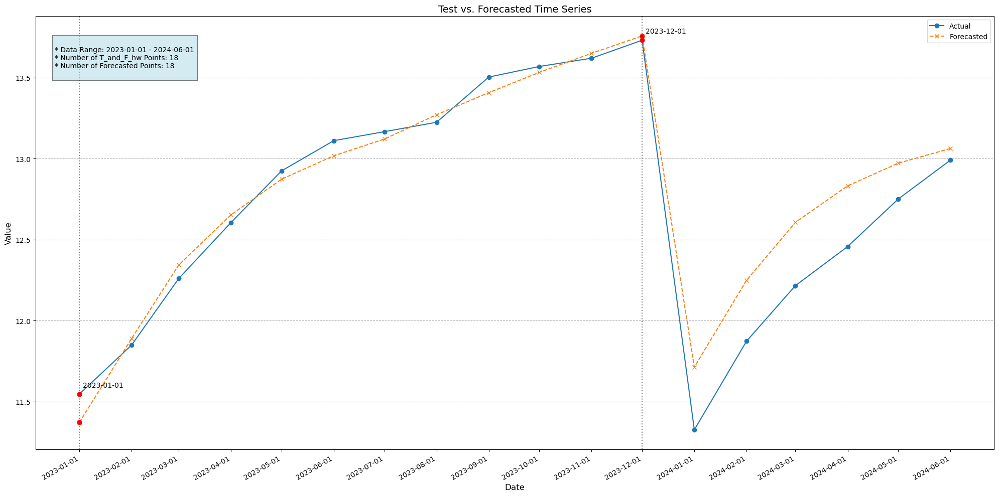

In [472]:
plt.figure(figsize=(20, 10))

# Plot the data

plt.plot(T_and_F_hw.index, T_and_F_hw, label='Actual', marker='o', linestyle='-')
plt.plot(forecast_mean.index, forecast_mean, label='Forecasted', marker='x', linestyle='--')

# Highlight specific points
highlight_points = [T_and_F_hw.index[0], T_and_F_hw.index[11]]  # Replace with the desired datetimes you want to mark
for point in highlight_points:
    
    plt.scatter(point, T_and_F_hw[point], color='red', zorder=5)
    plt.scatter(point, forecast_mean[point], color='red', zorder=5)
    plt.axvline(point, color='gray', linestyle=':')

# Add annotations
for point in highlight_points:
    plt.annotate(f'{point.strftime("%Y-%m-%d")}', xy=(point, T_and_F_hw[point]), xytext=(5, 10), textcoords='offset points')


# Customize appearance
plt.xlabel('Date', fontsize=12)
plt.ylabel('Value', fontsize=12)
plt.title('Test vs. Forecasted Time Series', fontsize=14)
plt.legend(fontsize=10)
plt.grid(axis='y', linestyle='--')

# Format date axis
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
plt.gca().xaxis.set_major_locator(mdates.MonthLocator(interval=1))  # Adjust interval as needed
plt.gcf().autofmt_xdate()

# Add text box with loaded details
text_box = """
* Data Range: {} - {}
* Number of T_and_F_hw Points: {}
* Number of Forecasted Points: {}
""".format(T_and_F_hw.index[0].strftime("%Y-%m-%d"), T_and_F_hw.index[-1].strftime("%Y-%m-%d"), len(T_and_F_hw), len(forecast_mean))  # Replace with actual details

plt.text(0.02, 0.95, text_box, transform=plt.gca().transAxes, verticalalignment='top', bbox=dict(facecolor='lightblue', alpha=0.5))

plt.tight_layout()
plt.show()

In [473]:
r=evaluate_performance("Ensemble",T_and_F_hw,forecast_mean)
forecast_future_ensemble= pd.concat([forecast_future_ensemble,r],axis=0,ignore_index=True)

In [474]:
from rich.console import Console
from rich.table import Table

console = Console()
table = Table(show_header=True, header_style="bold magenta")

# Add columns to the table
for column in forecast_future_ensemble.columns:
    table.add_column(column)

# Add rows to the table
for _, row in forecast_future_ensemble.iterrows():
    table.add_row(*[str(x) for x in row])

# Print the table
console.print(table)

┏━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━┓
┃ Model       ┃ MAE                 ┃ MSE                 ┃ RMSE                ┃ MAPE               ┃
┡━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━┩
│ Holt-Winter │ 0.23731037665671165 │ 0.10292026304663013 │ 0.32081188108707903 │ 1.9353290087760755 │
│ SARIMA      │ 0.3194713292765869  │ 0.13754319490002012 │ 0.37086816377254617 │ 2.5314709254865124 │
│ ARIMA       │ 0.4494184201213347  │ 0.32111326486207126 │ 0.5666685670319744  │ 3.633692657200286  │
│ Ensemble    │ 0.14410178000637458 │ 0.03930100046761997 │ 0.19824479934570785 │ 1.1774628109130434 │
└─────────────┴─────────────────────┴─────────────────────┴─────────────────────┴────────────────────┘

<div class='alert alert-block alert-success'>
    <b><u>Background and Rationale:</u></b><br>
Time series forecasting often involves complex patterns that are difficult to capture with a single model. Individual models, even when well-tuned, may have inherent biases or limitations due to their specific assumptions and structures. Ensemble forecasting addresses this by combining predictions from multiple diverse models. This approach capitalizes on the idea that different models might excel at capturing different aspects of the underlying data, leading to a more robust and accurate overall prediction<br></div>.
<b>Ensemble methods typically offer several benefits
:</b>

- Reduced Variance: The errors made by different models often offset each other, resulting in a less volatile forecast. 
- Improved Accuracy: By aggregating the strengths of various models, ensemble forecasting often achieves higher accuracy than any single constituent mo
el.
- Robustness to Overfitting: Ensembles tend to be less prone to overfitting, as they draw upon the collective knowledge of multiple models rather than relying heavily on a single one.

<b><u>Ensemble Forecasting Outperforms Individual Models:</u></b><br>
</b><br>

- The ensemble forecast consistently demonstrated lower MSE, RMSE, and MAPE values than any of the individual models. This indicates that combining the predictions of multiple models yielded a more accurate and reliable forecast for the adoption rate of solar farms in New York State.

<b><u>Heteroskedasticity Mitigation:</b></u><br>
Applying the log transformation to the data significantly reduced heteroskedasticity, improving the ARIMA model's fit and predictive capability. This highlights the importance of addressing data characteristics before applying time series models.
<br><b><u>Diverse Model Contributions:</u></b><br>
The fact that an ensemble of diverse models (ARIMA, SARIMA, and Holt-Winters) outperformed individual models suggests that each model captures different aspects of the underlying solar energy adoption trend.
<br><b><u>Reduced Uncertainty:</u></b><br>
By averaging the predictions of multiple models, we reduced the overall forecast uncertainty. This is evident in the lower error metrics observed for the ensemble compared to individual models.

<b>Why Ensemble Forecasting is Effective:</b>

<b>Variance Reduction:</b> Different models are prone to different errors. By averaging their predictions, we mitigate the impact of individual model errors and achieve a more stable forecast.
<br><b>Model Diversity:</b> Each model type (ARIMA, SARIMA, Holt-Winters) has its strengths and weaknesses. Combining them allows us to leverage their individual strengths and compensate for their weaknesses, leading to a more robust and comprehensive forecast.
<br><b>Capturing Complex Patterns:</b> Real-world time series data often exhibit complex patterns. An ensemble of models with different assumptions and structures can more effectively capture these complexities than a single model.

<br><b>Implications and Future Work</b>

The success of ensemble forecasting in this project highlights its potential for accurate prediction of solar energy adoption trends. This methodology can be applied to other energy sectors and geographical regions to guide policymaking and investment decaccuracy.